# Import des librairies

In [1]:
#pip install wordcloud

In [625]:
# builtin
import os, sys, time, random

# data
import pandas as pd
import numpy as np
import copy
from copy import deepcopy


# NTL
import nltk
from nltk.stem.snowball import EnglishStemmer
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.tokenize import word_tokenize, wordpunct_tokenize
from nltk.corpus import words
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer



# sklearn
from sklearn import manifold, decomposition
from sklearn import cluster, metrics
# Viz
import matplotlib.pyplot as plt
import seaborn as sns
%pylab inline

#from wordcloud import WordCLoud
from wordcloud.wordcloud import WordCloud
from PIL import Image


# import plotly as px

from pandarallel import pandarallel


Populating the interactive namespace from numpy and matplotlib


C:\Users\laeti\Anaconda3\lib\site-packages\IPython\core\magics\pylab.py:159: UserWarning: pylab import has clobbered these variables: ['random', 'copy']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [626]:
data = pd.read_csv('flipkart_com-ecommerce_sample_1050.csv', sep=',')

# Comprendre la forme et la structure de nos données

## Affichage des données

Voici comment se présentent nos données

In [627]:
data.head(5)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [628]:
data.tail(5)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
1045,958f54f4c46b53c8a0a9b8167d9140bc,2015-12-01 10:15:43 +0000,http://www.flipkart.com/oren-empower-extra-lar...,Oren Empower Extra Large Self Adhesive Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE88ZGTX65GH4V,1399.0,999.0,958f54f4c46b53c8a0a9b8167d9140bc.jpg,False,Oren Empower Extra Large Self Adhesive Sticker...,No rating available,No rating available,Oren Empower,"{""product_specification""=>[{""key""=>""Number of ..."
1046,fd6cbcc22efb6b761bd564c28928483c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-large-vinyl...,Wallmantra Large Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZD5GDCVQ,4930.0,1896.0,fd6cbcc22efb6b761bd564c28928483c.jpg,False,Wallmantra Large Vinyl Sticker Sticker (Pack o...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1047,5912e037d12774bb73a2048f35a00009,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-extra-large-p...,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE5UVGW2JWVWCT,4500.0,1449.0,5912e037d12774bb73a2048f35a00009.jpg,False,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,No rating available,No rating available,Uberlyfe,"{""product_specification""=>[{""key""=>""Number of ..."
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-medium-viny...,Wallmantra Medium Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZGFD3RCE,3465.0,1333.0,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,False,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1049,f2f027ad6a6df617c9f125173da71e44,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-large-vinyl-s...,Uberlyfe Large Vinyl Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE2ZEPACRQJKH7,1190.0,595.0,f2f027ad6a6df617c9f125173da71e44.jpg,False,Buy Uberlyfe Large Vinyl Sticker for Rs.595 on...,4,4,Uberlyfe,"{""product_specification""=>[{""key""=>""Sales Pack..."


In [629]:
data.sample(20)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
327,f3ad282dac6ef0e30585a49ac67a322b,2015-12-01 06:13:00 +0000,http://www.flipkart.com/edimax-br-6428nc/p/itm...,Edimax BR-6428NC,"[""Computers >> Network Components >> Routers >...",RTRDZBJ5VAZG7VGC,3330.0,2000.0,f3ad282dac6ef0e30585a49ac67a322b.jpg,False,Buy Edimax BR-6428NC only for Rs. 2150 from Fl...,2.3,2.3,Edimax,"{""product_specification""=>[{""key""=>""Wireless S..."
833,6e7cc21610991cab64595af678e8eb5a,2015-12-29 05:07:38 +0000,http://www.flipkart.com/tapawire-portable-usb-...,Tapawire Portable USB Flexible Stick Dimmable ...,"[""Computers >> Laptop Accessories >> USB Gadge...",USGEDRPHJHRGHJNH,699.0,449.0,6e7cc21610991cab64595af678e8eb5a.jpg,False,Buy Tapawire Portable USB Flexible Stick Dimma...,No rating available,No rating available,Tapawire,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1025,30ad2acaccdd2e1691a61c44079c2b5a,2016-03-03 06:06:42 +0000,http://www.flipkart.com/print-shapes-monster-u...,PRINT SHAPES monster university party Laptop S...,"[""Computers >> Laptop Accessories >> Computer ...",LACEGEZD7WRGFAAG,999.0,329.0,30ad2acaccdd2e1691a61c44079c2b5a.jpg,False,Key Features of PRINT SHAPES monster universit...,No rating available,No rating available,PRINT SHAPES,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
446,d7fded8e211b3033e424fb450b97caec,2016-06-10 22:31:19 +0000,http://www.flipkart.com/hako-85w-magsafe-lapto...,Hako 85W Magsafe Laptop Charger For APPLE MacB...,"[""Computers >> Laptop Accessories >> Laptop Ad...",ACCEJ6TFUBHAYTM8,2499.0,1849.0,d7fded8e211b3033e424fb450b97caec.jpg,False,Key Features of Hako 85W Magsafe Laptop Charge...,No rating available,No rating available,Hako,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
593,87f256eeace1a0c2b1f934f061646da5,2016-05-10 11:57:25 +0000,http://www.flipkart.com/greenwich-baby-girl-s-...,GREENWICH Baby Girl's Black Jeggings,"[""Baby Care >> Infant Wear >> Baby Girls' Clot...",LJGEHB6FRGN73YZA,225.0,225.0,87f256eeace1a0c2b1f934f061646da5.jpg,False,Key Features of GREENWICH Baby Girl's Black Je...,No rating available,No rating available,GREENWICH,"{""product_specification""=>[{""value""=>""1 JEGGIN..."
527,41ae5a7304f3dc1dc8bc2dfc7765ae4d,2016-01-07 05:50:25 +0000,http://www.flipkart.com/maxima-06362cmgy-gold-...,Maxima 06362CMGY Gold Analog Watch - For Men,"[""Watches >> Wrist Watches >> Maxima Wrist Wat...",WATDJTR93NB8HHQC,1075.0,995.0,41ae5a7304f3dc1dc8bc2dfc7765ae4d.jpg,False,Maxima 06362CMGY Gold Analog Watch - For Men ...,5,5,NaN,"{""product_specification""=>[{""key""=>""Date Displ..."
187,f69bef5db54cb4c83b2aa8d0ce829d4e,2015-12-01 12:40:44 +0000,http://www.flipkart.com/prithish-wild-free-cer...,Prithish Wild And Free Ceramic Mug,"[""Kitchen & Dining >> Coffee Mugs >> Prithish ...",MUGEB7J7GPWUH6Q5,499.0,175.0,f69bef5db54cb4c83b2aa8d0ce829d4e.jpg,False,Prithish Wild And Free Ceramic Mug (330 ml)\r\...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va..."
390,ae19a81b730b48b87ca72521af8fb902,2015-12-01 06:13:00 +0000,http://www.flipkart.com/tp-link-4-port-cable-d...,TP-LINK 4-Port Cable/DSL/TL-R460,"[""Computers >> Network Components >> Routers >...",RTRDPA9FNCRGS8UZ,1199.0,1199.0,ae19a81b730b48b87ca72521af8fb902.jpg,True,Buy TP-LINK 4-Port Cable/DSL/TL-R460 only for ...,3,3,TP-LINK,"{""product_specification""=>[{""key""=>""Firewall"",..."
925,5307e0db12b1018746ac3801d189c379,2016-01-01 13:15:34 +0000,http://www.flipkart.com/home-delight-130-inch-...,Home Delight 130 inch Pink Rice Lights,"[""Home Decor & Festive Needs >> Decorative Lig...",RCLEBAWZJHAQWXCT,300.0,199.0,5307e0db12b1018746ac3801d189c379.jpg,False,Home Delight 130 inch Pink Rice Lights (Pack o...,No rating available,No rating available,Home Delight,"{""product_specification""=>[{""key""=>""Bra

In [631]:
data['description'][0]

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

## Structure des données

In [632]:
data.shape

(1050, 15)

Nos données comportent 1050 individus ou lignes et 15 colonnes ou variables. 

In [10]:
data.dtypes

uniq_id                     object
crawl_timestamp             object
product_url                 object
product_name                object
product_category_tree       object
pid                         object
retail_price               float64
discounted_price           float64
image                       object
is_FK_Advantage_product       bool
description                 object
product_rating              object
overall_rating              object
brand                       object
product_specifications      object
dtype: object

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [12]:
data.dtypes.value_counts()

object     12
float64     2
bool        1
dtype: int64

In [13]:
data.nunique()

uniq_id                    1050
crawl_timestamp             149
product_url                1050
product_name               1050
product_category_tree       642
pid                        1050
retail_price                354
discounted_price            424
image                      1050
is_FK_Advantage_product       2
description                1050
product_rating               27
overall_rating               27
brand                       490
product_specifications      984
dtype: int64

In [637]:
tmp = data.nunique()
tmp

uniq_id                    1050
crawl_timestamp             149
product_url                1050
product_name               1050
product_category_tree       642
pid                        1050
retail_price                354
discounted_price            424
image                      1050
is_FK_Advantage_product       2
description                1050
product_rating               27
overall_rating               27
brand                       490
product_specifications      984
dtype: int64

In [638]:
tmp[tmp<10]

is_FK_Advantage_product    2
dtype: int64

In [639]:
tmp[tmp>1000]

uniq_id         1050
product_url     1050
product_name    1050
pid             1050
image           1050
description     1050
dtype: int64

# Les valeurs manquantes et les doublons

## Les valeurs manquantes

In [17]:
data.isna().sum()

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      338
product_specifications       1
dtype: int64

In [18]:
data.isna().mean()

uniq_id                    0.000000
crawl_timestamp            0.000000
product_url                0.000000
product_name               0.000000
product_category_tree      0.000000
pid                        0.000000
retail_price               0.000952
discounted_price           0.000952
image                      0.000000
is_FK_Advantage_product    0.000000
description                0.000000
product_rating             0.000000
overall_rating             0.000000
brand                      0.321905
product_specifications     0.000952
dtype: float64

In [19]:
data.isna().mean().sort_values()

uniq_id                    0.000000
crawl_timestamp            0.000000
product_url                0.000000
product_name               0.000000
product_category_tree      0.000000
pid                        0.000000
image                      0.000000
is_FK_Advantage_product    0.000000
description                0.000000
product_rating             0.000000
overall_rating             0.000000
retail_price               0.000952
discounted_price           0.000952
product_specifications     0.000952
brand                      0.321905
dtype: float64

Nous voyons que description n'a pas de valeurs manquantes.

## Les valeurs dupliquées

In [22]:
data.duplicated().sum()

0

# Inspection des données

In [24]:
data.describe(include = np.number)

,retail_price,discounted_price
count,1049.000000,1049.000000
mean,2186.197331,1584.527169
std,7639.229411,7475.099680
min,35.000000,35.000000
25%,555.000000,340.000000
50%,999.000000,600.000000
75%,1999.000000,1199.000000
max,201000.000000,201000.000000


In [633]:
data.describe(include = object)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,image,description,product_rating,overall_rating,brand,product_specifications
count,1050,1050,1050,1050,1050,1050,1050,1050,1050,1050,712,1049
unique,1050,149,1050,1050,642,1050,1050,1050,27,27,490,984
top,55b85ea15a1536d46b7190ad6fff8ce7,2015-12-01 12:40:44 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",CRNEG7BKMFFYHQ8Z,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,PRINT SHAPES,"{""product_specification""=>[{""key""=>""Type"", ""va..."
freq,1,150,1,1,56,1,1,1,889,889,11,22


# Premier nettoyage des données

In [640]:
tmp = data.dtypes
tmp

uniq_id                     object
crawl_timestamp             object
product_url                 object
product_name                object
product_category_tree       object
pid                         object
retail_price               float64
discounted_price           float64
image                       object
is_FK_Advantage_product       bool
description                 object
product_rating              object
overall_rating              object
brand                       object
product_specifications      object
dtype: object

In [641]:
cols = ['product_name', 'product_category_tree','image', 'is_FK_Advantage_product', 'description']
data_new = data[cols]
data_new.head()

,product_name,product_category_tree,image,is_FK_Advantage_product,description
0,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...
1,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...
2,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...
3,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...
4,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...


In [28]:
data_new.isnull().sum()

product_category_tree      0
image                      0
is_FK_Advantage_product    0
description                0
dtype: int64

In [29]:
data_new.shape

(1050, 4)

# Longueur

In [642]:
data_new.describe(include = 'object')

,product_name,product_category_tree,image,description
count,1050,1050,1050,1050
unique,1050,642,1050,1050
top,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...
freq,1,56,1,1


In [643]:
data_new.description.apply(lambda i : len(i))

0       1420
1        444
2       1258
3        858
4       1197
        ... 
1045    2432
1046    1660
1047     262
1048     210
1049     187
Name: description, Length: 1050, dtype: int64

C:\Users\laeti\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='description'>

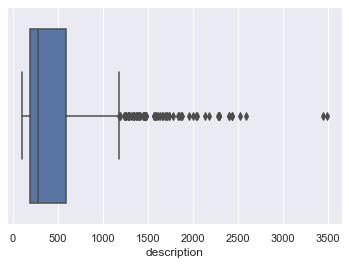

In [644]:
tmp = data_new.description.str.len()
sns.boxplot(tmp)

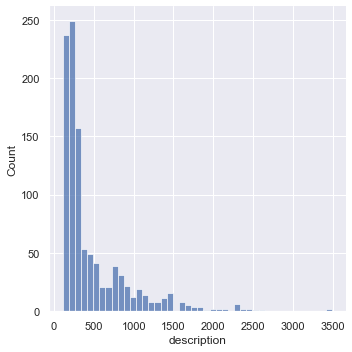

In [645]:
sns.displot(tmp)

In [646]:
data_new['_len_description'] = tmp
data_new.head()

C:\Users\laeti\AppData\Local\Temp/ipykernel_17988/3930589687.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_new['_len_description'] = tmp


,product_name,product_category_tree,image,is_FK_Advantage_product,description,_len_description
0,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,1420
1,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,444
2,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,1258
3,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,858
4,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,1197


C:\Users\laeti\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:633: UserWarning: The handle <BarContainer object of 50 artists> has a label of '_len_description' which cannot be automatically added to the legend.
  ax.legend(handles, labels, loc="best", title=title)


<Figure size 1440x1080 with 0 Axes>

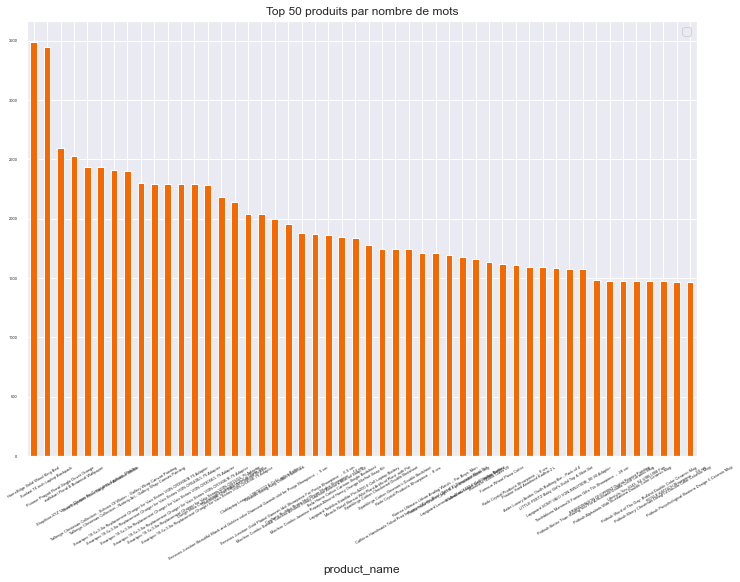

In [648]:
plt.figure(figsize = (20, 15))
data1 = data_new.sort_values(by = '_len_description', ascending=False).head(50)
data1.plot(x = 'product_name', y ='_len_description', kind='bar', color="#f56900", rot=30, fontsize = 4, title='Top 50 produits par nombre de mots', figsize = (12,8))
plt.show()

In [49]:
data_new.sort_values('_len_description').head(10)

,product_category_tree,image,is_FK_Advantage_product,description,_len_description
877,"[""Home Furnishing >> Bath Linen >> Towels""]",c943647eee4de99fc1b4e233b9a7f47d.jpg,False,Buy Nkp Cotton Bath Towel at Rs. 549 at Flipka...,109
890,"[""Home Furnishing >> Bath Linen >> Towels""]",72db37ec42ee76d79cf395221e0f4cce.jpg,False,Buy IWS Cotton Bath Towel at Rs. 299 at Flipka...,109
1030,"[""Beauty and Personal Care >> Health Care >> M...",4d6bf06ef01f80130a1ab28dfdeb7aa3.jpg,False,Specifications of OMRD RD6697 Hot and cold Pac...,111
651,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",705b90361aeda1849a728d80625a78a9.jpg,False,Buy Marvel Cotton Bath Towel at Rs. 449 at Fli...,112
892,"[""Home Furnishing >> Bath Linen >> Towels""]",6858fd9265d348803b18667fe43cd054.jpg,False,Buy MB Cotton Set of Towels at Rs. 1195 at Fli...,112
599,"[""Baby Care >> Infant Wear >> Baby Girls' Clot...",84b2e623a4a4327b88f7fe197a09be31.jpg,False,Next Steps Baby Girl's Layered Dress\r\n ...,112
1005,"[""Beauty and Personal Care >> Makeup >> Eyes >...",cb096f17218f0e4ccd7424963e2cd0f8.jpg,False,Specifications of Milani Runway shadow Wet/Dry...,113
678,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",22ac36ba254a68d7dd6173f099771147.jpg,False,Buy Neyth Cotton Set of Towels at Rs. 170 at F...,114
874,"[""Home Furnishing >> Bath Linen >> Towels""]",da8017c195b3bfa4ef002968a3542707.jpg,False,Buy Mafatlal Cotton Bath Towel at Rs. 545 at F...,114
884,"[""Home Furnishing >> Bath Linen >> Towels""]",d395b2f3d13ff8897f403c6141e0e39a.jpg,False,Buy Amber Cotton Set of Towels at Rs. 239 at F...,114


In [50]:
data_new.sort_values('_len_description').tail(10)

,product_category_tree,image,is_FK_Advantage_product,description,_len_description
433,"[""Computers >> Laptop Accessories >> Adapters ...",32f24a4303050f500dec7cb3608fe089.jpg,False,"Key Features of Smartpro 19.5v,3.9a Replacemen...",2297
435,"[""Computers >> Laptop Accessories >> Adapters ...",3ccceaae844f34180708cb6cba3441bf.jpg,False,"Key Features of Smartpro 19.5v,3.9a Replacemen...",2298
696,"[""Home Decor & Festive Needs >> Wall Decor & C...",82fbc93cd45ab747e7e606f2c52c7335.jpg,False,Tallenge Christmas Collection - Nativity Art -...,2405
694,"[""Home Decor & Festive Needs >> Wall Decor & C...",0ae859a69c7608d8197c3ba8c37bc6ec.jpg,False,Tallenge Christmas Collection - Echoes Of Wint...,2409
1045,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",958f54f4c46b53c8a0a9b8167d9140bc.jpg,False,Oren Empower Extra Large Self Adhesive Sticker...,2432
589,"[""Computers >> Laptop Accessories >> Cleaning ...",621a88993a7033df3440ec816c2e386f.jpg,False,"Shopfloor.XYZ Vacuum Cleaner for Computers, La...",2436
916,"[""Home Decor & Festive Needs >> Wall Decor & C...",c5c559012b742d9966df82182b90c6da.jpg,False,Key Features of wallskart Floral & Botanical W...,2529
715,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",d68b774e9529a4b94a5c6c8943a1b8b3.jpg,False,Pioneer Pragati Floral Single Duvet Orange (1 ...,2594
639,"[""Computers >> Laptop Accessories >> Laptop Ba...",aeb421e416716d5f037d50e8c3b14cd7.jpg,False,Key Features of Sunlast 16 inch Laptop Backpac...,3447
437,"[""Beauty and Personal Care >> Health Care >> H...",b6c339777814451815fe7950fd4c8536.jpg,False,Key Features of HomeEdge Solid Wood King Bed K...,3490


In [51]:
data_new.drop(['_len_description'], axis=1, inplace = True)
data_new.head()

C:\Users\laeti\Anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


,product_category_tree,image,is_FK_Advantage_product,description
0,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...
1,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...
2,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...
3,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...
4,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...


In [52]:
data_new.to_csv('data_cleaned.csv', index = False)

# Explorer le corpus et les documents. 

## Imprimons les documents au hasard

In [649]:
data_samp = data_new.sample(20)
data_samp

,product_name,product_category_tree,image,is_FK_Advantage_product,description,_len_description
216,Go Hooked Wheel Pizza Cutter,"[""Kitchen & Dining >> Kitchen Tools >> Kitchen...",2110699b945ae766c8b8112038ac58b9.jpg,False,Buy Go Hooked Wheel Pizza Cutter for Rs.199 on...,187
212,Orange Tree Maxim Wall Decor Set Of 3 Showpiec...,"[""Home Decor & Festive Needs >> Showpieces >> ...",de29bf3288345e23b0e25345a3a057fb.jpg,False,Orange Tree Maxim Wall Decor Set Of 3 Showpiec...,527
275,Babeezworld Baby Boy's Romper,"[""Baby Care >> Infant Wear >> Baby Boys' Cloth...",719677b02bfccafb86e9be78f36f938b.jpg,False,Key Features of Babeezworld Baby Boy's Romper ...,829
775,Carter'S Self Design Single Blanket Multicolor,"[""Baby Care >> Baby Bedding >> Baby Blankets >...",93618b8a998782d4d847ee5cba5c7de2.jpg,False,Buy Carter'S Self Design Single Blanket Multic...,134
320,"Layer'r Shot Compact Impact ,Explode And Turbo...","[""Beauty and Personal Care >> Fragrances >> De...",3ee79b1e51c9f9262e8373ce6b717606.jpg,False,Flipkart.com: Buy Layer'r Shot Compact Impact ...,226
273,Ndura Kadhai 1.7 L,"[""Kitchen & Dining >> Cookware >> Pots & Pans ...",6a1afb657e9ac01e3ca1956dfdcc3e9a.jpg,False,Ndura Kadhai 1.7 L\r\n ...,568
487,Lapguard Dell U661H Compatible Black 6 Cell La...,"[""Computers >> Laptop Accessories >> Batteries...",98659fb98a4fe903f21f5c315adbaede.jpg,False,Buy Lapguard Dell U661H Compatible Black 6 Cel...,185
250,TRUE Bong,"[""Home Decor & Festive Needs >> TRUE Home Deco...",17611e6e94d73ef376834e5c6ee03dde.jpg,False,Buy TRUE Bong for Rs.549 online. TRUE Bong at ...,149
87,Eureka.in GSEB Class VII,"[""Computers >> Software >> Language Learning >...",e8ee7868b0c3d1d04b482cd4f3ec5ccc.jpg,False,Key Features of Product The graphically rich 3...,1632
386,French Factor Man of the Year Deodorant Gift S...,"[""Beauty and Personal Care >> Fragrances >> De...",59d964c38c787f829c6cfa5629e4df90.jpg,False,Flipkart.com: Buy French Factor Man of the Yea...,206


In [650]:
for idx, ser in data_samp.iterrows():
    print(ser['description'])

Buy Go Hooked Wheel Pizza Cutter for Rs.199 online. Go Hooked Wheel Pizza Cutter at best prices with FREE shipping & cash on delivery. Only Genuine Products. 30 Day Replacement Guarantee.
Orange Tree Maxim Wall Decor Set Of 3 Showpiece  -  4 cm (Iron, Gold)
                         Price: Rs. 1,999
				
			Metal saucer with a hammered look floats a classic round mirror in the center. These set of 3 in ant. Copper plating lets your imagination loose by creating interesting combinations on any wall surface
Metal saucer with a hammered look floats a classic round mirror in the center. These set of 3 in ant. Copper plating lets your imagination loose by creating interesting combinations on any wall surface
Key Features of Babeezworld Baby Boy's Romper Fabric: Cotton Brand Color: Blue:Green,Babeezworld Baby Boy's Romper Price: Rs. 499 Babeezworld presents a cute baby dungaree set for your little one.This dungaree set comes with a trendy round neck cotton t-shirt with shoulder loops for ease

# Mettre des catégories

In [1260]:
data['product_category_tree']

0       ["Home Furnishing >> Curtains & Accessories >>...
1       ["Baby Care >> Baby Bath & Skin >> Baby Bath T...
2       ["Baby Care >> Baby Bath & Skin >> Baby Bath T...
3       ["Home Furnishing >> Bed Linen >> Bedsheets >>...
4       ["Home Furnishing >> Bed Linen >> Bedsheets >>...
                              ...                        
1045    ["Baby Care >> Baby & Kids Gifts >> Stickers >...
1046    ["Baby Care >> Baby & Kids Gifts >> Stickers >...
1047    ["Baby Care >> Baby & Kids Gifts >> Stickers >...
1048    ["Baby Care >> Baby & Kids Gifts >> Stickers >...
1049    ["Baby Care >> Baby & Kids Gifts >> Stickers >...
Name: product_category_tree, Length: 1050, dtype: object

In [657]:
# Définition d'une fonction à appliquer
def get_categories_from_series(series):
    
    # --------------------------------------
    # Fonction pour obtenir les 3 premières catégories
    def get_categories_from_cell(cell):
        # Supprimer les caractères indésirables
        product_category_tree = cell.strip('[]"')

        # Obtenir (au plus) les 3 premières catégories de l'arbre des catégories
        product_categories_list = product_category_tree.split(" >> ")
        
        # Initialisation
        categories = pd.Series()
        
        # pour chaque catégorie, ajoutez une ligne
        for i in range(min(3, len(product_categories_list))):
            categories["_cat_{}".format(i+1)] = product_categories_list[i]
        
        # retourne pd.Series avec 3 lignes
        return categories

    # ------------------------------------------------
    # Procéder au fractionnement
    categories_df = series.apply(get_categories_from_cell).fillna("")

    # Renvoie le frequency_encoding pd.DataFrame
    return categories_df

categories_df = get_categories_from_series(data_new['product_category_tree'])


# Ajouter les colonnes de catégories aux données DataFrame
data_cat = pd.concat(
    [data_new, categories_df],
    sort=False,
    axis=1
)

# Afficher les résultats
data_cat.head(2)


C:\Users\laeti\AppData\Local\Temp/ipykernel_17988/1323999236.py:14: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  categories = pd.Series()


,product_name,product_category_tree,image,is_FK_Advantage_product,description,_len_description,_cat_1,_cat_2,_cat_3
0,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,1420,Home Furnishing,Curtains & Accessories,Curtains
1,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,444,Baby Care,Baby Bath & Skin,Baby Bath Towels


In [658]:
data_cat['_cat_1'].unique()

array(['Home Furnishing', 'Baby Care', 'Watches',
       'Home Decor & Festive Needs', 'Kitchen & Dining',
       'Beauty and Personal Care', 'Computers'], dtype=object)

In [659]:
data_cat['_cat_2'].unique()

array(['Curtains & Accessories', 'Baby Bath & Skin', 'Bed Linen',
       'Wrist Watches', 'Living Room Furnishing', 'Bath Linen',
       'Candles & Fragrances', 'Tableware & Cutlery', 'Lighting',
       'JMD Home Furnishing', 'Infant Wear', "Kripa's Home Furnishing",
       'Hair Care', 'Coffee Mugs', 'Network Components',
       'Tablet Accessories', 'Cookware', 'Laptop Accessories', 'Makeup',
       'Combos and Kits', 'Feeding & Nursing', 'Baby Bedding',
       'Kitchen & Dining Linen', 'Containers & Bottles',
       'Consumables & Disposables', 'Wall Decor & Clocks',
       'Table Decor & Handicrafts', 'Flowers, Plants & Vases', 'Software',
       'Showpieces', 'Furniture & Furnishings',
       'Decorative Lighting & Lamps', 'Baby Grooming',
       'Computer Peripherals', 'Cushions, Pillows & Covers', 'Storage',
       'Health Care', 'Body and Skin Care', 'Kitchen Tools',
       'TRUE Home Decor & Festive Needs', 'Living', 'Showpiece',
       'Bar & Glassware', 'Fragrances', "Women'

In [660]:
data_cat['_cat_3'].unique()

array(['Curtains', 'Baby Bath Towels', 'Bedsheets',
       'Maserati Time Wrist Watches', 'Camerii Wrist Watches',
       'T STAR Wrist Watches', 'Alfajr Wrist Watches',
       'TAG Heuer Wrist Watches', 'Calibro Wrist Watches',
       'Cartier Wrist Watches', 'Lois Caron Wrist Watches',
       'Titan Wrist Watches', 'Srushti Art Jewelry Wrist Watches',
       'Escort Wrist Watches', 'Jack klein Wrist Watches',
       'North Moon Wrist Watches', 'Franck Bella Wrist Watches',
       'Ridas Wrist Watches', 'Skmei Wrist Watches', 'Now Wrist Watches',
       'fastrack Wrist Watches', 'Disney Wrist Watches',
       'Vizion Wrist Watches', 'Elantra Wrist Watches',
       'Marvel Wrist Watches', 'Lenco Wrist Watches',
       "D'Signer Wrist Watches", 'Diwan Sets', 'Duvet Covers',
       'Bath Mats', 'Home Fragrances', 'Jug, Glass & Tray Sets', 'Bulbs',
       'JMD Printed Cushions Cover (Pack of 2, 40 cm*40 ...',
       "Baby Girls' Clothes",
       "Kripa's Printed Cushions Cover (Pack of 2,

## Répartition des catégories

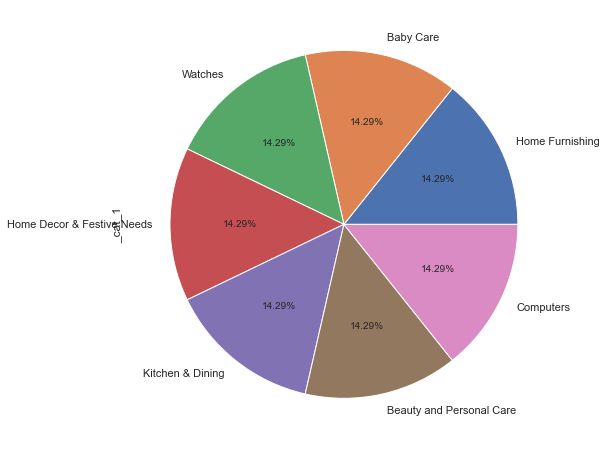

In [661]:
data_etat = data_cat['_cat_1'].value_counts()
ax=data_etat.plot(kind='pie',autopct='%.2f%%',labels=data_etat.index,figsize=(12,8))
plt.show()

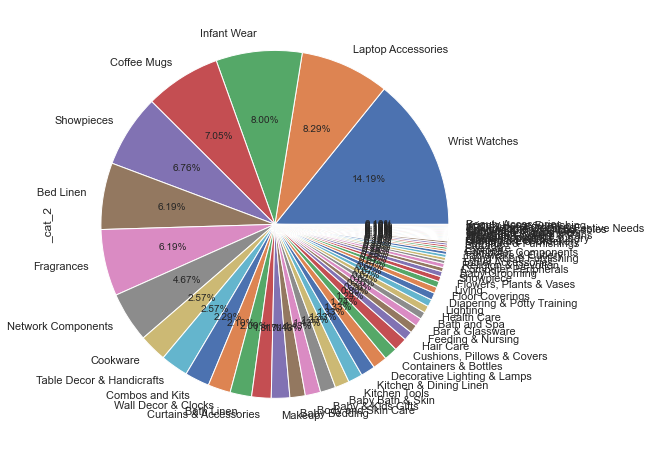

In [662]:
data_etat = data_cat['_cat_2'].value_counts()
ax=data_etat.plot(kind='pie',autopct='%.2f%%',labels=data_etat.index,figsize=(12,8))
plt.show()

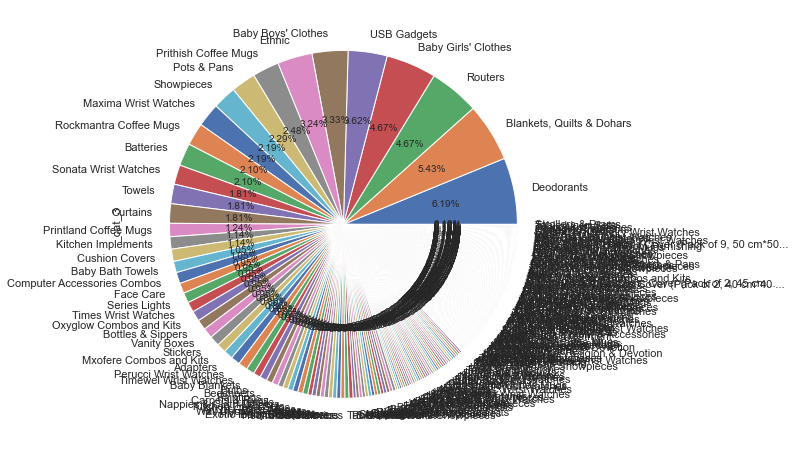

In [663]:
data_etat = data_cat['_cat_3'].value_counts()
ax=data_etat.plot(kind='pie',autopct='%.2f%%',labels=data_etat.index,figsize=(12,8))
plt.show()

## Lire les descriptions des produits au hasard par catégories

In [703]:
des = data_cat[data_cat['_cat_1']== 'Baby Care'].description.sample(10)
#des = doc.values[0]
print(des)

909    Specifications of Portia Hat (Pink, Pack of 1)...
629    Specifications of Kushies baby Baby Girl's Shr...
972    Key Features of CALCULUS Baby Boy's Printed Ca...
732    Sonpra Baby Boy's Bodysuit\r\n                ...
464    Key Features of Fs Mini Klub Baby Girl's Fit a...
640    Specifications of NammaBaby Baby Girl's Animal...
967    Key Features of Mahadev Handicrafts Cotton Car...
624    Specifications of Oxolloxo Solid Single Breast...
114    Flipkart.com is offering Lollipop Lane Tiddly ...
980    Specifications of Fs Mini Klub Printed Baby Bo...
Name: description, dtype: object


In [704]:
des2 = data_cat[data_cat['_cat_2']== 'Laptop Accessories'].description.sample(10)
print(des2)

857    99Gems Smart OTG Connection kit USB USB Cable ...
482    Buy ARB HP Pavilion dv5t-1000 Replacement 6 Ce...
852    Memore Portable and Flexible LED Light Lamp MM...
839    Buy Himtek light led 1 USB Led Light for Rs.11...
860    Buy Dizionario Mini Perfume Fan Cooling Fancoo...
508    Buy Lapguard HP Pavilion dv5-1015nr 6 Cell Lap...
858    Buy De TechInn Flexible wire powered by 13 USB...
834    Buy Crystle Crystle01 CRSTL - Bluecensor USB L...
740    Buy Pindia Apple Macbook Pro 13 13.3 Inch Mb99...
849    Buy QP360 Kid Fan 01 MLY2015 USB USB Fan for R...
Name: description, dtype: object


In [705]:
des3 = data_cat[data_cat['_cat_3']== 'Deodorants'].description.sample(10)
print(des3)

404     Flipkart.com: Buy Playboy London And Malibu Co...
402     Flipkart.com: Buy Cinthol Deo Spray - Intense ...
359     Flipkart.com: Buy Park Avenue Believe Spray ,F...
378     Flipkart.com: Buy Engage Rush , Jump Combo Set...
1013    Key Features of LAWMAN PG3 Striker,, Winger , ...
392     Flipkart.com: Buy Wild Stone Drift,Wave Combo ...
381     Flipkart.com: Buy Envy 1000 Intense,Magnetic C...
362     Flipkart.com: Buy Vincent Valentine Paris Set ...
414     Flipkart.com: Buy Playboy London And New York ...
338     Flipkart.com: Buy Adidas Get Ready and Natural...
Name: description, dtype: object


# Analyse exploratoire des données textes

## Téléchargements et options 

In [65]:
# Téléchargement 

nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('words')

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\laeti\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\laeti\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\laeti\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\laeti\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


True

In [66]:
# pandarallel
pandarallel.initialize(progress_bar = True, nb_workers=6) #verbose = 1

INFO: Pandarallel will run on 6 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.

https://nalepae.github.io/pandarallel/troubleshooting/


In [67]:
# int sns
sns.set()

## Travail au niveau d'un document spécifique

Nous travaillons sur un corpus qui est la colonne description de notre dataframe. 

In [396]:
# On sélectionne un document au hasard.

doc = data_cat.description.sample(1)
doc = doc.values[0]
doc

'U & ME Cotton Plastic Diaper Reuseable Pad Small -Blue\r\n                         Price: Rs. 270\r\n\t\t\t\t\r\n\t\t\tCotton plastic diaper name tells it all it is a nappy for the lil one with cotton fabric outside and plastic inside with pad in it to make the baby feel comfortable it in suitable size for child 2-6 months. Hand wash recommended.\r\nCotton plastic diaper name tells it all it is a nappy for the lil one with cotton fabric outside and plastic inside with pad in it to make the baby feel comfortable it in suitable size for child 2-6 months. Hand wash recommended.'

## Mettre tout en minuscule

In [397]:
# Lower

doc = doc.lower()
doc

'u & me cotton plastic diaper reuseable pad small -blue\r\n                         price: rs. 270\r\n\t\t\t\t\r\n\t\t\tcotton plastic diaper name tells it all it is a nappy for the lil one with cotton fabric outside and plastic inside with pad in it to make the baby feel comfortable it in suitable size for child 2-6 months. hand wash recommended.\r\ncotton plastic diaper name tells it all it is a nappy for the lil one with cotton fabric outside and plastic inside with pad in it to make the baby feel comfortable it in suitable size for child 2-6 months. hand wash recommended.'

## Tokenization 

In [398]:
# tokenize

tokens = word_tokenize(doc)
tokens

['u',
 '&',
 'me',
 'cotton',
 'plastic',
 'diaper',
 'reuseable',
 'pad',
 'small',
 '-blue',
 'price',
 ':',
 'rs',
 '.',
 '270',
 'cotton',
 'plastic',
 'diaper',
 'name',
 'tells',
 'it',
 'all',
 'it',
 'is',
 'a',
 'nappy',
 'for',
 'the',
 'lil',
 'one',
 'with',
 'cotton',
 'fabric',
 'outside',
 'and',
 'plastic',
 'inside',
 'with',
 'pad',
 'in',
 'it',
 'to',
 'make',
 'the',
 'baby',
 'feel',
 'comfortable',
 'it',
 'in',
 'suitable',
 'size',
 'for',
 'child',
 '2-6',
 'months',
 '.',
 'hand',
 'wash',
 'recommended',
 '.',
 'cotton',
 'plastic',
 'diaper',
 'name',
 'tells',
 'it',
 'all',
 'it',
 'is',
 'a',
 'nappy',
 'for',
 'the',
 'lil',
 'one',
 'with',
 'cotton',
 'fabric',
 'outside',
 'and',
 'plastic',
 'inside',
 'with',
 'pad',
 'in',
 'it',
 'to',
 'make',
 'the',
 'baby',
 'feel',
 'comfortable',
 'it',
 'in',
 'suitable',
 'size',
 'for',
 'child',
 '2-6',
 'months',
 '.',
 'hand',
 'wash',
 'recommended',
 '.']

In [399]:
len(tokens)

105

In [400]:
len(set(tokens))# nombre de tokens uniques

45

In [401]:
def display_tokens_info(tokens):
    # display info for corpus
    
    print(f"nb tokens{len(tokens)}, nb tokens unique{len(set(tokens))}")
    print(tokens[:30])

In [402]:
tokens = wordpunct_tokenize(doc)
display_tokens_info(tokens)

nb tokens110, nb tokens unique47
['u', '&', 'me', 'cotton', 'plastic', 'diaper', 'reuseable', 'pad', 'small', '-', 'blue', 'price', ':', 'rs', '.', '270', 'cotton', 'plastic', 'diaper', 'name', 'tells', 'it', 'all', 'it', 'is', 'a', 'nappy', 'for', 'the', 'lil']


## Stopwords

Les stop words sont une liste de mots tellement utilisés dans le langage qu'ils sont peu informatifs. 

In [394]:
# Stop words

stop_words =  list(set(stopwords.words('english'))) + ['[', ']', ',', '.', ':', '?', '(', ')']#set(stopwords.words('english'))
print(stop_words)

['there', 'out', 'over', 'have', 'should', "you've", 'below', 'ma', 'can', 'themselves', 'while', 'itself', "won't", 'don', "wasn't", 'other', 'won', 'being', 'couldn', 'both', 'he', 'or', 'above', 'just', "hadn't", 'no', 'did', 'that', 'to', 'yours', 'm', 'myself', "that'll", 'how', 'are', 'hers', 'any', 'a', "it's", 'ourselves', "mightn't", 'mustn', 'why', 'under', 'the', 'too', 'all', "wouldn't", 'who', 'y', 'd', 'been', 'own', 'nor', 'them', 'down', 'they', 'what', 've', 'doesn', "needn't", 'is', 'has', 'after', 'further', 'more', 'had', 'does', 'your', 'mightn', 'do', 'wouldn', 'each', 'because', "shan't", 'having', 'about', "doesn't", 'same', "couldn't", "mustn't", 'isn', 'so', 'before', 'in', 'yourselves', 'her', 'ours', 'by', 'those', 'as', 'here', 'our', 'off', 'his', 'were', 'll', 're', 'aren', "she's", 'into', 'weren', 'such', 'hasn', 'needn', 'some', 'theirs', 'between', 'during', 'few', 'than', "haven't", "weren't", 'which', 'my', 'whom', 'not', "don't", 'until', 'its', 'a

On va supprimer les stopwords de notre liste de tokens

In [403]:
tokens = [w for w in tokens if w not in stop_words]
display_tokens_info(tokens)

nb tokens69, nb tokens unique34
['u', '&', 'cotton', 'plastic', 'diaper', 'reuseable', 'pad', 'small', '-', 'blue', 'price', 'rs', '270', 'cotton', 'plastic', 'diaper', 'name', 'tells', 'nappy', 'lil', 'one', 'cotton', 'fabric', 'outside', 'plastic', 'inside', 'pad', 'make', 'baby', 'feel']


In [404]:
# Un autre tokenizer

tokenizer = RegexpTokenizer('r\w+')
tokens = tokenizer.tokenize(doc)
display_tokens_info(tokens)

nb tokens9, nb tokens unique6
['reuseable', 'rice', 'rs', 'ric', 'rtable', 'recommended', 'ric', 'rtable', 'recommended']


In [405]:
#

tokens = [w for w in tokens if w not in stop_words]
display_tokens_info(tokens)

nb tokens9, nb tokens unique6
['reuseable', 'rice', 'rs', 'ric', 'rtable', 'recommended', 'ric', 'rtable', 'recommended']


## Première fonction de cleaning

In [406]:
def process_texte_1(doc, rejoin = False):
    
    # Lower    
    doc =  doc.lower().strip() # Nous passons le document en minuscule et nous enlevons les espaces éventuelles avant et après la liste.  
    
    # Tokenize
    tokenizer = RegexpTokenizer('\w+')
    raw_tokens_list = tokenizer.tokenize(doc)
    
    # Stop word
    cleaned_tokens_list = [w for w in raw_tokens_list if w not in stop_words]
    
    #if rejoin : 
    return  " ".join(cleaned_tokens_list)
        
    return cleaned_tokens_list

In [424]:
def process_texte_1_tokens(doc, rejoin = False):
    
    # Lower    
    doc =  doc.lower().strip() # Nous passons le document en minuscule et nous enlevons les espaces éventuelles avant et après la liste.  
    
    # Tokenize
    tokenizer = RegexpTokenizer('\w+')
    raw_tokens_list = tokenizer.tokenize(doc)
    
    # Stop word
    cleaned_tokens_list = [w for w in raw_tokens_list if w not in stop_words]
    
    #if rejoin : 
    #return  " ".join(cleaned_tokens_list)
        
    return cleaned_tokens_list

In [407]:
doc

'u & me cotton plastic diaper reuseable pad small -blue\r\n                         price: rs. 270\r\n\t\t\t\t\r\n\t\t\tcotton plastic diaper name tells it all it is a nappy for the lil one with cotton fabric outside and plastic inside with pad in it to make the baby feel comfortable it in suitable size for child 2-6 months. hand wash recommended.\r\ncotton plastic diaper name tells it all it is a nappy for the lil one with cotton fabric outside and plastic inside with pad in it to make the baby feel comfortable it in suitable size for child 2-6 months. hand wash recommended.'

In [409]:
doc_nettoye = process_texte_1(doc)
#display_tokens_info(tokens)
doc_nettoye

'u cotton plastic diaper reuseable pad small blue price rs 270 cotton plastic diaper name tells nappy lil one cotton fabric outside plastic inside pad make baby feel comfortable suitable size child 2 6 months hand wash recommended cotton plastic diaper name tells nappy lil one cotton fabric outside plastic inside pad make baby feel comfortable suitable size child 2 6 months hand wash recommended'

In [426]:
tokens = process_texte_1_tokens(doc)
display_tokens_info(tokens)

nb tokens65, nb tokens unique32
['u', 'cotton', 'plastic', 'diaper', 'reuseable', 'pad', 'small', 'blue', 'price', 'rs', '270', 'cotton', 'plastic', 'diaper', 'name', 'tells', 'nappy', 'lil', 'one', 'cotton', 'fabric', 'outside', 'plastic', 'inside', 'pad', 'make', 'baby', 'feel', 'comfortable', 'suitable']


## Travailler sur l'ensemble du corpus

In [410]:
# joindre tout le corpus

raw_corpus = " ".join(data_cat.description.values)
raw_corpus[:1_000]

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

In [411]:
len(raw_corpus)

498561

In [417]:
# On utilise la fonction de traitement sur l'ensemble du corpus. 

corpus = process_texte_1(raw_corpus)
corpus[:30]
#display_tokens_info(corpus)

'key features elegance polyeste'

In [429]:
corpus_tokens = process_texte_1_tokens(raw_corpus)
display_tokens_info(corpus_tokens)

nb tokens61786, nb tokens unique5966
['key', 'features', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', '213', 'cm', 'height', 'pack', '2', 'price', 'rs', '899', 'curtain', 'enhances', 'look', 'interiors']


In [430]:
# Value count

tmp = pd.Series(corpus_tokens).value_counts()
tmp

rs          911
products    631
free        618
buy         581
delivery    567
           ... 
656           1
motif         1
hargunz       1
driver        1
pgrn01        1
Length: 5966, dtype: int64

In [432]:
tmp.head(30)

rs                911
products          631
free              618
buy               581
delivery          567
genuine           564
cash              564
shipping          564
replacement       559
1                 554
cm                543
day               540
30                498
flipkart          481
com               473
guarantee         471
online            396
features          395
specifications    371
price             352
watch             330
color             328
mug               327
baby              320
pack              317
material          312
set               310
type              304
cotton            299
box               292
dtype: int64

In [433]:
tmp.tail(30)

cuteness       1
babybucket     1
twist          1
crew           1
commendable    1
sleeved        1
132            1
wants          1
indha          1
miss           1
opportunity    1
grab           1
shrikant       1
209            1
trendiest      1
1183           1
barrage        1
479            1
turtle         1
girlie         1
royalblue      1
galaxy         1
onboard        1
burning        1
cpu            1
656            1
motif          1
hargunz        1
driver         1
pgrn01         1
dtype: int64

In [434]:
tmp.describe()

count    5966.000000
mean       10.356353
std        39.975073
min         1.000000
25%         1.000000
50%         2.000000
75%         5.000000
max       911.000000
dtype: float64

La distribution est asymétrique. On a 25% des tokens qui sont representés une fois, 50% 2 fois, 75% 5 fois et le maximum 911.

C:\Users\laeti\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

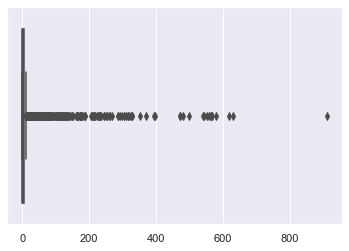

In [435]:
sns.boxplot(tmp)

C:\Users\laeti\AppData\Local\Temp/ipykernel_17988/338142472.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cat['tokens_sans_stop_words'][i] = process_texte_1_tokens(data_cat['description'][i], rejoin= False)
C:\Users\laeti\AppData\Local\Temp/ipykernel_17988/338142472.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cat['longueur_tokens_sans_stop_words'][i] = len( data_cat['tokens_sans_stop_words'][i])


<Figure size 1440x1080 with 0 Axes>

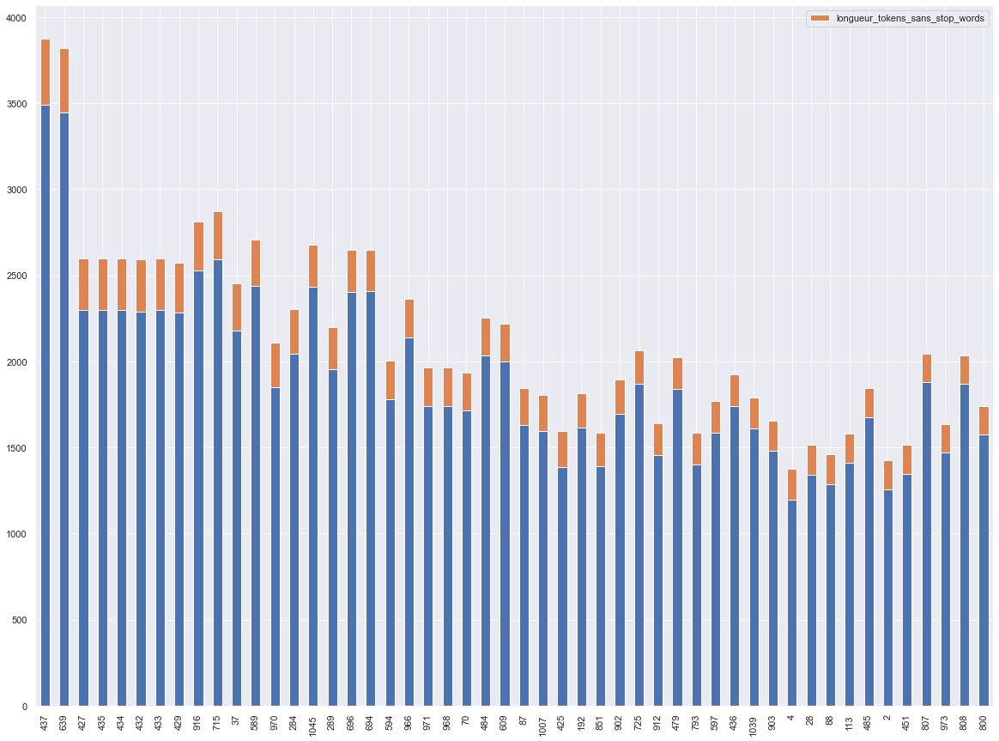

In [680]:

data_cat['tokens_sans_stop_words']=''
data_cat['longueur_tokens_sans_stop_words'] = 0
for i in range(data_cat.shape[0]):
    data_cat['tokens_sans_stop_words'][i] = process_texte_1_tokens(data_cat['description'][i], rejoin= False)
    data_cat['longueur_tokens_sans_stop_words'][i] = len( data_cat['tokens_sans_stop_words'][i])

plt.figure(figsize = (20, 15))
data1 = data_cat.sort_values(by = 'longueur_tokens_sans_stop_words', ascending=False).head(50)
#ax = data1.plot.bar( stacked=True)
data1[['_len_description','longueur_tokens_sans_stop_words']].plot(kind='bar', stacked=True, figsize = (20, 15))
#data1.plot(x = 'product_name', y ='longueur_tokens_sans_stop_words', kind='bar', color="#f56900", rot=30, fontsize = 4, title='Top 50 produits par nombre de mots', figsize = (12,8), stacked=True)
#plt.bar(x, data1['_len_description'], color='r')
#plt.bar(x,  data1['longueur_tokens_sans_stop_words'] , bottom=data['_len_description'], color='b') 
plt.show()

In [671]:
data1.head()

,product_name,product_category_tree,image,is_FK_Advantage_product,description,_len_description,_cat_1,_cat_2,_cat_3,tokens_sans_stop_words,longueur_tokens_sans_stop_words
437,HomeEdge Solid Wood King Bed,"[""Beauty and Personal Care >> Health Care >> H...",b6c339777814451815fe7950fd4c8536.jpg,False,Key Features of HomeEdge Solid Wood King Bed K...,3490,Beauty and Personal Care,Health Care,Health Care Devices,"[key, features, homeedge, solid, wood, king, b...",383
639,Sunlast 16 inch Laptop Backpack,"[""Computers >> Laptop Accessories >> Laptop Ba...",aeb421e416716d5f037d50e8c3b14cd7.jpg,False,Key Features of Sunlast 16 inch Laptop Backpac...,3447,Computers,Laptop Accessories,Laptop Bags,"[key, features, sunlast, 16, inch, laptop, bac...",370
427,"Smartpro 19.5v,3.9a Replacement Charger for Va...","[""Computers >> Laptop Accessories >> Adapters ...",4735953b9c8504eb327675a14c6c33dd.jpg,False,"Key Features of Smartpro 19.5v,3.9a Replacemen...",2297,Computers,Laptop Accessories,Adapters,"[key, features, smartpro, 19, 5v, 3, 9a, repla...",300
435,"Smartpro 19.5v,3.9a Replacement Charger for Va...","[""Computers >> Laptop Accessories >> Adapters ...",3ccceaae844f34180708cb6cba3441bf.jpg,False,"Key Features of Smartpro 19.5v,3.9a Replacemen...",2298,Computers,Laptop Accessories,Adapters,"[key, features, smartpro, 19, 5v, 3, 9a, repla...",300
434,"Smartpro 19.5v,3.9a Replacement Charger for Va...","[""Computers >> Laptop Accessories >> Adapters ...",ea199e645da893f2ab0c45cf07face13.jpg,False,"Key Features of Smartpro 19.5v,3.9a Replacemen...",2296,Computers,Laptop Accessories,Adapters,"[key, features, smartpro, 19, 5v, 3, 9a, repla...",300


## Liste des tokens rares

On peut considérer que si ces tokens ne sont présents qu'une fois dans la liste, qu'ils ne sont pas très importants. 

In [436]:
tmp

rs          911
products    631
free        618
buy         581
delivery    567
           ... 
656           1
motif         1
hargunz       1
driver        1
pgrn01        1
Length: 5966, dtype: int64

In [438]:

tmp = pd.Series(corpus_tokens).value_counts()
list_unique_words = tmp[tmp == 1]
list_unique_words[:30]

thigh             1
voice             1
240v              1
flamingo          1
vegetable         1
enzyme            1
luxarious         1
of1               1
everyday          1
tinker            1
humor             1
soup              1
99gems            1
eternity001007    1
5692              1
gurantee          1
sauce             1
88tbtsh0385       1
applying          1
wkhs0164s         1
compaingns        1
mitered           1
foremost          1
buffet            1
raw               1
rani              1
units             1
1x15              1
stencils          1
avasthi           1
dtype: int64

In [439]:
len(list_unique_words)

1940

In [440]:
list_unique_words = list(list_unique_words.index)
list_unique_words[:30]    

['thigh',
 'voice',
 '240v',
 'flamingo',
 'vegetable',
 'enzyme',
 'luxarious',
 'of1',
 'everyday',
 'tinker',
 'humor',
 'soup',
 '99gems',
 'eternity001007',
 '5692',
 'gurantee',
 'sauce',
 '88tbtsh0385',
 'applying',
 'wkhs0164s',
 'compaingns',
 'mitered',
 'foremost',
 'buffet',
 'raw',
 'rani',
 'units',
 '1x15',
 'stencils',
 'avasthi']

In [441]:
# On le sauvegarde pour plus tard

tmp = pd.DataFrame({'words': list_unique_words})
tmp.to_csv("unique_word.csv", index= False)

In [443]:
# On fait la même chose pour les tokens qui apparaissent 5 fois ou moins
tmp = pd.Series(corpus_tokens).value_counts()
list_min_5_words = tmp[tmp<5]
list_min_5_words[:30]

cr490ebw                4
ruchikainternational    4
shoulder                4
interface               4
sit                     4
mtg                     4
warming                 4
continue                4
paid                    4
photographer            4
canvases                4
functions               4
awakened                4
flavor                  4
customers               4
949                     4
indulge                 4
meet                    4
lawman                  4
196                     4
towards                 4
precious                4
asia                    4
vglass0051              4
patterns                4
flannel                 4
kidz                    4
handles                 4
cup                     4
650                     4
dtype: int64

In [444]:
len(list_min_5_words)

4256

In [445]:
list_min_5_words = list(list_min_5_words.index)
tmp = pd.DataFrame({'words': list_min_5_words})
tmp.to_csv("min_5_word.csv", index= False)

In [446]:
# On fait la même chose pour les tokens qui apparaissent 10 fois ou moins
tmp = pd.Series(corpus_tokens).value_counts()
list_min_10_words = tmp[tmp<10]
list_min_10_words[:30]

represent     9
lining        9
device        9
known         9
wipe          9
head          9
purchase      9
appeal        9
pant          9
27            9
naturals      9
universal     9
micro         9
blade         9
separately    9
helps         9
fork          9
65            9
pair          9
smallest      9
33            9
jrb           9
lock          9
simply        9
sharp         9
sleepsuit     9
rega          9
testing       9
loofah        9
59            9
dtype: int64

In [447]:
len(list_min_10_words)

5017

In [448]:
list_min_10_words = list(list_min_10_words.index)
tmp = pd.DataFrame({'words': list_min_10_words})
tmp.to_csv("min_10_word.csv", index= False)

## Deuxième fonction de cleanning

In [677]:
def process_text_2(doc, 
                  rejoin = False,
                  list_rare_words = None,
                  min_len_words = 3,
                  force_is_alpha = True):# Ne garder que des tokens alphabétiques avec des mots.
    ''' La fonction est comme la fonction process_text_1 avec plus d'argument.
    -------------
    Les arguments obligatoires: 
    doc : str : le document à nettoyer
    
    --------------
    Les arguments optionnels :
    rejoin: bool : si vrai retourne un string sino retourne une liste de tokens 
    list_rare_words : list: liste des mots rares à exclure
    min_len_words : int : le minimum des mot à ne pas exclure
    force_is_alpha: bool : si vrai exclure tous les tokens avec des caractères numériques.
    
    --------------
    return:
    un string si rejoin est vrai ou une list de tokens.
    '''
    
    #Liste unique words
    if not list_rare_words:
        list_rare_words = []
        
    # Lower
    doc = doc.lower().strip()
    
    # Tokenize
    tokenizer = RegexpTokenizer("\w+")
    raw_tokens_list = tokenizer.tokenize(doc)
    
    # Stop word
    cleaned_tokens_list = [w for w in raw_tokens_list if w not in stop_words]
    
    # Classique stopwords
    #cleaned_tokens_list = [ w for w in raw_tokens_list if w not in list_rare_words ]
    
    ################################################################################
    ################################################################################
    
    # Nous supprimons les tokens rare
    non_rare_tokens = [ w for w in cleaned_tokens_list if w not in list_rare_words ]
    
    # Nous sélectionnons uniquement les tokens dont la valeur est supérieur ou égale à min_len_words
    more_than_N = [ w for w in non_rare_tokens  if len(w)>= min_len_words]
    
    # Seulement les caractères alpha
    if force_is_alpha:
        alpha_tokens = [ w for w in more_than_N  if w.isalpha()]
    else :
        alpha_tokens = more_than_N
        
    ################################################################################
    ################################################################################
    
    #if rejoin : 
    return " ".join(alpha_tokens)
    
    return alpha_tokens   
    

In [334]:
len(set(corpus))

6085

In [481]:
corpus = process_text_2(raw_corpus, 
                        list_rare_words = list_unique_words,
                        rejoin = False) 

corpus

'key features elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain height pack price curtain enhances look interiors curtain made high quality polyester fabric features eyelet style stitch metal ring makes room environment curtain ant wrinkle anti shrinkage elegant give home bright appeal designs attention sure contemporary eyelet curtains slide smoothly draw apart first thing morning welcome bright sun rays want wish good morning whole world draw evening create special moments beauty given soothing prints bring home elegant curtain light room get right amount sunlight specifications elegance polyester multicolor abstract eyelet door curtain height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model color multicolor dimensions length box number contents sales package pack sales package curtains body design material polyester specifications sathiyas cott

In [453]:
len(corpus)

408322

C:\Users\laeti\AppData\Local\Temp/ipykernel_17988/871004651.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cat['tokens_sans_mot_unique'][i] = process_text_2(data_cat['description'][i], rejoin= False)
C:\Users\laeti\AppData\Local\Temp/ipykernel_17988/871004651.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cat['longueur_tokens_sans_mot_unique'][i] = len( data_cat['tokens_sans_mot_unique'][i])


<Figure size 1440x1080 with 0 Axes>

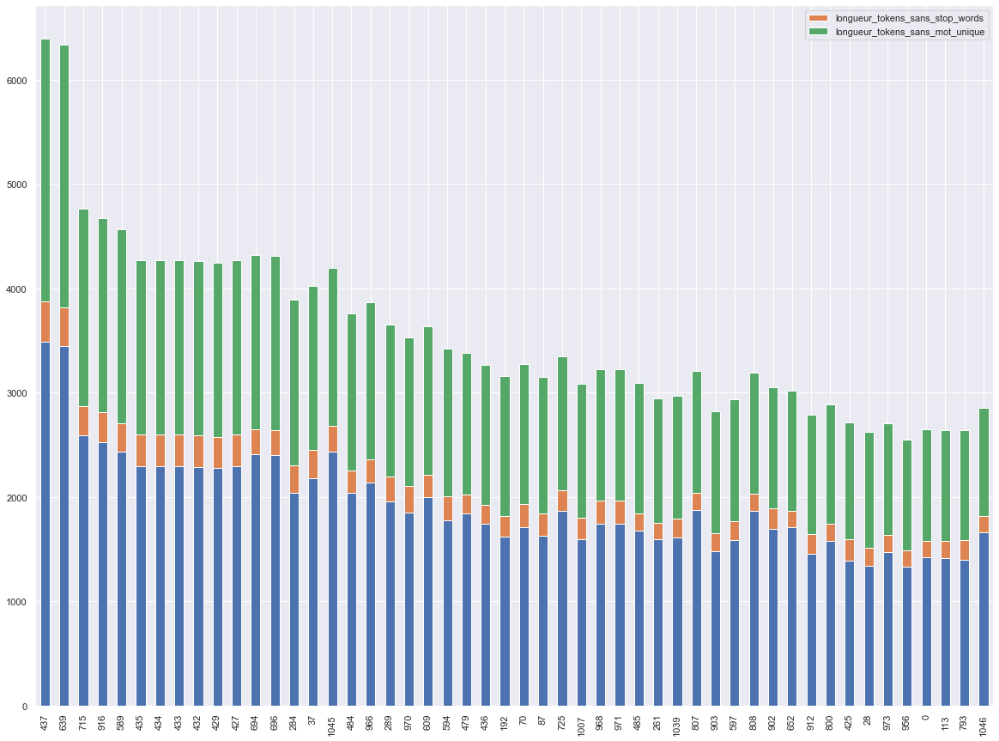

In [681]:
data_cat['tokens_sans_mot_unique']=''
data_cat['longueur_tokens_sans_mot_unique'] = 0
for i in range(data_cat.shape[0]):
    data_cat['tokens_sans_mot_unique'][i] = process_text_2(data_cat['description'][i], rejoin= False)
    data_cat['longueur_tokens_sans_mot_unique'][i] = len( data_cat['tokens_sans_mot_unique'][i])

plt.figure(figsize = (20, 15))
data1 = data_cat.sort_values(by = 'longueur_tokens_sans_mot_unique', ascending=False).head(50)
#ax = data1.plot.bar( stacked=True)
data1[['_len_description','longueur_tokens_sans_stop_words','longueur_tokens_sans_mot_unique' ]].plot(kind='bar', stacked=True, figsize = (20, 15))
#data1.plot(x = 'product_name', y ='longueur_tokens_sans_stop_words', kind='bar', color="#f56900", rot=30, fontsize = 4, title='Top 50 produits par nombre de mots', figsize = (12,8), stacked=True)
#plt.bar(x, data1['_len_description'], color='r')
#plt.bar(x,  data1['longueur_tokens_sans_stop_words'] , bottom=data['_len_description'], color='b') 
plt.show()

## Stem et Lem

 Mettre la définition ici

## Troisième fonction de cleaning

In [482]:
def process_text_3(doc, 
                  rejoin = False,
                  lemm_or_stemm = 'stem',
                  list_rare_words = None,
                  min_len_words = 3,
                  force_is_alpha = True):# Ne garder que des tokens alphabétiques avec des mots.
    ''' La fonction est comme la fonction process_text_2 avec plus d'argument.
    -------------
    Les arguments obligatoires: 
    doc : str : le document à nettoyer
    
    --------------
    Les arguments optionnels :
    rejoin: bool : si vrai retourne un string sino retourne une liste de tokens
    lemm_or_stemm : str : si lem faire la lemmatisation ou faire la stemmetisation
    list_rare_words : list: liste des mots rares à exclure
    min_len_words : int : le minimum des mot à ne pas exclure
    force_is_alpha: bool : si vrai exclure tous les tokens avec des caractères numériques.
    
    --------------
    return:
    un string si rejoin est vrai ou une list de tokens.
    '''
    
    #Liste unique words
    if not list_rare_words:
        list_rare_words = []
        
    # Lower
    doc = doc.lower().strip()
    
    # Tokenize
    tokenizer = RegexpTokenizer("\w+")
    raw_tokens_list = tokenizer.tokenize(doc)
    
    # Classique stopwords
    cleaned_tokens_list = [ w for w in raw_tokens_list if w not in stop_words ]
    
      
    # Nous supprimons les tokens rare
    non_rare_tokens = [ w for w in cleaned_tokens_list if w not in list_rare_words ]
    
    # Nous sélectionnons uniquement les tokens dont la valeur est supérieur ou égale à min_len_words
    more_than_N = [ w for w in non_rare_tokens  if len(w)>= min_len_words]
    
    # Seulement les caractères alpha
    if force_is_alpha:
        alpha_tokens = [ w for w in more_than_N  if w.isalpha()]
    else :
        alpha_tokens = more_than_N
        
    ################################################################################
    ################################################################################
    
    # Stem or lem
    if lemm_or_stemm == "lem":
        trans = WordNetLemmatizer()
        trans_text=[trans.lemmatize(i) for i in alpha_tokens]
    else :
        trans = PorterStemmer()
        trans_text = [trans.stem(i) for i in alpha_tokens]
    
    
    ################################################################################
    ################################################################################
    
    if rejoin : 
        return " ".join(trans_text)
    
    return trans_text   

In [483]:
corpus = process_text_3(raw_corpus, 
                        list_rare_words = list_unique_words,
                        rejoin = True) 


In [460]:
len(corpus)

369068

In [484]:
corpus

'key featur eleg polyest multicolor abstract eyelet door curtain floral curtain eleg polyest multicolor abstract eyelet door curtain height pack price curtain enhanc look interior curtain made high qualiti polyest fabric featur eyelet style stitch metal ring make room environ curtain ant wrinkl anti shrinkag eleg give home bright appeal design attent sure contemporari eyelet curtain slide smoothli draw apart first thing morn welcom bright sun ray want wish good morn whole world draw even creat special moment beauti given sooth print bring home eleg curtain light room get right amount sunlight specif eleg polyest multicolor abstract eyelet door curtain height pack gener brand eleg design door type eyelet model name abstract polyest door curtain set model color multicolor dimens length box number content sale packag pack sale packag curtain bodi design materi polyest specif sathiya cotton bath towel bath towel red yellow blue bath towel featur machin washabl ye materi cotton design self 

In [485]:
corpus_tokens = process_text_3(raw_corpus, 
                        list_rare_words = list_unique_words,
                        rejoin = False)

C:\Users\laeti\AppData\Local\Temp/ipykernel_17988/3705212252.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cat['tokens_stemm_lemm'][i] = process_text_3(data_cat['description'][i], rejoin= False)
C:\Users\laeti\AppData\Local\Temp/ipykernel_17988/3705212252.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cat['longueur_tokens_stemm_lemm'][i] = len( data_cat['tokens_stemm_lemm'][i])


<Figure size 1440x1080 with 0 Axes>

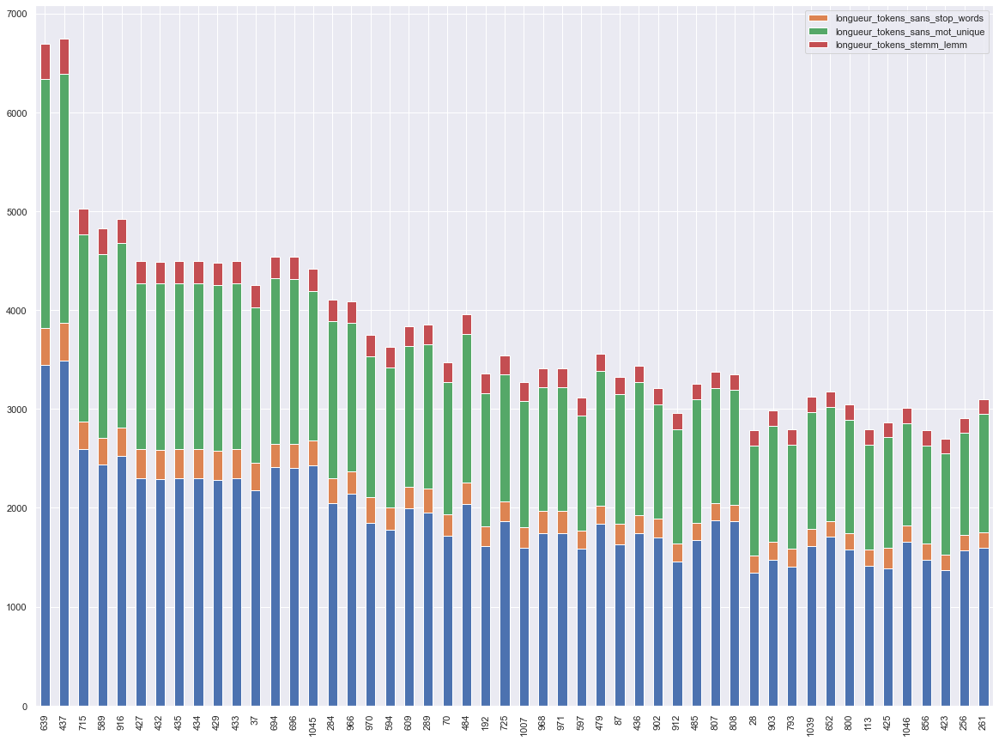

In [683]:
data_cat['tokens_stemm_lemm']=''
data_cat['longueur_tokens_stemm_lemm'] = 0
for i in range(data_cat.shape[0]):
    data_cat['tokens_stemm_lemm'][i] = process_text_3(data_cat['description'][i], rejoin= False)
    data_cat['longueur_tokens_stemm_lemm'][i] = len( data_cat['tokens_stemm_lemm'][i])

plt.figure(figsize = (20, 15))
data1 = data_cat.sort_values(by = 'longueur_tokens_stemm_lemm', ascending=False).head(50)
data1[['_len_description','longueur_tokens_sans_stop_words','longueur_tokens_sans_mot_unique', 'longueur_tokens_stemm_lemm' ]].plot(kind='bar', stacked=True, figsize = (20, 15))

plt.show()

## Seulement les mots anglais

In [465]:
pd.Series(words.words()).sample(30)

95476             instar
158331         prudently
89610      hyperothodoxy
81205      Gymnospermous
165382          reedbuck
174545       scarlatinal
134086           outyelp
30724              carls
160217            pupulo
47398           cyclamen
186583         spiciform
535           absolutism
37990            clypeus
229037         virgulate
9169        anorthophyre
145966       physiogenic
230788         waterhead
54200     diplographical
135016         overhardy
23991          blunderer
116426              Mime
118703      monodramatic
46266       Cryptogramma
161998           quinize
210223           ulcered
192286       sublecturer
183001           slender
90578          ichneutic
99096       Italianation
56515        dodecastyle
dtype: object

In [466]:
len(set(words.words()))

235892

In [467]:
eng_words = [ i.lower() for i in words.words()]
eng_words[:30]

['a',
 'a',
 'aa',
 'aal',
 'aalii',
 'aam',
 'aani',
 'aardvark',
 'aardwolf',
 'aaron',
 'aaronic',
 'aaronical',
 'aaronite',
 'aaronitic',
 'aaru',
 'ab',
 'aba',
 'ababdeh',
 'ababua',
 'abac',
 'abaca',
 'abacate',
 'abacay',
 'abacinate',
 'abacination',
 'abaciscus',
 'abacist',
 'aback',
 'abactinal',
 'abactinally']

In [468]:
ps = PorterStemmer()
eng_words_stem = [ps.stem(i) for i in eng_words]
display_tokens_info(eng_words_stem)

nb tokens236736, nb tokens unique178311
['a', 'a', 'aa', 'aal', 'aalii', 'aam', 'aani', 'aardvark', 'aardwolf', 'aaron', 'aaron', 'aaron', 'aaronit', 'aaronit', 'aaru', 'ab', 'aba', 'ababdeh', 'ababua', 'abac', 'abaca', 'abac', 'abacay', 'abacin', 'abacin', 'abaciscu', 'abacist', 'aback', 'abactin', 'abactin']


In [469]:
len(set(eng_words_stem))

178311

In [470]:
lm = WordNetLemmatizer()
eng_words_lem = [lm.lemmatize(i) for i in eng_words]
display_tokens_info(eng_words_lem)

nb tokens236736, nb tokens unique233450
['a', 'a', 'aa', 'aal', 'aalii', 'aam', 'aani', 'aardvark', 'aardwolf', 'aaron', 'aaronic', 'aaronical', 'aaronite', 'aaronitic', 'aaru', 'ab', 'aba', 'ababdeh', 'ababua', 'abac', 'abaca', 'abacate', 'abacay', 'abacinate', 'abacination', 'abaciscus', 'abacist', 'aback', 'abactinal', 'abactinally']


In [471]:
len(eng_words_lem)

236736

## Quatrième fonction de cleaning

Ne garder que les mots anglais

In [486]:
def process_text_4(doc, 
                  rejoin = False,
                  lemm_or_stemm = 'stem',
                  list_rare_words = None,
                  min_len_words = 3,
                  force_is_alpha = True,
                  eng_words = None):
    ''' La fonction est comme la fonction process_text_2 avec plus d'argument.
    -------------
    Les arguments obligatoires: 
    doc : str : le document à nettoyer
    
    --------------
    Les arguments optionnels :
    rejoin: bool : si vrai retourne un string sino retourne une liste de tokens
    lemm_or_stemm : str : si lem faire la lemmatisation ou faire la stemmetisation
    list_rare_words : list: liste des mots rares à exclure
    min_len_words : int : le minimum des mot à ne pas exclure
    force_is_alpha: bool : si vrai exclure tous les tokens avec des caractères numériques.
    eng_words : list : liste des mots anglais.
    
    --------------
    return:
    un string si rejoin est vrai ou une list de tokens.
    '''
    
    #Liste unique words
    if not list_rare_words:
        list_rare_words = []
        
    # Lower
    doc = doc.lower().strip()
    
    # Tokenize
    tokenizer = RegexpTokenizer("\w+")
    raw_tokens_list = tokenizer.tokenize(doc)
    
    # Classique stopwords
    cleaned_tokens_list = [ w for w in raw_tokens_list if w not in stop_words ]
    
      
    # Nous supprimons les tokens rare
    non_rare_tokens = [ w for w in cleaned_tokens_list if w not in list_rare_words ]
    
    # Nous sélectionnons uniquement les tokens dont la valeur est supérieur ou égale à min_len_words
    more_than_N = [ w for w in non_rare_tokens  if len(w)>= min_len_words]
    
    # Seulement les caractères alpha
    if force_is_alpha:
        alpha_tokens = [ w for w in more_than_N  if w.isalpha()]
    else :
        alpha_tokens = more_than_N
        
   
    
    # Stem or lem
    if lemm_or_stemm == "lem":
        trans = WordNetLemmatizer()
        trans_text=[trans.lemmatize(i) for i in alpha_tokens]
    else :
        trans = PorterStemmer()
        trans_text = [trans.stem(i) for i in alpha_tokens]
    
    
    ################################################################################
    ################################################################################
    
    # en Anglais : 
    
    if eng_words:
        engl_text = [i for i in trans_text if i in eng_words]
    else:
        engl_text = trans_text
    
    
    ################################################################################
    ################################################################################
    
    if rejoin : 
        return " ".join(engl_text)
    
    return engl_text   

In [487]:
corpus = process_text_4(raw_corpus, 
                        list_rare_words = list_unique_words,
                        rejoin = True,
                        eng_words = eng_words_stem) 


In [488]:
corpus

'key featur eleg polyest multicolor abstract eyelet door curtain floral curtain eleg polyest multicolor abstract eyelet door curtain height pack price curtain enhanc look interior curtain made high qualiti polyest fabric featur eyelet style stitch metal ring make room environ curtain ant wrinkl anti shrinkag eleg give home bright appeal design attent sure contemporari eyelet curtain slide smoothli draw apart first thing morn welcom bright sun ray want wish good morn whole world draw even creat special moment beauti given sooth print bring home eleg curtain light room get right amount sunlight specif eleg polyest multicolor abstract eyelet door curtain height pack gener brand eleg design door type eyelet model name abstract polyest door curtain set model color multicolor dimens length box number content sale packag pack sale packag curtain bodi design materi polyest specif cotton bath towel bath towel red yellow blue bath towel featur machin washabl ye materi cotton design self design g

In [489]:
len(corpus)

286339

In [490]:
corpus_tokens = process_text_4(raw_corpus, 
                        list_rare_words = list_unique_words,
                        rejoin = False,
                        eng_words = eng_words_stem)

In [491]:
display_tokens_info(corpus_tokens)

nb tokens46472, nb tokens unique2174
['key', 'featur', 'eleg', 'polyest', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'eleg', 'polyest', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'price', 'curtain', 'enhanc', 'look', 'interior', 'curtain', 'made', 'high', 'qualiti', 'polyest']


In [492]:
len(set(corpus_tokens))

2174

In [493]:
len(data_cat)

1050

In [494]:
list_unique_words[:30]

['thigh',
 'voice',
 '240v',
 'flamingo',
 'vegetable',
 'enzyme',
 'luxarious',
 'of1',
 'everyday',
 'tinker',
 'humor',
 'soup',
 '99gems',
 'eternity001007',
 '5692',
 'gurantee',
 'sauce',
 '88tbtsh0385',
 'applying',
 'wkhs0164s',
 'compaingns',
 'mitered',
 'foremost',
 'buffet',
 'raw',
 'rani',
 'units',
 '1x15',
 'stencils',
 'avasthi']

In [495]:
len(list_unique_words)

1940

In [496]:
list_min_5_words[:30]

['cr490ebw',
 'ruchikainternational',
 'shoulder',
 'interface',
 'sit',
 'mtg',
 'warming',
 'continue',
 'paid',
 'photographer',
 'canvases',
 'functions',
 'awakened',
 'flavor',
 'customers',
 '949',
 'indulge',
 'meet',
 'lawman',
 '196',
 'towards',
 'precious',
 'asia',
 'vglass0051',
 'patterns',
 'flannel',
 'kidz',
 'handles',
 'cup',
 '650']

In [497]:
len(list_min_5_words)

4256

In [499]:
tmp = pd.Series(corpus_tokens).value_counts()
tmp

product    870
free       618
buy        581
replac     570
ship       569
          ... 
exceed       2
snack        2
custard      2
global       2
film         2
Length: 2174, dtype: int64

C:\Users\laeti\AppData\Local\Temp/ipykernel_17988/3635877521.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cat['tokens_anglais_seul'][i] = process_text_4(data_cat['description'][i], rejoin= False)
C:\Users\laeti\AppData\Local\Temp/ipykernel_17988/3635877521.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cat['longueur_tokens_anglais_seul'][i] = len( data_cat['tokens_anglais_seul'][i])


<Figure size 1440x1080 with 0 Axes>

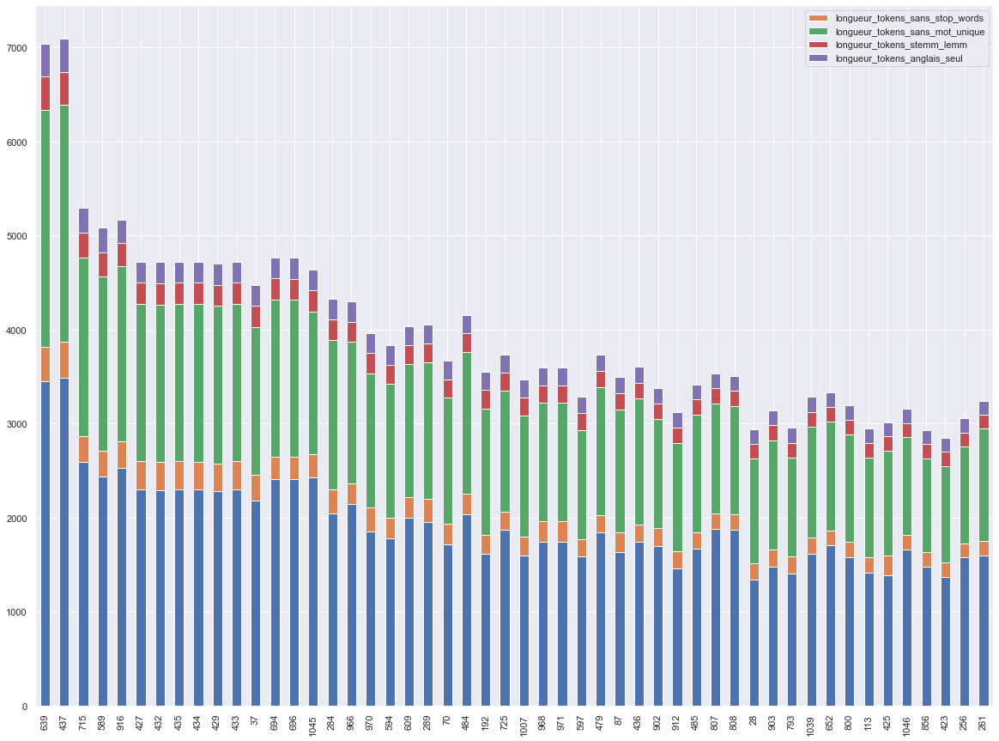

In [685]:
data_cat['tokens_anglais_seul']=''
data_cat['longueur_tokens_anglais_seul'] = 0
for i in range(data_cat.shape[0]):
    data_cat['tokens_anglais_seul'][i] = process_text_4(data_cat['description'][i], rejoin= False)
    data_cat['longueur_tokens_anglais_seul'][i] = len( data_cat['tokens_anglais_seul'][i])

plt.figure(figsize = (20, 15))
data1 = data_cat.sort_values(by = 'longueur_tokens_anglais_seul', ascending=False).head(50)
data1[['_len_description','longueur_tokens_sans_stop_words','longueur_tokens_sans_mot_unique', 'longueur_tokens_stemm_lemm', 'longueur_tokens_anglais_seul']].plot(kind='bar', stacked=True, figsize = (20, 15))

plt.show()

## WordCloud

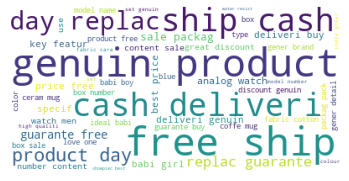

In [501]:
wordcloud = WordCloud(background_color='white',
                      stopwords = [],
                      max_words = 50).generate(corpus)#(" ".join(corpus))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

## Diviser the corpus

### Séparons les catégories

In [502]:
data_cat.columns.tolist()

['product_category_tree',
 'image',
 'is_FK_Advantage_product',
 'description',
 '_cat_1',
 '_cat_2',
 '_cat_3']

In [709]:
data_cat['_cat_1'].unique()

array(['Home Furnishing', 'Baby Care', 'Watches',
       'Home Decor & Festive Needs', 'Kitchen & Dining',
       'Beauty and Personal Care', 'Computers'], dtype=object)

In [710]:
data_cat_1 = data_cat[data_cat._cat_1 == 'Home Furnishing']
data_cat_2 = data_cat[data_cat._cat_1  == 'Baby Care']
data_cat_3 = data_cat[data_cat._cat_1  == 'Watches']
data_cat_4 = data_cat[data_cat._cat_1  == 'Home Decor & Festive Needs']
data_cat_5 = data_cat[data_cat._cat_1  == 'Kitchen & Dining']
data_cat_6 = data_cat[data_cat._cat_1  == 'Beauty and Personal Care']
data_cat_7 = data_cat[data_cat._cat_1  == 'Computers']

In [711]:
data_cat_1.head()

,product_name,product_category_tree,image,is_FK_Advantage_product,description,_len_description,_cat_1,_cat_2,_cat_3,tokens_sans_stop_words,longueur_tokens_sans_stop_words,tokens_sans_mot_unique,longueur_tokens_sans_mot_unique,tokens_stemm_lemm,longueur_tokens_stemm_lemm,tokens_anglais_seul,longueur_tokens_anglais_seul,tokens_extra_words,longueur_tokens_extra_words
0,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,1420,Home Furnishing,Curtains & Accessories,Curtains,"[key, features, elegance, polyester, multicolo...",162,key features elegance polyester multicolor abs...,1065,"[key, featur, eleg, polyest, multicolor, abstr...",146,"[key, featur, eleg, polyest, multicolor, abstr...",146,"[key, featur, eleg, polyest, multicolor, abstr...",146
3,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,858,Home Furnishing,Bed Linen,Bedsheets,"[key, features, santosh, royal, fashion, cotto...",133,key features santosh royal fashion cotton prin...,722,"[key, featur, santosh, royal, fashion, cotton,...",105,"[key, featur, santosh, royal, fashion, cotton,...",105,"[key, featur, royal, fashion, cotton, print, k...",94
4,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,1197,Home Furnishing,Bed Linen,Bedsheets,"[key, features, jaipur, print, cotton, floral,...",178,key features jaipur print cotton floral king s...,917,"[key, featur, jaipur, print, cotton, floral, k...",140,"[key, featur, jaipur, print, cotton, floral, k...",140,"[key, featur, print, cotton, floral, king, siz...",127
33,SANTOSH ROYAL FASHION Cotton Embroidered Diwan...,"[""Home Furnishing >> Living Room Furnishing >>...",b85f8843bb1c297dd5712f0bd287006d.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton E...,954,Home Furnishing,Living Room Furnishing,Diwan Sets,"[key, features, santosh, royal, fashion, cotto...",135,key features santosh royal fashion cotton embr...,778,"[key, featur, santosh, royal, fashion, cotton,...",108,"[key, featur, santosh, royal, fashion, cotton,...",108,"[key, featur, royal, fashion, cotton, embroid,...",96
34,House This Queen Cotton Duvet Cover,"[""Home Furnishing >> Bed Linen >> Duvet Covers...",a4b09aa7927c59fbb39960b3d7919909.jpg,False,Key Features of House This Queen Cotton Duvet ...,583,Home Furnishing,Bed Linen,Duvet Covers,"[key, features, house, queen, cotton, duvet, c...",83,key features house queen cotton duvet cover ma...,474,"[key, featur, hous, queen, cotton, duvet, cove...",70,"[key, featur, hous, queen, cotton, duvet, cove...",70,"[key, featur, hous, queen, cotton, duvet, cove...",66


In [712]:
data_cat_2.head()

,product_name,product_category_tree,image,is_FK_Advantage_product,description,_len_description,_cat_1,_cat_2,_cat_3,tokens_sans_stop_words,longueur_tokens_sans_stop_words,tokens_sans_mot_unique,longueur_tokens_sans_mot_unique,tokens_stemm_lemm,longueur_tokens_stemm_lemm,tokens_anglais_seul,longueur_tokens_anglais_seul,tokens_extra_words,longueur_tokens_extra_words
1,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,444,Baby Care,Baby Bath & Skin,Baby Bath Towels,"[specifications, sathiyas, cotton, bath, towel...",68,specifications sathiyas cotton bath towel bath...,385,"[specif, sathiya, cotton, bath, towel, bath, t...",60,"[specif, sathiya, cotton, bath, towel, bath, t...",60,"[specif, cotton, bath, towel, bath, towel, red...",54
2,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,1258,Baby Care,Baby Bath & Skin,Baby Bath Towels,"[key, features, eurospa, cotton, terry, face, ...",169,key features eurospa cotton terry face towel s...,933,"[key, featur, eurospa, cotton, terri, face, to...",146,"[key, featur, eurospa, cotton, terri, face, to...",146,"[key, featur, cotton, terri, face, towel, set,...",134
40,Mom and Kid Baby Girl's Printed Green Top & Py...,"[""Baby Care >> Infant Wear >> Baby Girls' Clot...",90e56526f4c5892beac49f262b85150a.jpg,False,Key Features of Mom and Kid Baby Girl's Printe...,419,Baby Care,Infant Wear,Baby Girls' Clothes,"[key, features, mom, kid, baby, girl, printed,...",65,key features mom kid baby girl printed green t...,359,"[key, featur, mom, kid, babi, girl, print, gre...",62,"[key, featur, mom, kid, babi, girl, print, gre...",62,"[key, featur, kid, babi, girl, print, green, t...",59
42,"Mom and Kid Baby Girl's Printed Blue, Grey Top...","[""Baby Care >> Infant Wear >> Baby Girls' Clot...",5325213d84c80ad310b6e4b37a1ac824.jpg,False,Key Features of Mom and Kid Baby Girl's Printe...,484,Baby Care,Infant Wear,Baby Girls' Clothes,"[key, features, mom, kid, baby, girl, printed,...",74,key features mom kid baby girl printed blue gr...,409,"[key, featur, mom, kid, babi, girl, print, blu...",70,"[key, featur, mom, kid, babi, girl, print, blu...",70,"[key, featur, kid, babi, girl, print, blue, gr...",65
63,KOHL Wine Bag Yellow,"[""Baby Care >> Feeding & Nursing >> Bottles & ...",f4e7f269319ba9cf5507a9e2febacbf5.jpg,False,Key Features of KOHL Wine Bag Yellow Easy to c...,445,Baby Care,Feeding & Nursing,Bottles & Accessories,"[key, features, kohl, wine, bag, yellow, easy,...",65,key features kohl wine bag yellow easy carry g...,400,"[key, featur, kohl, wine, bag, yellow, easi, c...",62,"[key, featur, kohl, wine, bag, yellow, easi, c...",62,"[key, featur, kohl, wine, bag, yellow, easi, c...",58


In [713]:
corpus_1 = " ".join(data_cat_1.description)
corpus_2 = " ".join(data_cat_2.description)
corpus_3 = " ".join(data_cat_3.description)
corpus_4 = " ".join(data_cat_4.description)
corpus_5 = " ".join(data_cat_5.description)
corpus_6 = " ".join(data_cat_6.description)
corpus_7 = " ".join(data_cat_7.description)

In [714]:
corpus_1[:1000]

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

In [715]:
corpus_2[:1000]

'Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 inch GSM: 360,Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Price: Rs. 299 Eurospa brings to you an exclusively designed, 100% soft cotton towels of export quality. All our products have soft texture that takes care of your skin and gives you that enriched feeling you deserve. Eurospa has been exporting its bath towels to lot of renowned brands for last 10 years and is famous for its fine prints, absorbency, softness and durability. NOTE: Our product

## Processus de nettoyage

In [716]:
corpus_1_tokens = process_text_4(corpus_1, 
                        list_rare_words = list_min_5_words,
                        rejoin = False,
                        eng_words = eng_words_stem)

corpus_2_tokens = process_text_4(corpus_2, 
                        list_rare_words = list_min_5_words,
                        rejoin = False,
                        eng_words = eng_words_stem)

corpus_3_tokens = process_text_4(corpus_3, 
                        list_rare_words = list_min_5_words,
                        rejoin = False,
                        eng_words = eng_words_stem)

corpus_4_tokens = process_text_4(corpus_4, 
                        list_rare_words = list_min_5_words,
                        rejoin = False,
                        eng_words = eng_words_stem)

corpus_5_tokens = process_text_4(corpus_5, 
                        list_rare_words = list_min_5_words,
                        rejoin = False,
                        eng_words = eng_words_stem)

corpus_6_tokens = process_text_4(corpus_6, 
                        list_rare_words = list_min_5_words,
                        rejoin = False,
                        eng_words = eng_words_stem)

corpus_7_tokens = process_text_4(corpus_7, 
                        list_rare_words = list_min_5_words,
                        rejoin = False,
                        eng_words = eng_words_stem)

In [717]:
corpus_1 = process_text_4(corpus_1, 
                        list_rare_words = list_min_5_words,
                        rejoin = True,
                        eng_words = eng_words_stem)

corpus_2 = process_text_4(corpus_2, 
                        list_rare_words = list_min_5_words,
                        rejoin = True,
                        eng_words = eng_words_stem)

corpus_3 = process_text_4(corpus_3, 
                        list_rare_words = list_min_5_words,
                        rejoin = True,
                        eng_words = eng_words_stem)

corpus_4 = process_text_4(corpus_4, 
                        list_rare_words = list_min_5_words,
                        rejoin = True,
                        eng_words = eng_words_stem)

corpus_5 = process_text_4(corpus_5, 
                        list_rare_words = list_min_5_words,
                        rejoin = True,
                        eng_words = eng_words_stem)

corpus_6 = process_text_4(corpus_6, 
                        list_rare_words = list_min_5_words,
                        rejoin = True,
                        eng_words = eng_words_stem)

corpus_7 = process_text_4(corpus_7, 
                        list_rare_words = list_min_5_words,
                        rejoin = True,
                        eng_words = eng_words_stem)

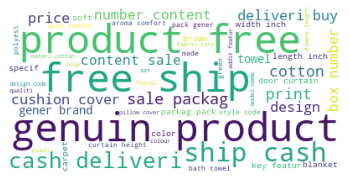

In [718]:
wordcloud = WordCloud(background_color='white',
                      stopwords = [],
                      max_words = 50).generate(corpus_1)#(" ".join(corpus_1))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

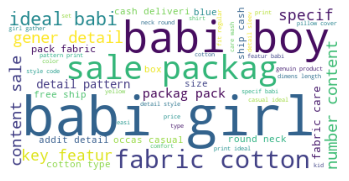

In [719]:
wordcloud = WordCloud(background_color='white',
                      stopwords = [],
                      max_words = 50).generate(corpus_2)#(" ".join(corpus_0))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

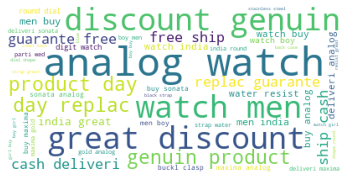

In [720]:
wordcloud = WordCloud(background_color='white',
                      stopwords = [],
                      max_words = 50).generate(corpus_3)#(" ".join(corpus_0))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

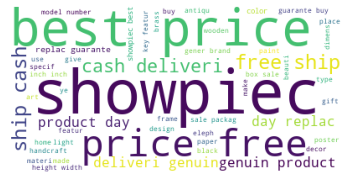

In [721]:
wordcloud = WordCloud(background_color='white',
                      stopwords = [],
                      max_words = 50).generate(corpus_4)#(" ".join(corpus_0))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

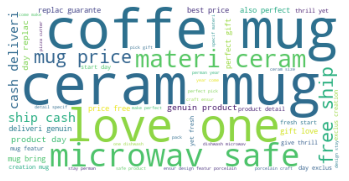

In [722]:
wordcloud = WordCloud(background_color='white',
                      stopwords = [],
                      max_words = 50).generate(corpus_5)#(" ".join(corpus_0))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

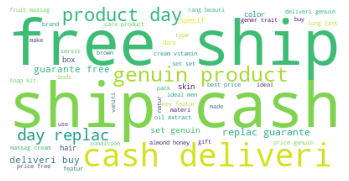

In [723]:
wordcloud = WordCloud(background_color='white',
                      stopwords = [],
                      max_words = 50).generate(corpus_6)#(" ".join(corpus_0))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

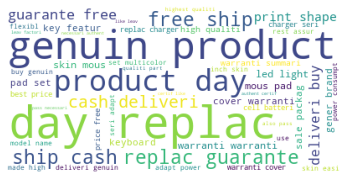

In [724]:
wordcloud = WordCloud(background_color='white',
                      stopwords = [],
                      max_words = 50).generate(corpus_7)#(" ".join(corpus_0))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [726]:
pd.Series(corpus_1_tokens).value_counts().head(20)

design      107
cover       107
cotton      103
pack         95
product      94
buy          77
free         76
towel        74
deliveri     74
cash         74
genuin       74
ship         74
comfort      73
cushion      70
print        69
color        66
inch         63
packag       63
sale         62
polyest      61
dtype: int64

In [727]:
pd.Series(corpus_2_tokens).value_counts().head(20)

babi      316
girl      197
cotton    191
detail    180
fabric    164
boy       112
print     105
dress     105
specif    100
ideal      98
gener      96
packag     88
featur     87
sleev      86
type       85
sale       85
color      82
neck       80
wash       77
number     76
dtype: int64

In [145]:
# Parmi les valeurs regardons les doublons

In [738]:
n = 10
doublons = [i for i in pd.Series(corpus_1_tokens).value_counts().head(n).index
    if i in pd.Series(corpus_2_tokens).value_counts().head(n).index
    if i in pd.Series(corpus_3_tokens).value_counts().head(n).index
    if i in pd.Series(corpus_4_tokens).value_counts().head(n).index
    if i in pd.Series(corpus_5_tokens).value_counts().head(n).index
    if i in pd.Series(corpus_6_tokens).value_counts().head(n).index
    if i in pd.Series(corpus_7_tokens).value_counts().head(n).index]
doublons

[]

In [740]:
n = 30
doublons = [i for i in pd.Series(corpus_1_tokens).value_counts().head(n).index
    if i in pd.Series(corpus_2_tokens).value_counts().head(n).index
    if i in pd.Series(corpus_3_tokens).value_counts().head(n).index
    if i in pd.Series(corpus_4_tokens).value_counts().head(n).index
    if i in pd.Series(corpus_5_tokens).value_counts().head(n).index
    if i in pd.Series(corpus_6_tokens).value_counts().head(n).index
    if i in pd.Series(corpus_7_tokens).value_counts().head(n).index]
doublons

['product']

## Cinquième fonction de cleanning

In [521]:
def process_text_5(doc, 
                  rejoin = False,
                  lemm_or_stemm = 'stem',
                  list_rare_words = None,
                  min_len_words = 3,
                  force_is_alpha = True,
                  eng_words = None,
                  extra_words = None):
    ''' La fonction est comme la fonction process_text_4 avec plus d'argument.
    -------------
    Les arguments obligatoires: 
    doc : str : le document à nettoyer
    
    --------------
    Les arguments optionnels :
    rejoin: bool : si vrai retourne un string sino retourne une liste de tokens
    lemm_or_stemm : str : si lem faire la lemmatisation ou faire la stemmetisation
    list_rare_words : list: liste des mots rares à exclure
    min_len_words : int : le minimum des mot à ne pas exclure
    force_is_alpha: bool : si vrai exclure tous les tokens avec des caractères numériques.
    eng_words : list : liste des mots anglais.
    
    --------------
    return:
    un string si rejoin est vrai ou une list de tokens.
    '''
    
    #Liste unique words
    if not list_rare_words:
        list_rare_words = []
        
    # Lower
    doc = doc.lower().strip()
    
    # Tokenize
    tokenizer = RegexpTokenizer("\w+")
    raw_tokens_list = tokenizer.tokenize(doc)
    
    # Classique stopwords
    cleaned_tokens_list = [ w for w in raw_tokens_list if w not in stop_words ]
    
      
    # Nous supprimons les tokens rare
    non_rare_tokens = [ w for w in cleaned_tokens_list if w not in list_rare_words ]
    
    # Nous sélectionnons uniquement les tokens dont la valeur est supérieur ou égale à min_len_words
    more_than_N = [ w for w in non_rare_tokens  if len(w)>= min_len_words]
    
    # Seulement les caractères alpha
    if force_is_alpha:
        alpha_tokens = [ w for w in more_than_N  if w.isalpha()]
    else :
        alpha_tokens = more_than_N
        
   
    
    # Stem or lem
    if lemm_or_stemm == "lem":
        trans = WordNetLemmatizer()
        trans_text=[trans.lemmatize(i) for i in alpha_tokens]
    else :
        trans = PorterStemmer()
        trans_text = [trans.stem(i) for i in alpha_tokens]
    
    
       
    # en Anglais : 
   
    
    if eng_words:
        engl_text = [i for i in trans_text if i in eng_words]
        
    else:
        engl_text = trans_text
    
    
    ################################################################################
    ################################################################################
    
    final = [w for w in engl_text if w not in extra_words]
    
    ################################################################################
    ################################################################################
    
    if rejoin : 
        return " ".join(final)
    
    return engl_text   

In [741]:
corpus_test = process_text_5(raw_corpus, 
                        list_rare_words = list_unique_words,
                        rejoin = True,
                        eng_words = eng_words_stem, 
                        extra_words = doublons) 

C:\Users\laeti\AppData\Local\Temp/ipykernel_17988/3734606628.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cat['tokens_extra_words'][i] = process_text_5(data_cat['description'][i], rejoin= False , eng_words = eng_words_stem,
C:\Users\laeti\AppData\Local\Temp/ipykernel_17988/3734606628.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cat['longueur_tokens_extra_words'][i] = len( data_cat['tokens_extra_words'][i])
C:\Users\laeti\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:633: UserWarning: The handle <BarContainer object of 50 artists> has a label of '_len_description' which cannot b

<Figure size 1440x1080 with 0 Axes>

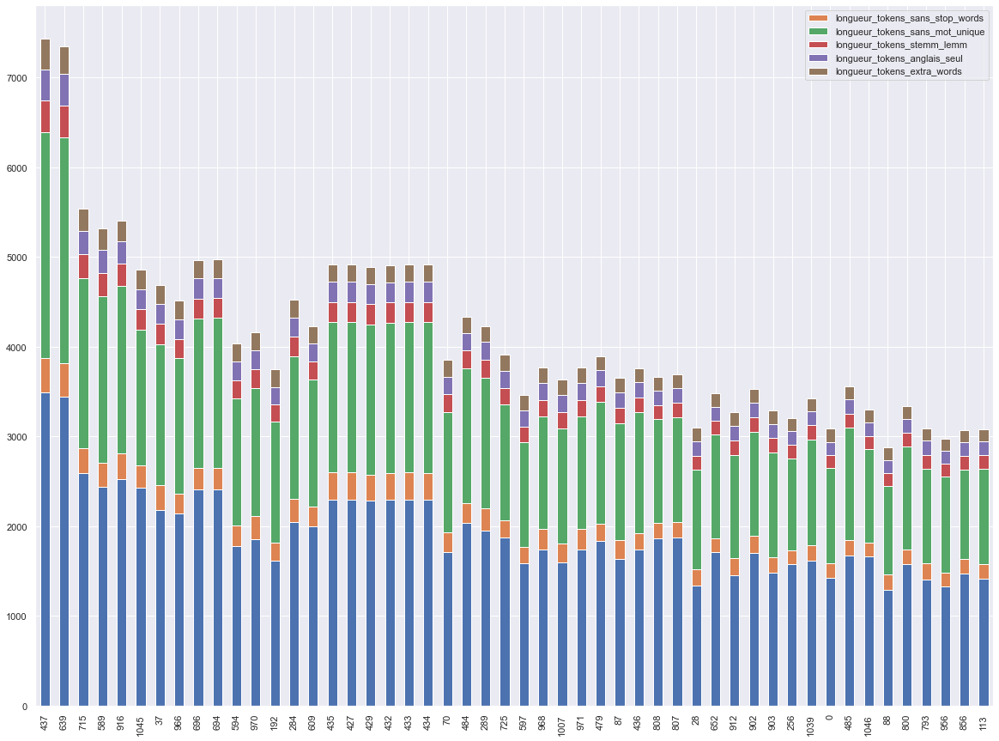

In [742]:
data_cat['tokens_extra_words']=''
data_cat['longueur_tokens_extra_words'] = 0
for i in range(data_cat.shape[0]):
    data_cat['tokens_extra_words'][i] = process_text_5(data_cat['description'][i], rejoin= False , eng_words = eng_words_stem, 
                        extra_words = doublons)
    data_cat['longueur_tokens_extra_words'][i] = len( data_cat['tokens_extra_words'][i])

plt.figure(figsize = (20, 15))
data1 = data_cat.sort_values(by = 'longueur_tokens_extra_words', ascending=False).head(50)
data1[['_len_description','longueur_tokens_sans_stop_words','longueur_tokens_sans_mot_unique', 'longueur_tokens_stemm_lemm', 'longueur_tokens_anglais_seul', 'longueur_tokens_extra_words']].plot(kind='bar', stacked=True, figsize = (20, 15))

plt.show()

In [1068]:
def process_text_6(doc, 
                  rejoin = False,
                  lemm_or_stemm = 'lem',
                  list_rare_words = None,
                  min_len_words = 3,
                  force_is_alpha = True,
                  eng_words = None,
                  extra_words = None):
    ''' La fonction est comme la fonction process_text_4 avec plus d'argument.
    -------------
    Les arguments obligatoires: 
    doc : str : le document à nettoyer
    
    --------------
    Les arguments optionnels :
    rejoin: bool : si vrai retourne un string sino retourne une liste de tokens
    lemm_or_stemm : str : si lem faire la lemmatisation ou faire la stemmetisation
    list_rare_words : list: liste des mots rares à exclure
    min_len_words : int : le minimum des mot à ne pas exclure
    force_is_alpha: bool : si vrai exclure tous les tokens avec des caractères numériques.
    eng_words : list : liste des mots anglais.
    
    --------------
    return:
    un string si rejoin est vrai ou une list de tokens.
    '''
    
    #Liste unique words
    if not list_rare_words:
        list_rare_words = []
        
    # Lower
    doc = doc.lower().strip()
    
    # Tokenize
    tokenizer = RegexpTokenizer("\w+")
    raw_tokens_list = tokenizer.tokenize(doc)
    
    # Classique stopwords
    cleaned_tokens_list = [ w for w in raw_tokens_list if w not in stop_words ]
    
      
    # Nous supprimons les tokens rare
    non_rare_tokens = [ w for w in cleaned_tokens_list if w not in list_rare_words ]
    
    # Nous sélectionnons uniquement les tokens dont la valeur est supérieur ou égale à min_len_words
    more_than_N = [ w for w in non_rare_tokens  if len(w)>= min_len_words]
    
    # Seulement les caractères alpha
    if force_is_alpha:
        alpha_tokens = [ w for w in more_than_N  if w.isalpha()]
    else :
        alpha_tokens = more_than_N
        
   
    
    # Stem or lem
    if lemm_or_stemm == "lem":
        trans = WordNetLemmatizer()
        trans_text=[trans.lemmatize(i) for i in alpha_tokens]
    else :
        trans = PorterStemmer()
        trans_text = [trans.stem(i) for i in alpha_tokens]
    
    
       
    # en Anglais : 
    # Sans les mots en Anglais
    
    if eng_words:
        #engl_text = [i for i in trans_text if i in eng_words]
        engl_text = trans_text
    else:
        engl_text = trans_text
    
    
    
    
    final = [w for w in engl_text if w not in extra_words]
    
   
    
    if rejoin : 
        return " ".join(final)
    
    return engl_text 

## Dernier cleaning

In [538]:
def final_clean(doc):
    
    new_doc = process_text_5(doc, 
                             rejoin = True,
                             list_rare_words = list_min_5_words,
                             lemm_or_stemm = 'stem', 
                             eng_words = eng_words_stem, 
                             extra_words = doublons )
        
    return new_doc


In [1072]:
def final_clean_2(doc):
    
    new_doc = process_text_6(doc, 
                             rejoin = True,
                             list_rare_words = list_min_5_words,
                             lemm_or_stemm = 'lem', 
                             eng_words = eng_words_stem, 
                             extra_words = doublons )
   
    return new_doc

In [743]:
data_cat['clean_txt']=''
for i in range(data_cat.shape[0]):
    data_cat['clean_txt'][i]= final_clean(data['description'][i])


C:\Users\laeti\AppData\Local\Temp/ipykernel_17988/3204779489.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cat['clean_txt'][i]= final_clean(data['description'][i])


In [1073]:
import contractions

data_cat['clean_txt_2']=''
for i in range(data_cat.shape[0]):
    data_cat['clean_txt_2'][i]= final_clean_2(data['description'][i])
# Sans contractions
data_cat['clean_txt_2'] = data_cat['clean_txt_2'].apply(lambda x : contractions.fix(x))

C:\Users\laeti\AppData\Local\Temp/ipykernel_17988/4265825394.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cat['clean_txt_2'][i]= final_clean_2(data['description'][i])


In [1125]:
def clean_caracteres_extra(text):
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('http?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    #text = re.sub('%s\?'% re.escape(string.punctuation, '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('^A-Za-z0-9.]+', '', text)
    
    return text

In [1126]:
# Sans caractères extra
data_cat['clean_txt_3'] = data_cat['clean_txt_2'].apply(lambda x : clean_caracteres_extra(x))

In [744]:
data_cat['clean_txt'][0]

'key featur eleg polyest multicolor abstract eyelet door curtain floral curtain eleg polyest multicolor abstract eyelet door curtain height pack price curtain enhanc look interior curtain made high qualiti polyest fabric featur eyelet style metal ring make room curtain ant anti eleg give home bright appeal design attent sure contemporari eyelet curtain first morn bright sun ray want wish good morn whole world creat special beauti print bring home eleg curtain light room get right specif eleg polyest multicolor abstract eyelet door curtain height pack gener brand eleg design door type eyelet model name abstract polyest door curtain set model color multicolor dimens length box number content sale packag pack sale packag curtain bodi design materi polyest'

In [1074]:
data_cat['clean_txt_2'][0]

'key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain height pack price curtain enhances look interior curtain made high quality polyester fabric feature eyelet style metal ring make room curtain ant anti elegant give home bright appeal design attention sure contemporary eyelet curtain first morning bright sun ray want wish good morning whole world create special beauty print bring home elegant curtain light room get right specification elegance polyester multicolor abstract eyelet door curtain height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model color multicolor dimension length box number content sale package pack sale package curtain body design material polyester'

In [1127]:
data_cat['clean_txt_3'][0]

'key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain height pack price curtain enhances look interior curtain made high quality polyester fabric feature eyelet style metal ring make room curtain ant anti elegant give home bright appeal design attention sure contemporary eyelet curtain first morning bright sun ray want wish good morning whole world create special beauty print bring home elegant curtain light room get right specification elegance polyester multicolor abstract eyelet door curtain height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model color multicolor dimension length box number content sale package pack sale package curtain body design material polyester'

In [1075]:
data_cat.sample(20)

,product_name,product_category_tree,image,is_FK_Advantage_product,description,_len_description,_cat_1,_cat_2,_cat_3,clean_txt,clean_txt_2
1001,Mom & Me Baby Girl's Bodysuit,"[""Baby Care >> Infant Wear >> Baby Girls' Clot...",31ac1b66cc6bb396c83f124317589f8c.jpg,False,Key Features of Mom & Me Baby Girl's Bodysuit ...,654,Baby Care,Infant Wear,Baby Girls' Clothes,key featur babi girl fabric cotton brand color...,key feature mom baby girl bodysuit fabric cott...
687,Jovees Anjeer & Carrot Sunblock (Pack of 2) - ...,"[""Beauty and Personal Care >> Body and Skin Ca...",d61b368146f83075937e144dab93c6a1.jpg,False,Flipkart.com: Buy Jovees Anjeer & Carrot Sunbl...,204,Beauty and Personal Care,Body and Skin Care,Face Care,buy pack price genuin day replac guarante free...,flipkart com buy pack spf flipkart com lowest ...
9,TAG Heuer CAU1116.BA0858 Formula 1 Analog Watc...,"[""Watches >> Wrist Watches >> TAG Heuer Wrist ...",710ed5f2393a4b9e8823aa0029f71f93.jpg,False,TAG Heuer CAU1116.BA0858 Formula 1 Analog Watc...,430,Watches,Wrist Watches,TAG Heuer Wrist Watches,analog watch boy men buy analog watch boy men ...,analog watch boy men buy analog watch boy men ...
890,IWS Cotton Bath Towel,"[""Home Furnishing >> Bath Linen >> Towels""]",72db37ec42ee76d79cf395221e0f4cce.jpg,False,Buy IWS Cotton Bath Towel at Rs. 299 at Flipka...,109,Home Furnishing,Bath Linen,Towels,buy cotton bath towel genuin free ship cash de...,buy cotton bath towel flipkart com genuine fre...
220,Poppins Printed Baby Boy's Jumpsuit,"[""Baby Care >> Infant Wear >> Baby Boys' Cloth...",32cf0691248297655e2c1728b12e2262.jpg,False,Poppins Printed Baby Boy's Jumpsuit\r\n ...,675,Baby Care,Infant Wear,Baby Boys' Clothes,print babi boy price high qualiti full sleev r...,printed baby boy jumpsuit price high quality f...
520,Maxima 29923LPGY Analog Watch - For Men,"[""Watches >> Wrist Watches >> Maxima Wrist Wat...",b64149a8a9235f5199c6d8225d5dc602.jpg,False,Maxima 29923LPGY Analog Watch - For Men - Buy...,333,Watches,Wrist Watches,Maxima Wrist Watches,maxima analog watch men buy maxima analog watc...,maximum analog watch men buy maximum analog wa...
490,HP Compaq Presario CQ43 6 Cell Laptop Battery,"[""Computers >> Laptop Accessories >> Batteries...",9a8fa4fd6524ada03411b033a9daadc1.jpg,False,Buy HP Compaq Presario CQ43 6 Cell Laptop Batt...,171,Computers,Laptop Accessories,Batteries,buy cell batteri genuin day replac guarante fr...,buy cell laptop battery flipkart com genuine d...
537,Maxima 01784BMLY Gold Analog Watch - For Women,"[""Watches >> Wrist Watches >> Maxima Wrist Wat...",f242a2cf1525f7700770cf1262b4b660.jpg,True,Maxima 01784BMLY Gold Analog Watch - For Wome...,318,Watches,Wrist Watches,Maxima Wrist Watches,maxima gold analog watch buy maxima gold analo...,maximum gold analog watch woman buy maximum go...
134,Rajesh Digital BEST DAD 107 Ceramic Mug,"[""Kitchen & Dining >> Coffee Mugs >> Rajesh Di...",258444ac7bb7ad8026800efad5c3502b.jpg,False,Buy Rajesh Digital BEST DAD 107 Ceramic Mug fo...,209,Kitchen & Dining,Coffee Mugs,Rajesh Digital Coffee Mugs,buy digit best ceram mug digit best ceram mug ...,buy digital best ceramic mug online digital be...
562,Maxima 19413PPSN FIBER COLLECTION Digital Watc...,"[""Watches >> Wrist Watches >> Maxima Wrist Wat...",3693c4e7f7efb47edb3d9eec067ffd93.jpg,True,Maxima 19413PPSN FIBER COLLECTION Digital Watc...,334,Watches,Wrist Watches,Maxima Wrist Watches,maxima fiber collect digit watch men buy maxim...,maximum fiber collection digital watch men buy...


# Bag_of_words

In [746]:
doc = data_cat['description'][0]
doc

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

In [748]:
doc_nettoye = data_cat['clean_txt'][0]
doc_nettoye

'key featur eleg polyest multicolor abstract eyelet door curtain floral curtain eleg polyest multicolor abstract eyelet door curtain height pack price curtain enhanc look interior curtain made high qualiti polyest fabric featur eyelet style metal ring make room curtain ant anti eleg give home bright appeal design attent sure contemporari eyelet curtain first morn bright sun ray want wish good morn whole world creat special beauti print bring home eleg curtain light room get right specif eleg polyest multicolor abstract eyelet door curtain height pack gener brand eleg design door type eyelet model name abstract polyest door curtain set model color multicolor dimens length box number content sale packag pack sale packag curtain bodi design materi polyest'

In [749]:
list_unique_words

['thigh',
 'voice',
 '240v',
 'flamingo',
 'vegetable',
 'enzyme',
 'luxarious',
 'of1',
 'everyday',
 'tinker',
 'humor',
 'soup',
 '99gems',
 'eternity001007',
 '5692',
 'gurantee',
 'sauce',
 '88tbtsh0385',
 'applying',
 'wkhs0164s',
 'compaingns',
 'mitered',
 'foremost',
 'buffet',
 'raw',
 'rani',
 'units',
 '1x15',
 'stencils',
 'avasthi',
 'recorder',
 'aop',
 'eternity',
 'cfsl',
 'rb',
 'ployester',
 '290p',
 '88ebtsh0565',
 'gym',
 'cokb504black',
 '300gsm',
 'nature',
 'boiling',
 'cricket',
 'football',
 'nba',
 'temptation',
 'sugary',
 'nfl',
 'highlight',
 'drinks',
 'subfreezing',
 'sole',
 '12x18',
 'violet',
 'limitless',
 'flavored',
 'richness',
 'sense',
 'flavoring',
 'drinking',
 'withstands',
 'rigid',
 'calories',
 'warrenty',
 'leak',
 'resistence',
 'margins',
 'carriage',
 'picnic',
 'definitely',
 'travel',
 'motivation',
 'nt345',
 '161207',
 'hospitality',
 '60hz',
 'rejuvenate',
 'appreciation',
 'bls00s380001b',
 'ig43_04',
 'flavoured',
 '612',
 'inst

In [1288]:
from sklearn.feature_extraction.text import CountVectorizer

#for in in range(data_cat.shape[0]):
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(data_cat['clean_txt_3'])#)
vectorizer.get_feature_names_out(list_unique_words)
print(X.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [1289]:
X_2 = X.toarray()

In [1290]:
X_2

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [1291]:
X_2.shape

(1050, 1386)

In [1292]:
data_cat.shape

(1050, 12)

## Fonctions communes (cours OpenClassroom)

In [552]:
data_cat.columns.tolist()

['product_category_tree',
 'image',
 'is_FK_Advantage_product',
 'description',
 '_cat_1',
 '_cat_2',
 '_cat_3',
 'clean_txt']

In [1293]:
l_cat = list(set(data_cat['_cat_1']))
print("catégories : ", l_cat)
y_cat_num = [(1-l_cat.index(data_cat.iloc[i]['_cat_1'])) for i in range(len(data_cat))]

catégories :  ['Baby Care', 'Kitchen & Dining', 'Beauty and Personal Care', 'Computers', 'Watches', 'Home Furnishing', 'Home Decor & Festive Needs']


In [1082]:
# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters
def ARI_fct(features, perplexity) :
    time1 = time.time()
    num_labels=len(l_cat)
    tsne = manifold.TSNE(n_components=2, perplexity = perplexity, n_iter=2000, 
                         init='random', learning_rate=200, random_state=42, method='exact')
    X_tsne = tsne.fit_transform(features)
    
    # Détermination des clusters à partir des données après Tsne 
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(metrics.adjusted_rand_score(y_cat_num, cls.labels_),4)
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "time : ", time2)
    
    return ARI, X_tsne, cls.labels_


# visualisation du Tsne selon les vraies catégories et selon les clusters
def TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI) :
    fig = plt.figure(figsize=(15,6))
    
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=y_cat_num, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=l_cat, loc="best", title="Categorie")
    plt.title('Représentation des produits par catégories réelles')
    
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels), loc="best", title="Clusters")
    plt.title('Représentation des produits par clusters')
    
    plt.show()
    print("ARI : ", ARI)

## Exécution du modèle bag of words avec CountVectorizer

In [1133]:
print("CountVectorizer : ")
print("-----------------")
ARI, X_tsne, labels = ARI_fct(X, perplexity = 30)

CountVectorizer : 
-----------------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3534 time :  66.0


### Graphiques

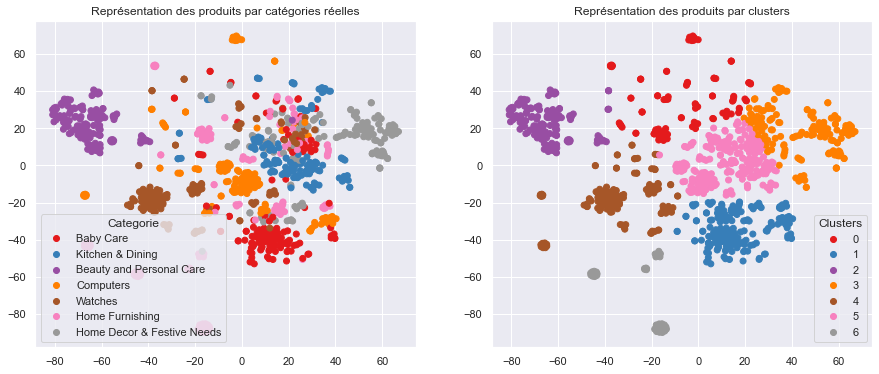

ARI :  0.3534


In [1134]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

In [1085]:
list_perplexity = [10, 20, 50, 60, 100, 200, 500, 1000]

10
CountVectorizer : 
-----------------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.2914 time :  66.0


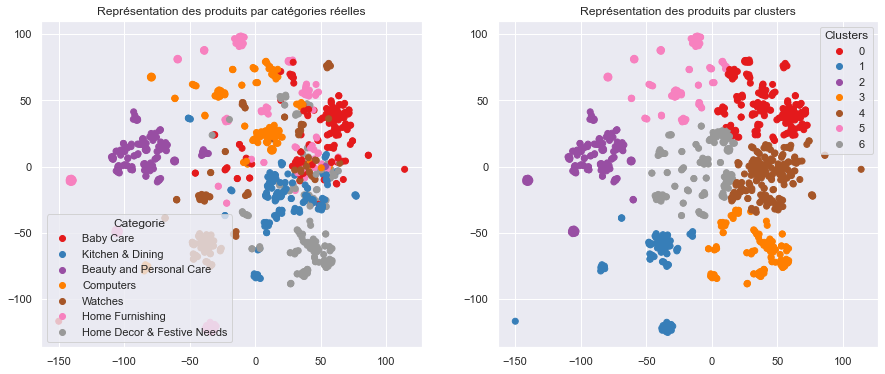

ARI :  0.2914
20
CountVectorizer : 
-----------------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3984 time :  67.0


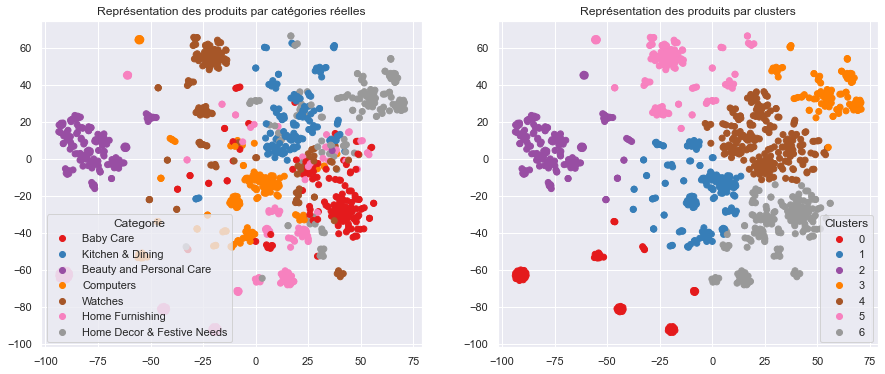

ARI :  0.3984
50
CountVectorizer : 
-----------------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3662 time :  67.0


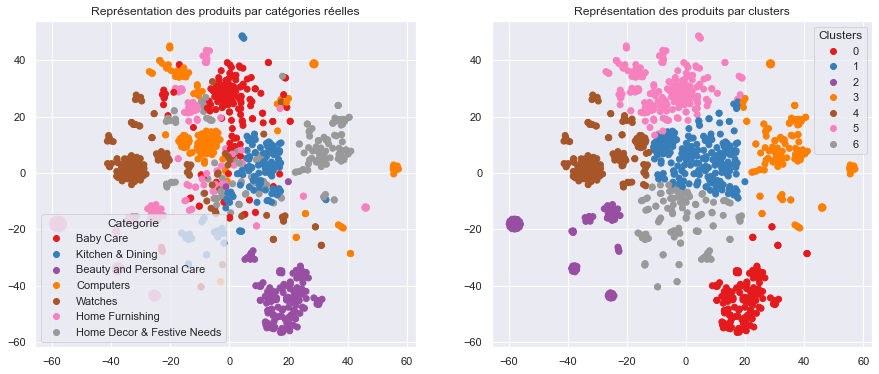

ARI :  0.3662
60
CountVectorizer : 
-----------------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3776 time :  67.0


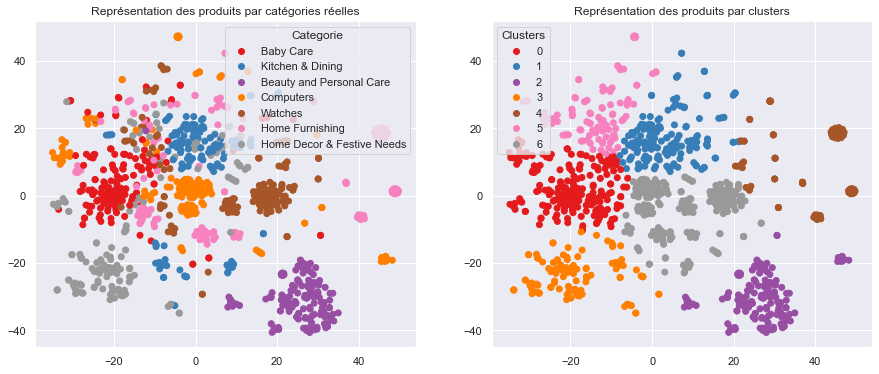

ARI :  0.3776
100
CountVectorizer : 
-----------------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.2867 time :  66.0


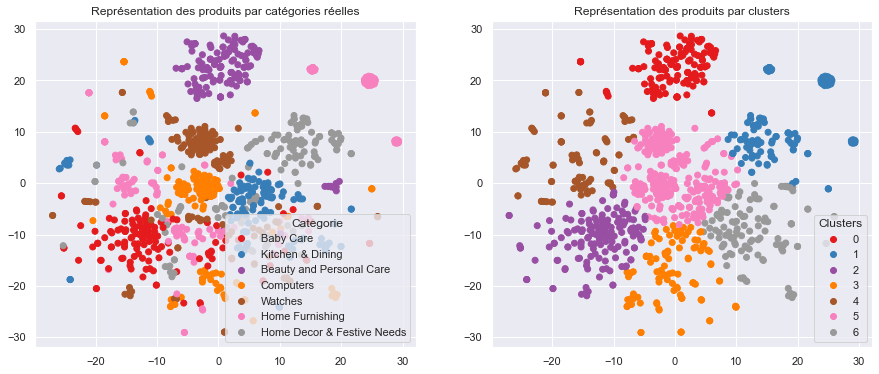

ARI :  0.2867
200
CountVectorizer : 
-----------------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.2844 time :  64.0


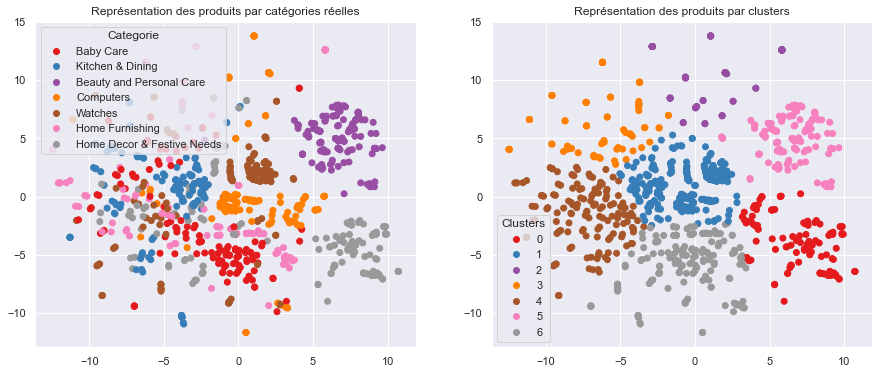

ARI :  0.2844
500
CountVectorizer : 
-----------------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.2105 time :  30.0


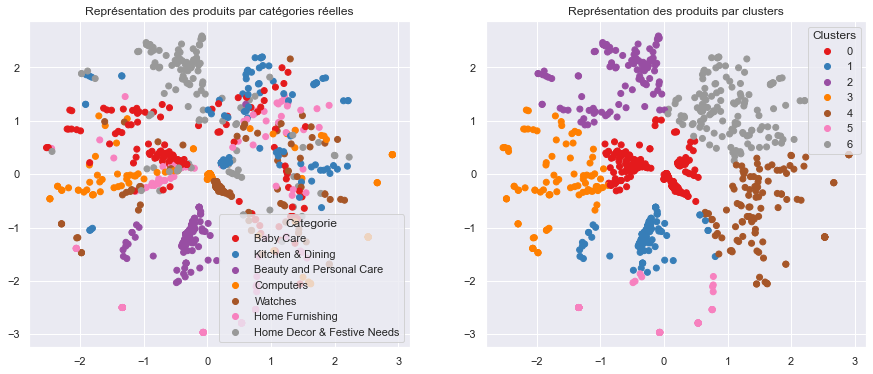

ARI :  0.2105
1000
CountVectorizer : 
-----------------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.0357 time :  30.0


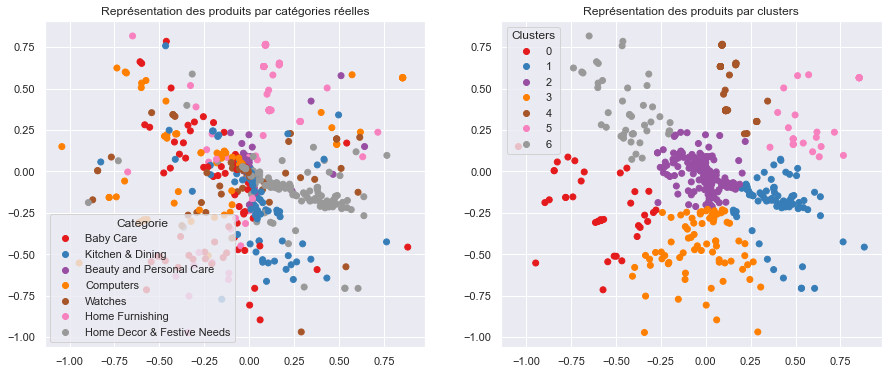

ARI :  0.0357


In [1135]:
for i in list_perplexity : 
    print(i)
    print("CountVectorizer : ")
    print("-----------------")
    ARI, X_tsne, labels = ARI_fct(X, perplexity = i)
    TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)    
    

## TF-IDF

In [238]:
doc = data_cat['description'][0]
doc

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

In [1324]:
from sklearn.feature_extraction.text import  TfidfVectorizer

vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(data_cat['clean_txt_3'])#)
#vectorizer.get_feature_names_out(list_unique_words)
print(X.toarray())

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [1325]:
meilleur_features_text = X

### Exécution du modèle

In [1316]:
print("Tf-idf : ")
print("--------")
ARI, X_tsne, labels = ARI_fct(X, perplexity = 30)

Tf-idf : 
--------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.4026 time :  67.0


### Graphiques

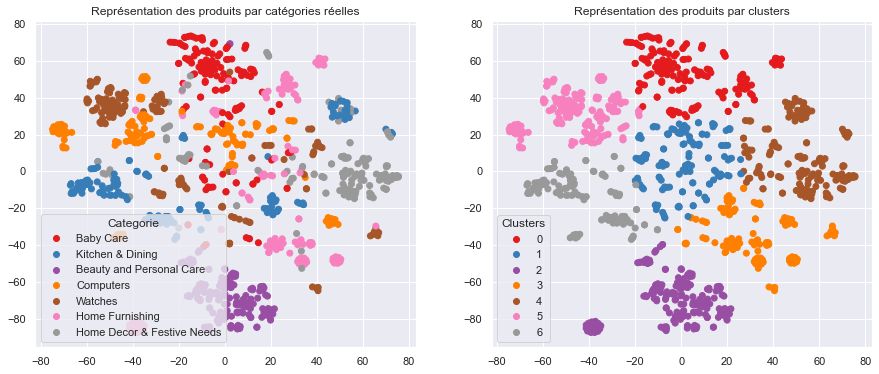

ARI :  0.4026


In [1138]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

10
Tf-idf : 
--------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.486 time :  66.0


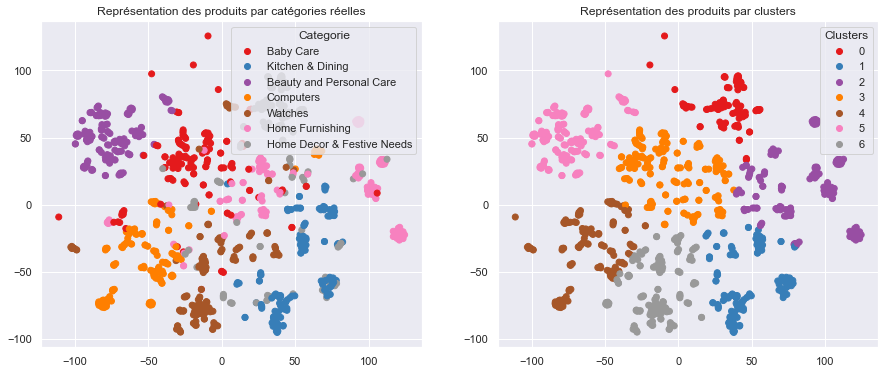

ARI :  0.486
20
Tf-idf : 
--------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.448 time :  66.0


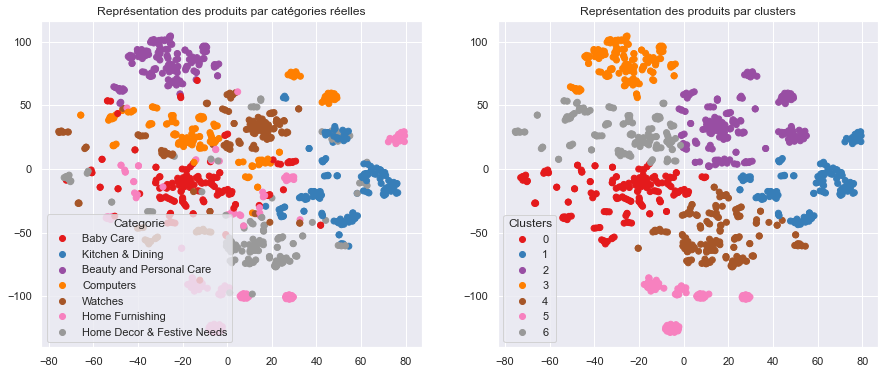

ARI :  0.448
50
Tf-idf : 
--------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.417 time :  68.0


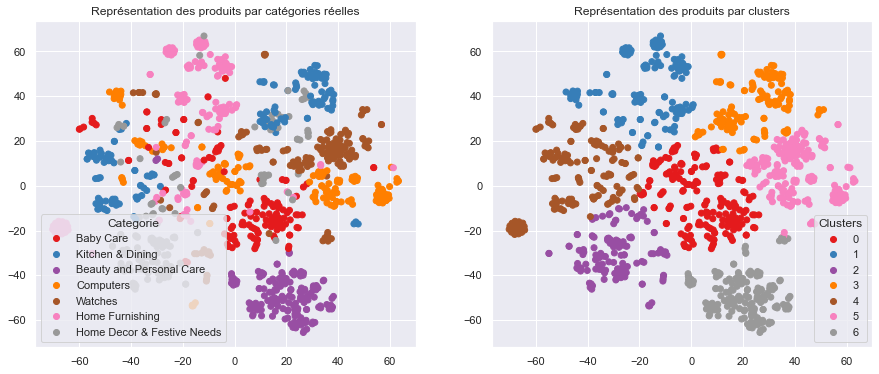

ARI :  0.417
60
Tf-idf : 
--------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3888 time :  68.0


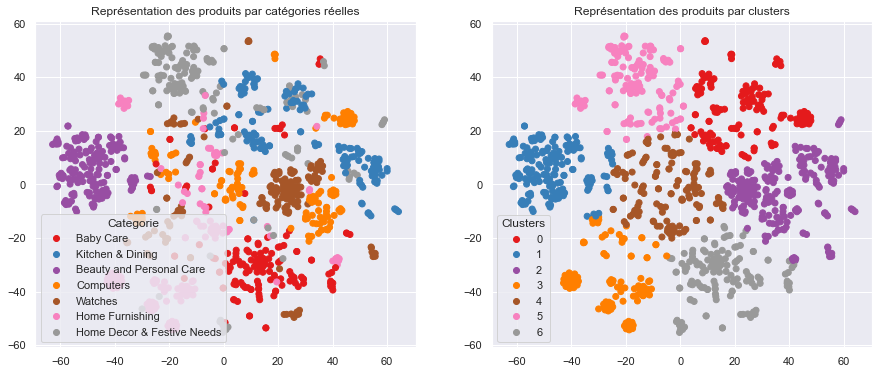

ARI :  0.3888
100
Tf-idf : 
--------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.334 time :  72.0


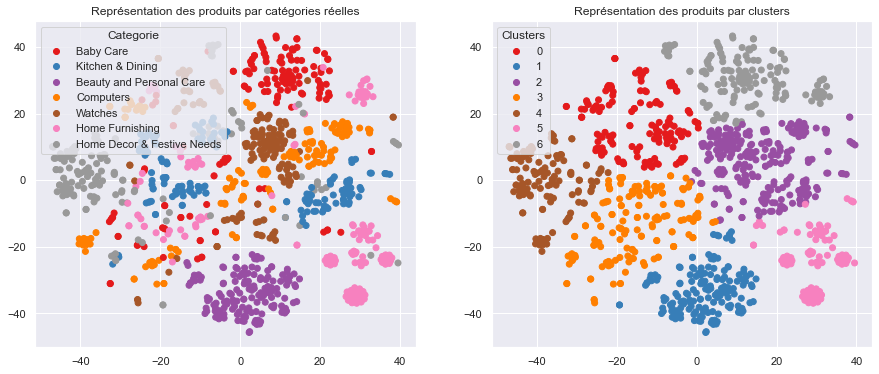

ARI :  0.334
200
Tf-idf : 
--------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3346 time :  69.0


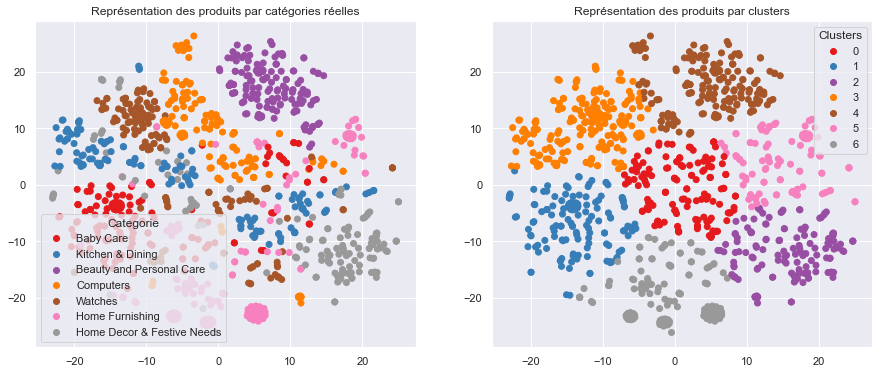

ARI :  0.3346
500
Tf-idf : 
--------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.36 time :  30.0


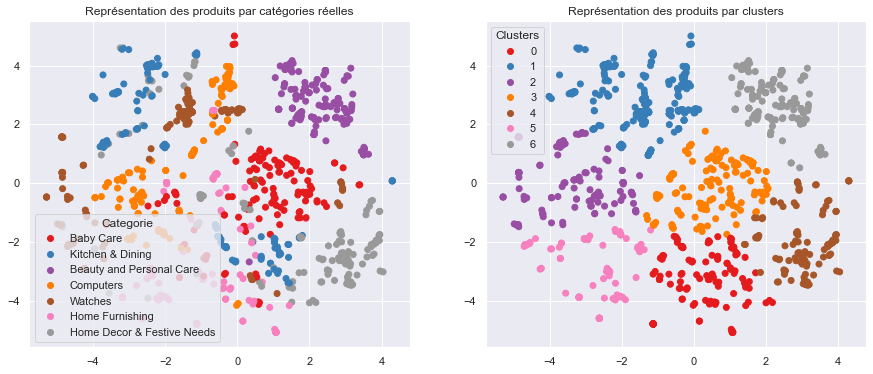

ARI :  0.36
1000
Tf-idf : 
--------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.281 time :  22.0


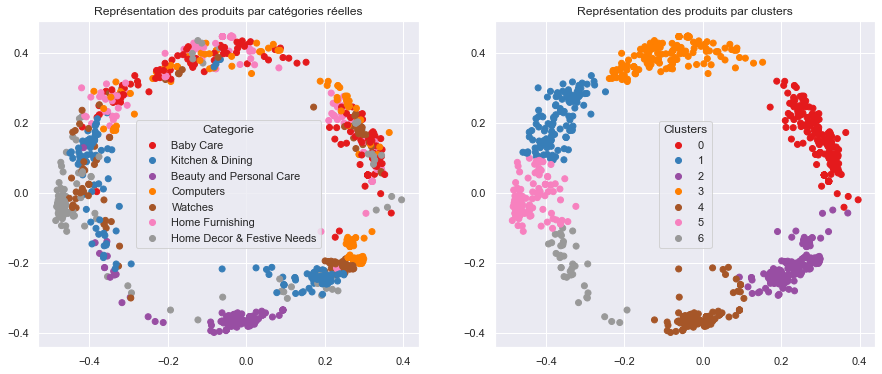

ARI :  0.281


In [1139]:
for i in list_perplexity:
    print(i)
    print("Tf-idf : ")
    print("--------")
    ARI, X_tsne, labels = ARI_fct(X, perplexity = i)
    TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

# Word2vec

In [576]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import gensim

## Création du modèle Word2Vec

In [1091]:
w2v_size=300
w2v_window=5
w2v_min_count=1
w2v_epochs=100
maxlen = 24 # adapt to length of sentences
sentences = data_cat['clean_txt_2'].to_list()# converti la serie en liste.
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]# converti un texte en liste de tokens

In [1092]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                                vector_size=w2v_size,
                                                seed=42,
                                                workers=1)
#                                                workers=multiprocessing.cpu_count())
w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 1386
Word2Vec trained


In [1093]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                                                     maxlen=maxlen,
                                                     padding='post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 1387


## Création de la matrice d'embedding

In [1094]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
w2v_size = 300
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (1387, 300)


## Création du modèle d'embedding

In [1095]:
# Création du modèle

input=Input(shape=(len(x_sentences),maxlen),dtype='float64')
word_input=Input(shape=(maxlen,),dtype='float64')  
word_embedding=Embedding(input_dim=vocab_size,
                         output_dim=w2v_size,
                         weights = [embedding_matrix],
                         input_length=maxlen)(word_input)
word_vec=GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 24)]              0         
                                                                 
 embedding_3 (Embedding)     (None, 24, 300)           416100    
                                                                 
 global_average_pooling1d_3   (None, 300)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 416,100
Trainable params: 416,100
Non-trainable params: 0
_________________________________________________________________


## Exécution du modèle

In [1096]:
embeddings = embed_model.predict(x_sentences)
embeddings.shape

33/33 [==============================] - 0s 1ms/step


(1050, 300)

In [1097]:
ARI, X_tsne, labels = ARI_fct(embeddings, perplexity = 30)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3183 time :  68.0


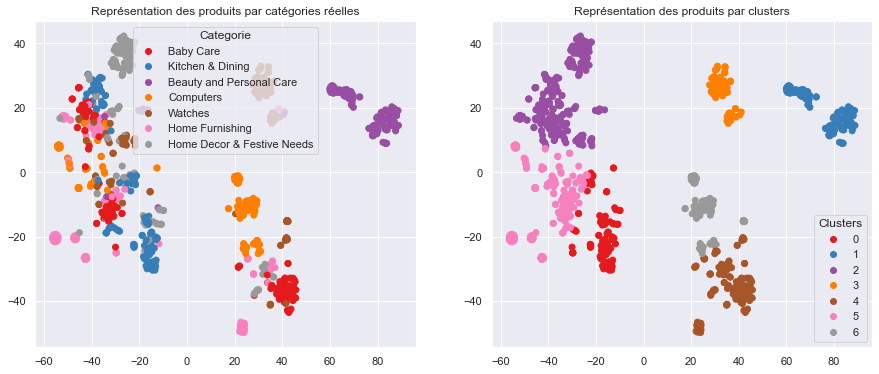

ARI :  0.3183


In [1098]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

10
--------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.308 time :  68.0


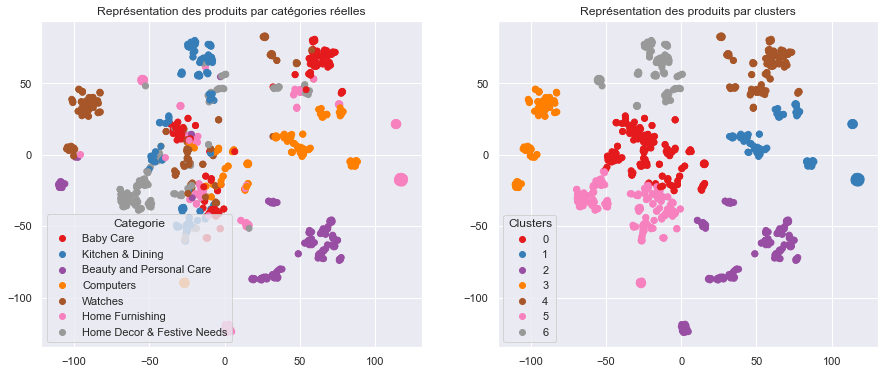

ARI :  0.308
20
--------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3392 time :  66.0


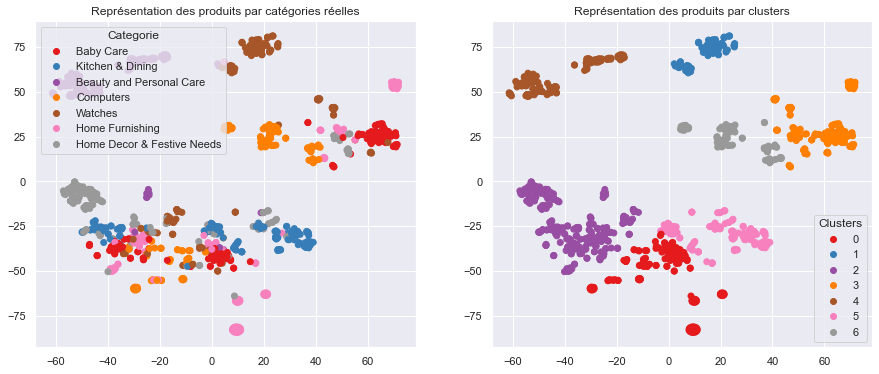

ARI :  0.3392
50
--------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.2902 time :  67.0


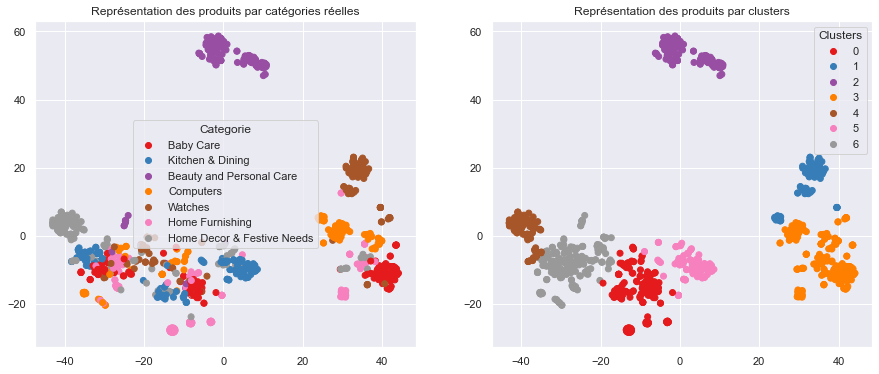

ARI :  0.2902
60
--------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3114 time :  70.0


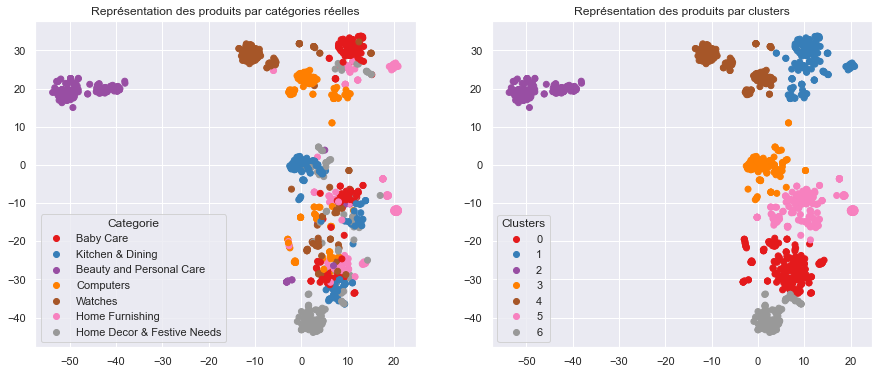

ARI :  0.3114
100
--------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3045 time :  69.0


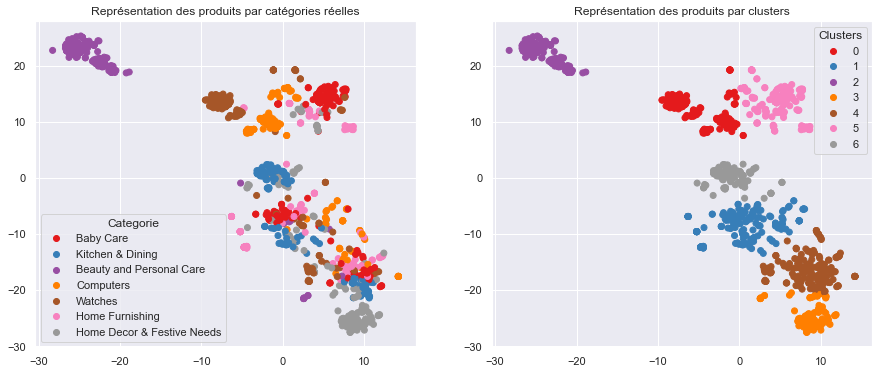

ARI :  0.3045
200
--------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3042 time :  26.0


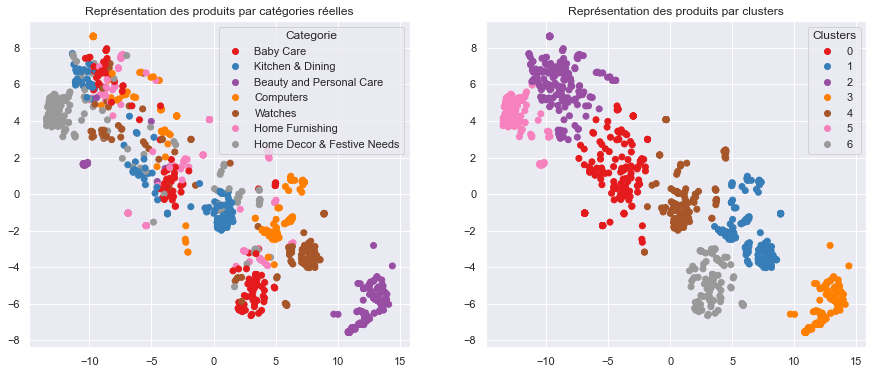

ARI :  0.3042
500
--------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.2551 time :  21.0


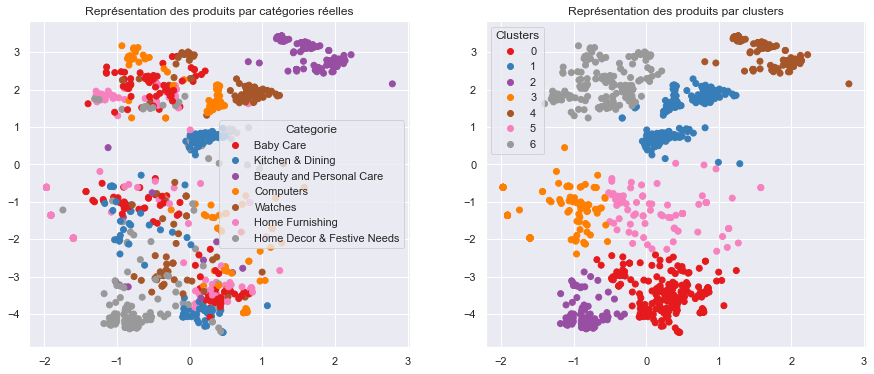

ARI :  0.2551
1000
--------


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.2371 time :  21.0


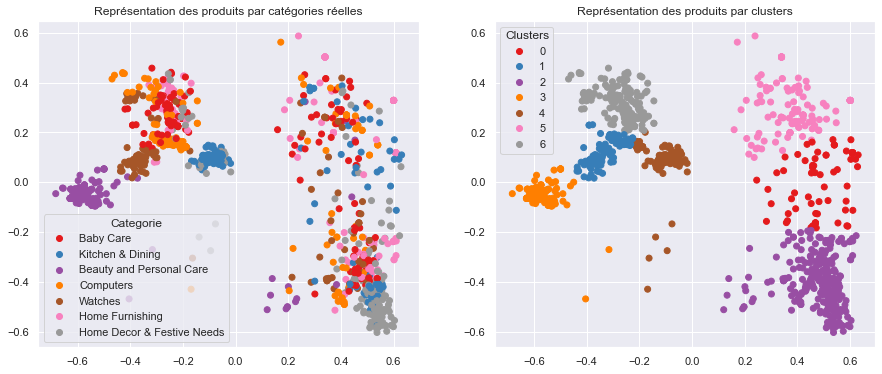

ARI :  0.2371


In [1099]:
for i in list_perplexity:
    print(i)   
    print("--------")
    ARI, X_tsne, labels = ARI_fct(embeddings, perplexity = i)    
    TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

# BERT

In [588]:
import tensorflow as tf
# import tensorflow_hub as hub
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

# Bert
import os
import transformers
from transformers import *

os.environ["TF_KERAS"]='1'

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


Moving 0 files to the new cache system


0it [00:00, ?it/s]

In [589]:
print(tf.__version__)
print(tensorflow.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.10.0
2.10.0
Num GPUs Available:  0
True


## Fonction communes

In [590]:
# Fonction de préparation des sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    

# Fonction de création des features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size], 
                                                                      bert_tokenizer, max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)
     
    return features_bert, last_hidden_states_tot

## BERT HuggingFace

### bert-base-uncased
https://huggingface.co/bert-base-uncased

In [1301]:
max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'
model = TFAutoModel.from_pretrained(model_type)# Récupérer automatiquement le modèle
sentences = data_cat['clean_txt_2'].to_list()

loading configuration file config.json from cache at C:\Users\laeti/.cache\huggingface\hub\models--bert-base-uncased\snapshots\5546055f03398095e385d7dc625e636cc8910bf2\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.22.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading weights file tf_model.h5 from cache at C:\Users\laeti/.cache\huggingface\hub\models--bert-base-uncased\snapshots\5546055f03398095e385d7dc625e636cc8910b

In [1302]:
# Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='HF')

loading configuration file config.json from cache at C:\Users\laeti/.cache\huggingface\hub\models--bert-base-uncased\snapshots\5546055f03398095e385d7dc625e636cc8910bf2\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.22.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading file vocab.txt from cache at C:\Users\laeti/.cache\huggingface\hub\models--bert-base-uncased\snapshots\5546055f03398095e385d7dc625e636cc8910bf2\vocab.t

1/1 [==============================] - 5s 5s/step
temps traitement :  522.0


In [1303]:
ARI, X_tsne, labels = ARI_fct(features_bert, perplexity = 30)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3385 time :  67.0


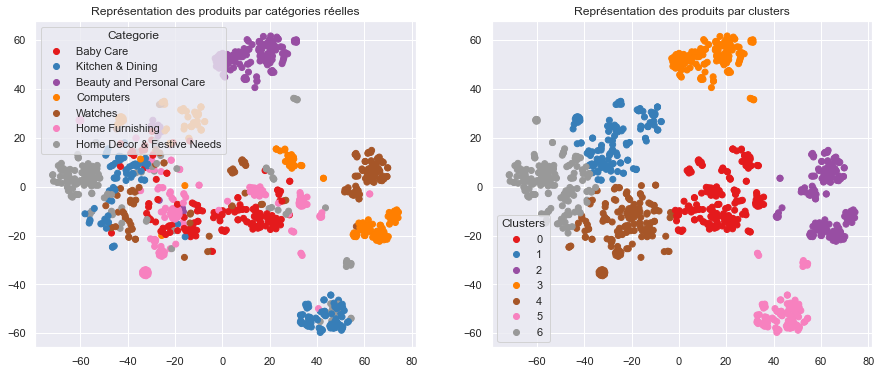

ARI :  0.3385


In [1304]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

10


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3757 time :  68.0


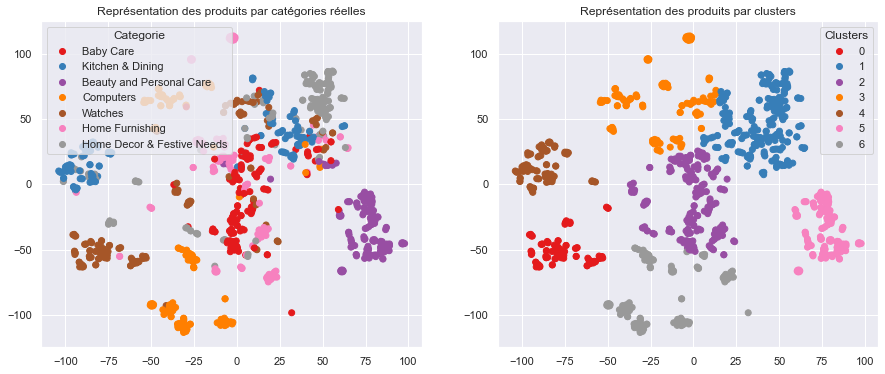

ARI :  0.3757
20


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.349 time :  67.0


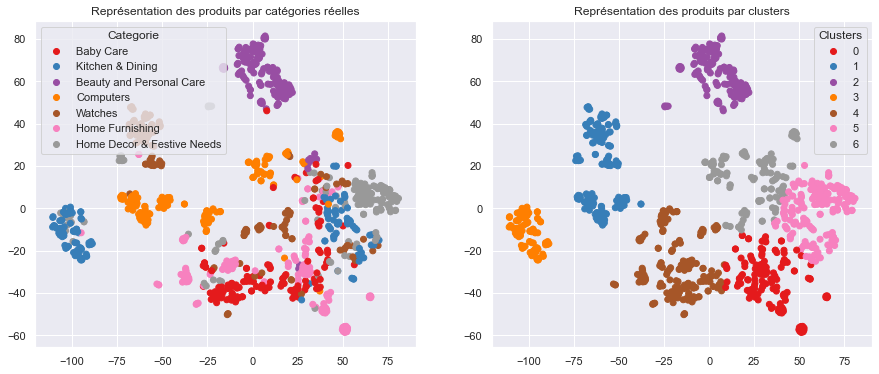

ARI :  0.349
50


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.335 time :  67.0


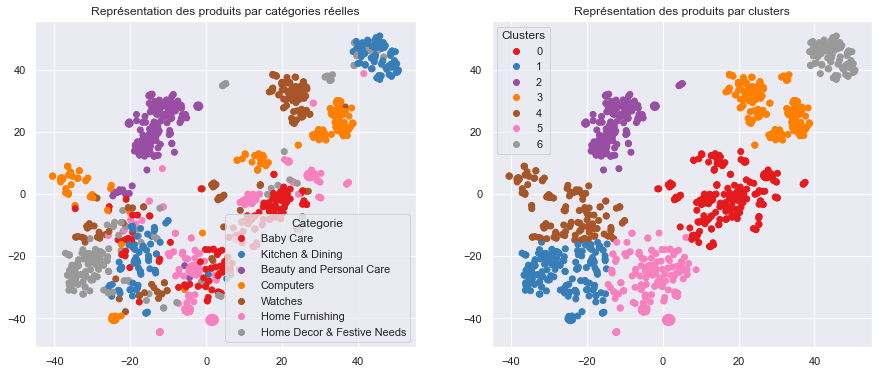

ARI :  0.335
60


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.318 time :  69.0


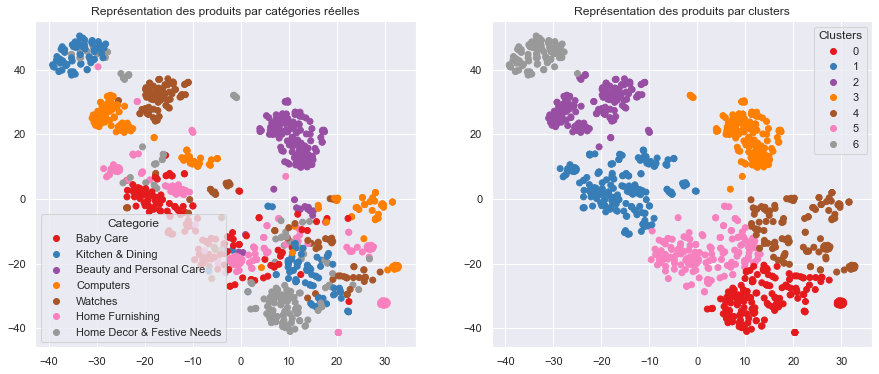

ARI :  0.318
100


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3309 time :  74.0


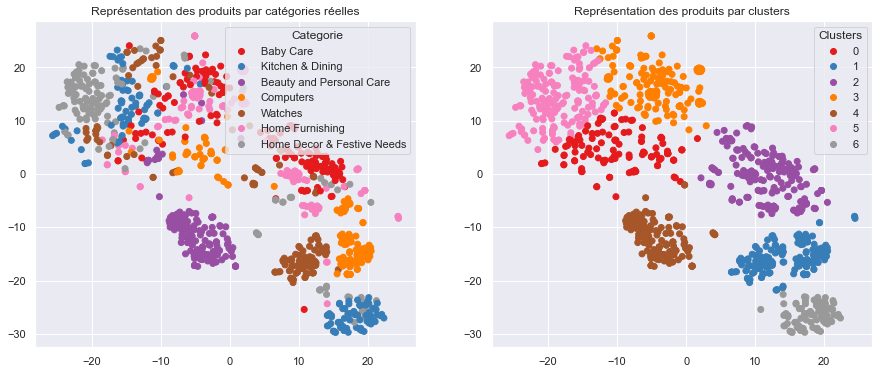

ARI :  0.3309
200


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3372 time :  33.0


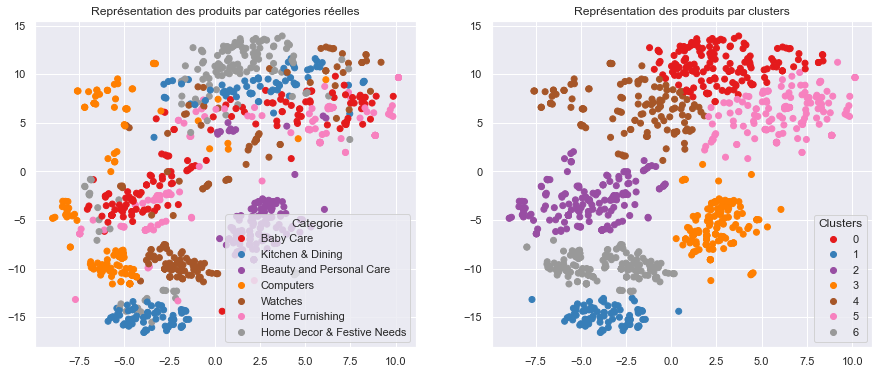

ARI :  0.3372
500


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.2441 time :  23.0


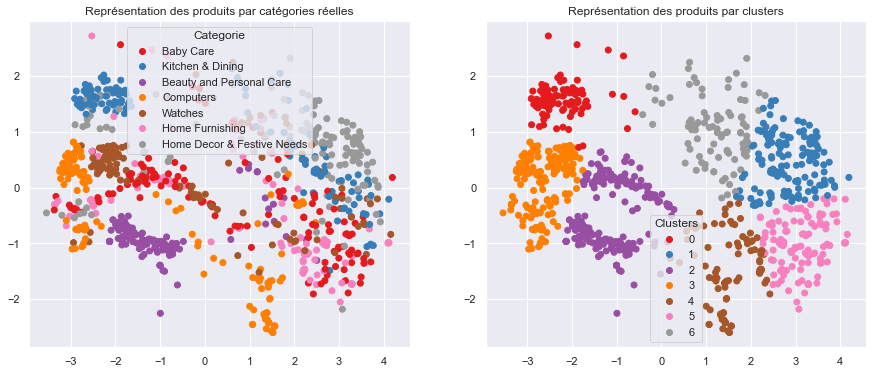

ARI :  0.2441
1000


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.1647 time :  22.0


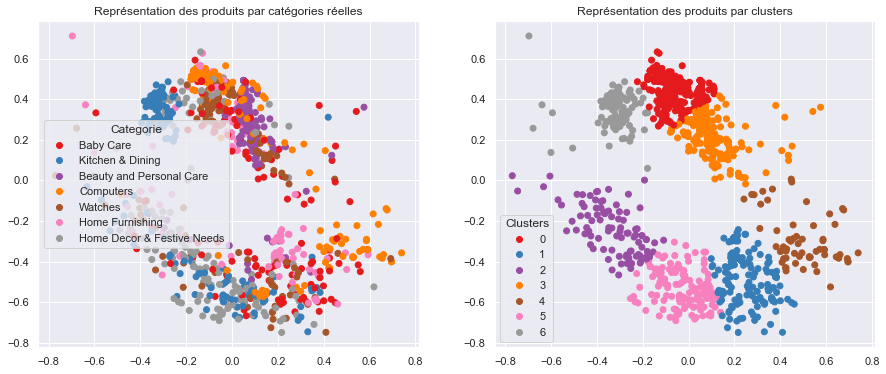

ARI :  0.1647


In [1306]:
for i in list_perplexity:
    print(i)
    ARI, X_tsne, labels = ARI_fct(features_bert, perplexity = i)
    TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

## BERT hub Tensorflow

In [998]:
import tensorflow_hub as hub
import tensorflow_text 

# Guide sur le Tensorflow hub : https://www.tensorflow.org/text/tutorials/classify_text_with_bert
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
bert_layer = hub.KerasLayer(model_url, trainable=True) # Enveloppe un SavedModel (ou un ancien format TF1 Hub) en tant que couche Keras.
#https://www.tensorflow.org/hub/api_docs/python/hub/KerasLayer

In [1114]:
sentences = data_cat['clean_txt_2'].to_list()

In [1115]:
max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'
model = bert_layer

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='TFhub')

loading configuration file config.json from cache at C:\Users\laeti/.cache\huggingface\hub\models--bert-base-uncased\snapshots\0e9f43ffc3afb401b28131d3443a63cb98e5deb8\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.22.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading file vocab.txt from cache at C:\Users\laeti/.cache\huggingface\hub\models--bert-base-uncased\snapshots\0e9f43ffc3afb401b28131d3443a63cb98e5deb8\vocab.t

temps traitement :  87.0


In [1116]:
ARI, X_tsne, labels = ARI_fct(features_bert, perplexity = 30)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3333 time :  73.0


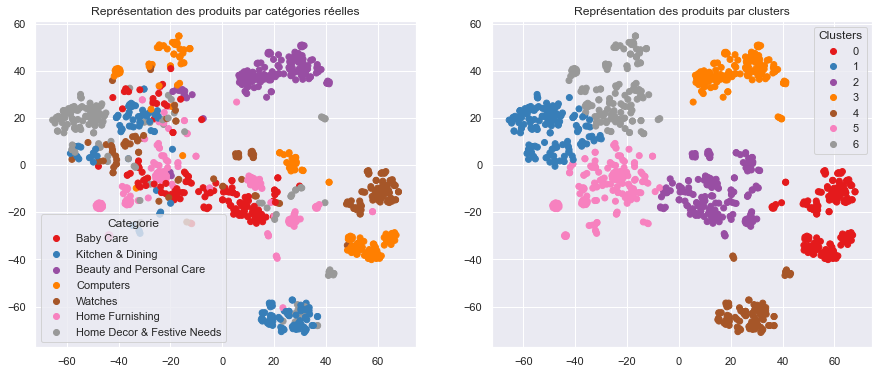

ARI :  0.3333


In [1117]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

10


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3146 time :  70.0


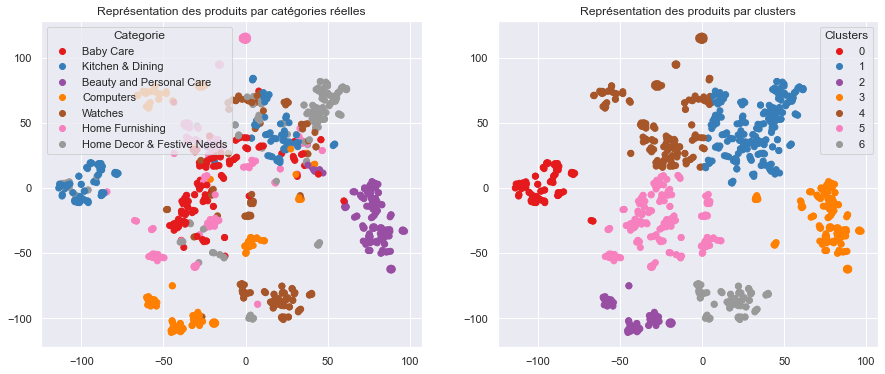

ARI :  0.3146
20


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3579 time :  71.0


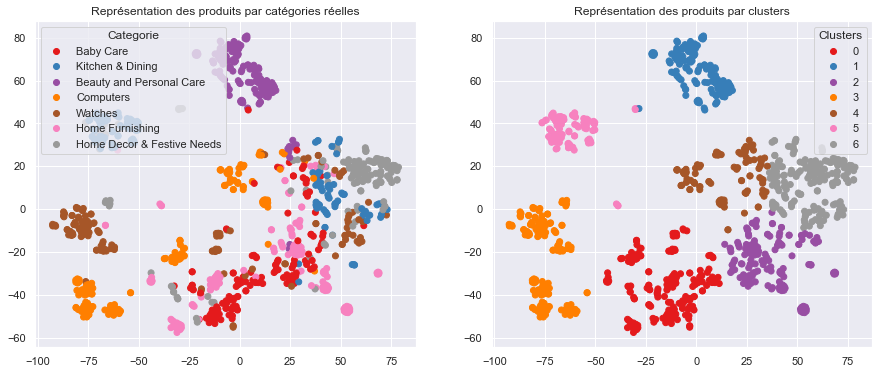

ARI :  0.3579
50


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3271 time :  71.0


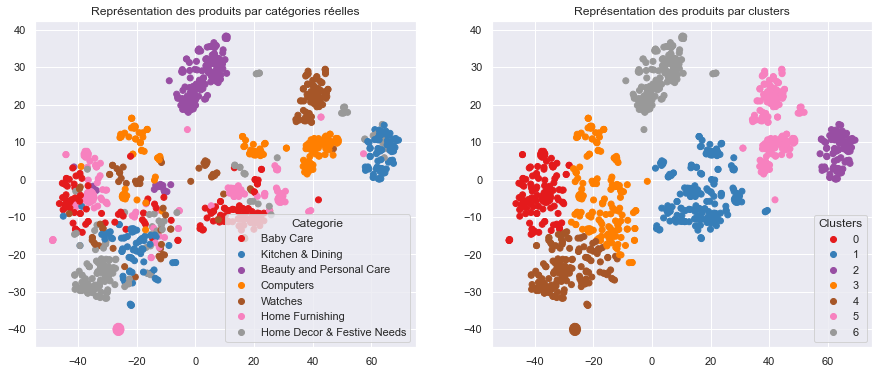

ARI :  0.3271
60


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3286 time :  71.0


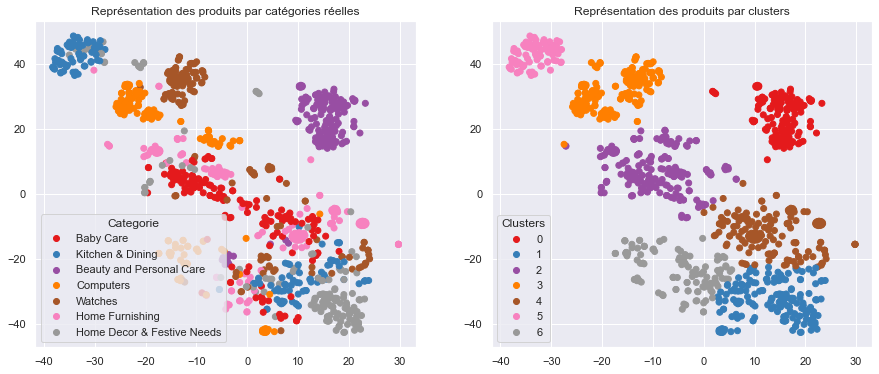

ARI :  0.3286
100


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3338 time :  65.0


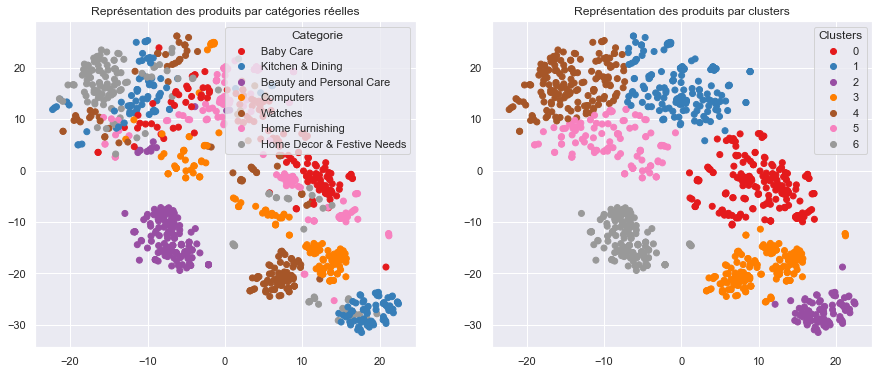

ARI :  0.3338
200


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3298 time :  28.0


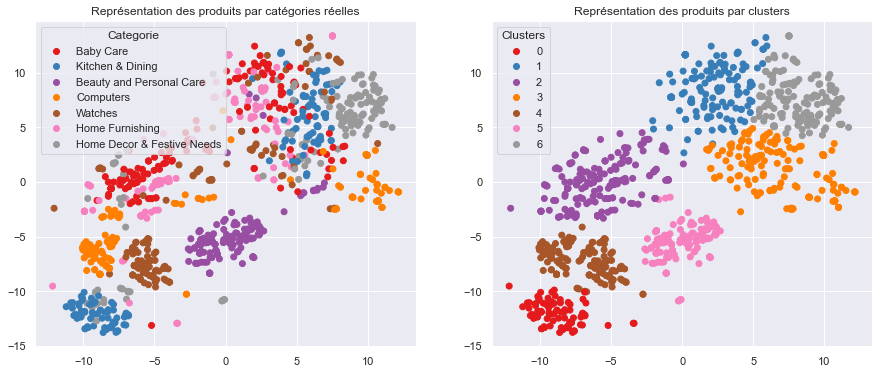

ARI :  0.3298
500


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.2647 time :  27.0


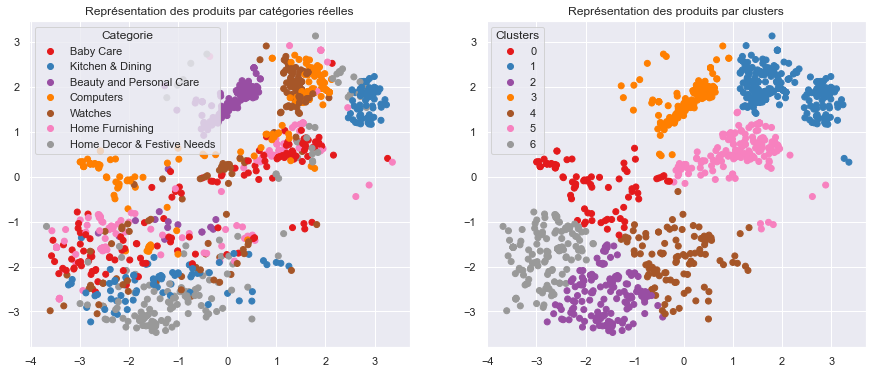

ARI :  0.2647
1000


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.1625 time :  22.0


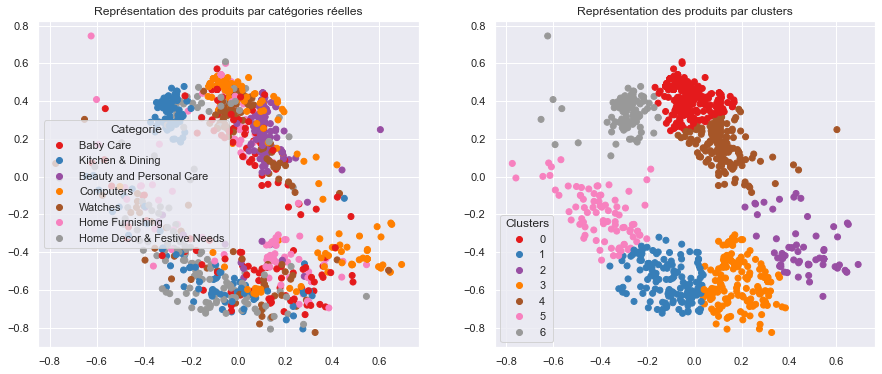

ARI :  0.1625


In [1118]:
for i in list_perplexity:
    print(i)
    ARI, X_tsne, labels = ARI_fct(features_bert, perplexity = i)
    TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

# USE - Universal Sentence Encoder

Universal Sentence Encoder encode le texte en vecteurs de grande dimension qui peuvent être utilisés pour la classification de texte, la similarité sémantique, le regroupement et d'autres tâches en langage naturel. L'encodeur de phrases universel pré-formé est disponible publiquement dans Tensorflow-hub.
[Source : https://towardsdatascience.com/]

In [1004]:
print(tf.__version__)
print(tensorflow.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.10.0
2.10.0
Num GPUs Available:  0
True


In [1005]:
#import tensorflow_hub as hub

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [1006]:
def feature_USE_fct(sentences, b_size) :
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    return features

In [1119]:
batch_size = 10
sentences = data_cat['clean_txt_2'].to_list()

In [1120]:
features_USE = feature_USE_fct(sentences, batch_size)

In [1121]:
ARI, X_tsne, labels = ARI_fct(features_USE, perplexity = 30)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3996 time :  76.0


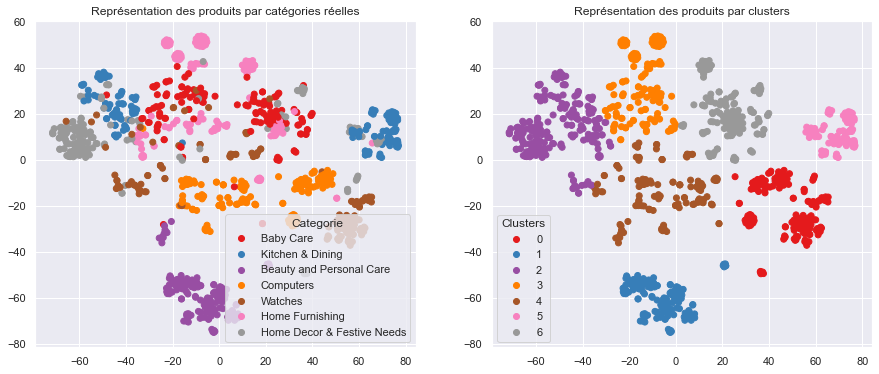

ARI :  0.3996


In [1122]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

10


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.4128 time :  74.0


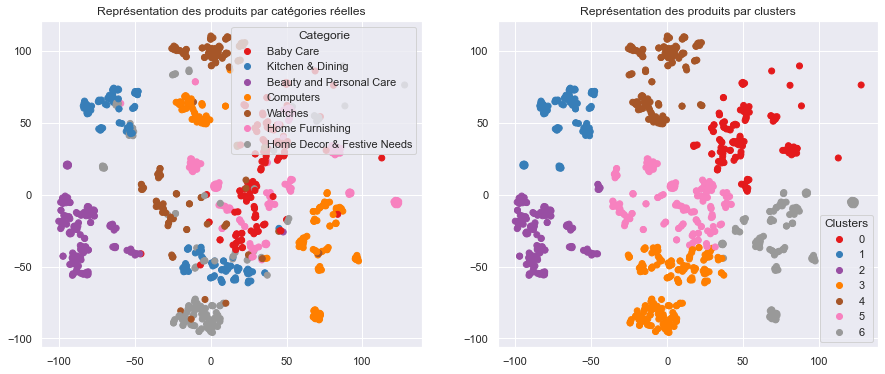

ARI :  0.4128
20


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.4152 time :  74.0


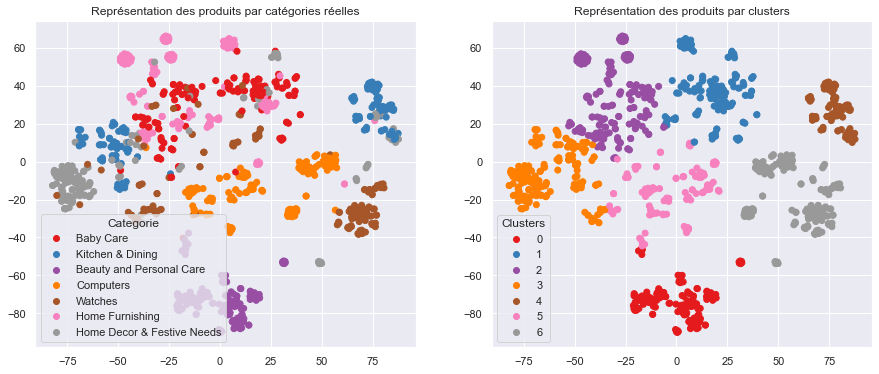

ARI :  0.4152
50


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.4136 time :  71.0


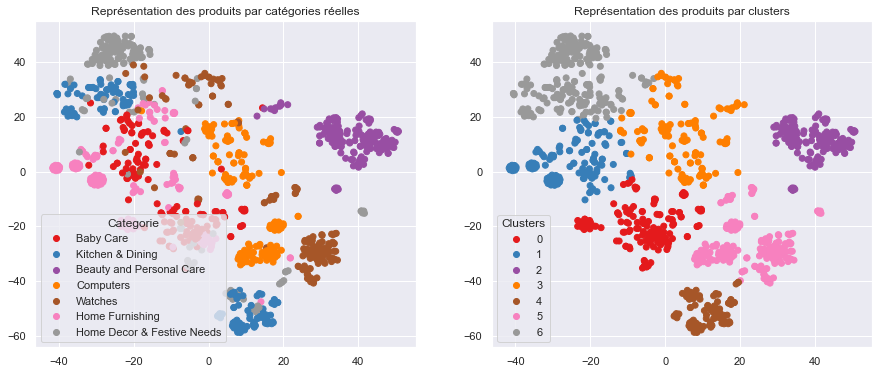

ARI :  0.4136
60


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3793 time :  71.0


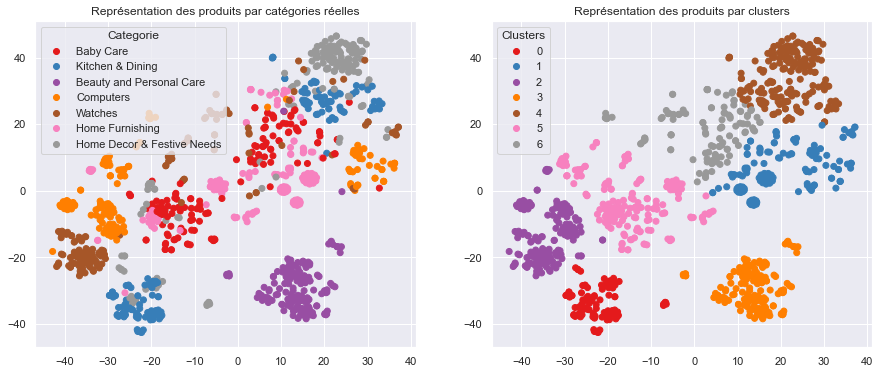

ARI :  0.3793
100


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3773 time :  59.0


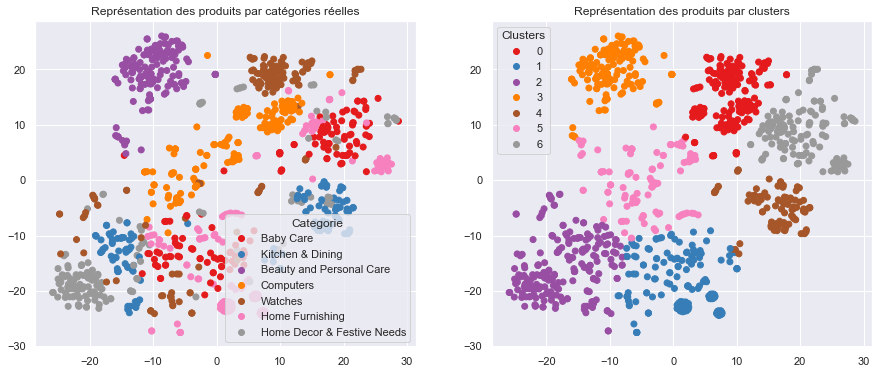

ARI :  0.3773
200


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.3804 time :  33.0


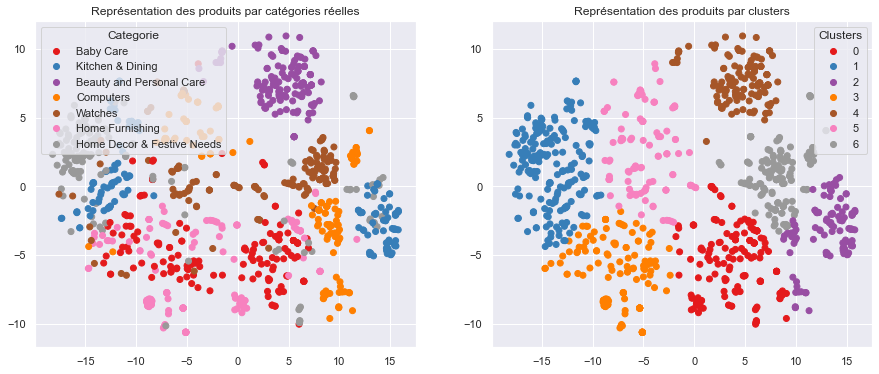

ARI :  0.3804
500


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.31 time :  25.0


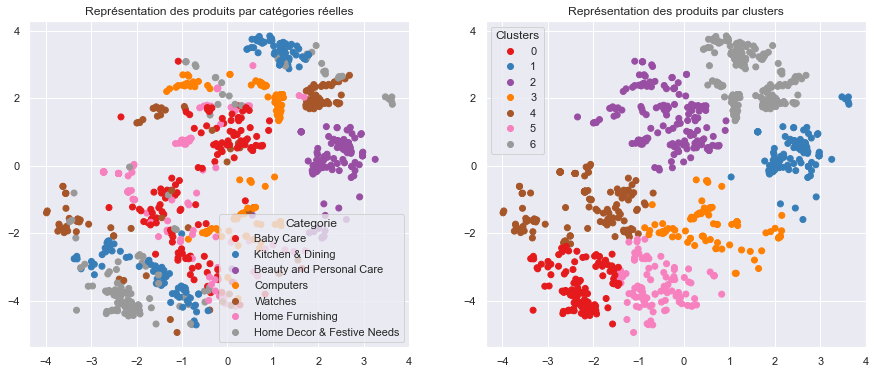

ARI :  0.31
1000


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


ARI :  0.2244 time :  22.0


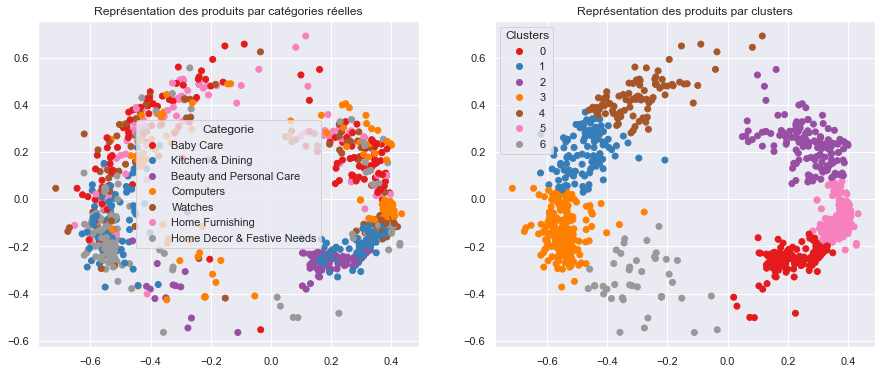

ARI :  0.2244


In [1123]:
for i in list_perplexity:
    print(i)
    ARI, X_tsne, labels = ARI_fct(features_USE, perplexity = i)
    TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI)

# Les images

## importation du dataset

In [898]:
from os import listdir

path = "C:\\Users\\laeti\\Documents\\Formation Data Science\\Projet 6\\Dataset+projet+prétraitement+textes+images\\Flipkart\\Images\\" 
#D:\\Formation Data Science\\Projet 6\\Dataset+projet+prétraitement+textes+images\\Flipkart\\Images\\"
list_photos = [file for file in listdir(path)]
print(len(list_photos))

1050


In [844]:
data_cat.head()

,product_name,product_category_tree,image,is_FK_Advantage_product,description,_len_description,_cat_1,_cat_2,_cat_3,clean_txt
0,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,1420,Home Furnishing,Curtains & Accessories,Curtains,key featur eleg polyest multicolor abstract ey...
1,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,444,Baby Care,Baby Bath & Skin,Baby Bath Towels,specif cotton bath towel bath towel red yellow...
2,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,1258,Baby Care,Baby Bath & Skin,Baby Bath Towels,key featur cotton terri face towel set size sm...
3,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,858,Home Furnishing,Bed Linen,Bedsheets,key featur royal fashion cotton print king siz...
4,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,1197,Home Furnishing,Bed Linen,Bedsheets,key featur print cotton floral king size doubl...


In [830]:
data_cat.drop(['tokens_sans_stop_words', 'longueur_tokens_sans_stop_words', 'tokens_sans_mot_unique', 'longueur_tokens_sans_mot_unique', 'tokens_stemm_lemm' , 'longueur_tokens_stemm_lemm' , 'tokens_anglais_seul', 'longueur_tokens_anglais_seul' , 'tokens_extra_words' , 'longueur_tokens_extra_words'], axis = 1, inplace = True)

In [831]:
data_cat.head()

,product_name,product_category_tree,image,is_FK_Advantage_product,description,_len_description,_cat_1,_cat_2,_cat_3,clean_txt
0,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,1420,Home Furnishing,Curtains & Accessories,Curtains,key featur eleg polyest multicolor abstract ey...
1,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,444,Baby Care,Baby Bath & Skin,Baby Bath Towels,specif cotton bath towel bath towel red yellow...
2,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,1258,Baby Care,Baby Bath & Skin,Baby Bath Towels,key featur cotton terri face towel set size sm...
3,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,858,Home Furnishing,Bed Linen,Bedsheets,key featur royal fashion cotton print king siz...
4,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,1197,Home Furnishing,Bed Linen,Bedsheets,key featur print cotton floral king size doubl...


In [1019]:
from sklearn import preprocessing

data_new = pd.DataFrame()
data_new["image_path"] = data_cat['image']
data_new["label_name"] = data_cat['_cat_1']
le = preprocessing.LabelEncoder()
data_new["label"] = le.fit_transform(data_new["label_name"])


In [1020]:
data_new.head(100)

,image_path,label_name,label
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,4
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,0
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,0
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,4
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,4
...,...,...,...
95,f4d4c2eec77732f56e47722d7a355f2b.jpg,Home Decor & Festive Needs,3
96,f12a06b7dbfc55638afafcf8bb03d836.jpg,Home Decor & Festive Needs,3
97,18bd9b88e23b82fd19f8ab0c9cad6a1a.jpg,Home Decor & Festive Needs,3
98,5749bae8ccead7997ebf370b6b081d07.jpg,Beauty and Personal Care,1


## Affichage d'exemples d'images par label

In [848]:
data_new["label_name"].unique()

array(['Home Furnishing', 'Baby Care', 'Watches',
       'Home Decor & Festive Needs', 'Kitchen & Dining',
       'Beauty and Personal Care', 'Computers'], dtype=object)

In [849]:
list_labels = ['Home Furnishing', 'Baby Care', 'Watches',
       'Home Decor & Festive Needs', 'Kitchen & Dining',
       'Beauty and Personal Care', 'Computers']

Home Furnishing


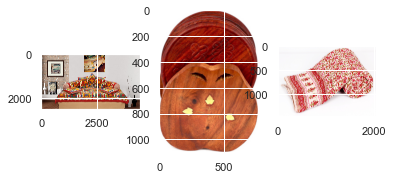

Baby Care


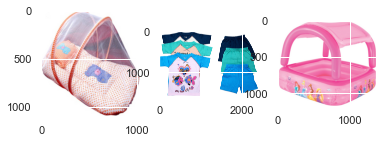

Watches


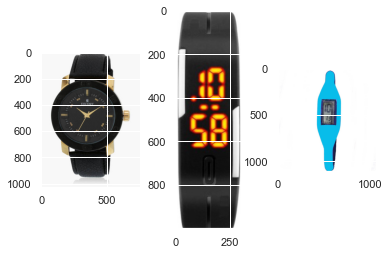

Home Decor & Festive Needs


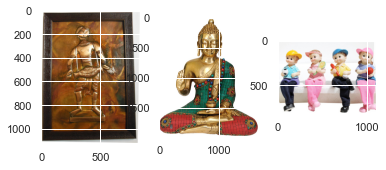

Kitchen & Dining


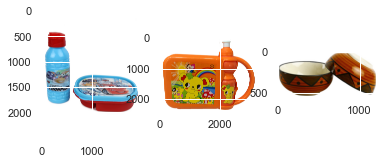

Beauty and Personal Care


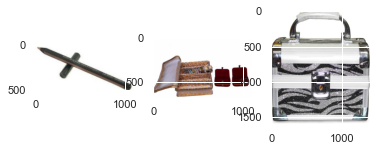

Computers


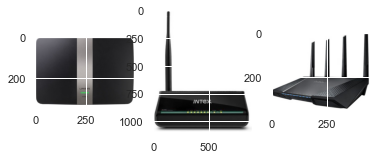

In [1014]:
from matplotlib.image import imread

def list_fct(name) :
    list_image_name = [data_new['image_path'][i] for i in range(len(data_new)) if data_new["label_name"][i]==name]
    return list_image_name

list_Home_Furnishing=[data_new['image_path'] for i in range(len(data_new)) if data_new["label_name"][i]=="Home Furnishing"]
list_Baby_Care=[data_new['image_path'] for i in range(len(data_new)) if data_new["label_name"][i]=="Baby Care"]
list_Watches=[data_new['image_path'] for i in range(len(data_new)) if data_new["label_name"][i]=="Watches"]
list_Home_Decor_Festive_Needs=[data_new['image_path'] for i in range(len(data_new)) if data_new["label_name"][i]=="Home Decor & Festive Needs"]
list_Kitchen_Dining=[data_new['image_path'] for i in range(len(data_new)) if data_new["label_name"][i]=="Kitchen & Dining"]
list_Beauty_and_Personal_Care=[data_new['image_path'] for i in range(len(data_new)) if data_new["label_name"][i]=="Beauty and Personal Care"]
list_Computers=[data_new['image_path'] for i in range(len(data_new)) if data_new["label_name"][i]=="Computers"]

for name in list_labels :
    print(name)
    # print("-------")
    for i in range(3):
        plt.subplot(130 + 1 + i)
        filename = path + list_fct(name)[i+10]
        image = imread(filename)
        plt.imshow(image)
    plt.show()

# SIFT

## Détermination et affichage des descripteurs SIFT

In [870]:
def pixelate(image, pixel_size):
    #image = Image.open(input_file_path)
    image = image.resize(
        (image.size[0] // pixel_size, image.size[1] // pixel_size),
        Image.NEAREST
    )
    image = image.resize(
        (image.size[0] * pixel_size, image.size[1] * pixel_size),
        Image.NEAREST
    )
    image.save("pixelate.jpg")

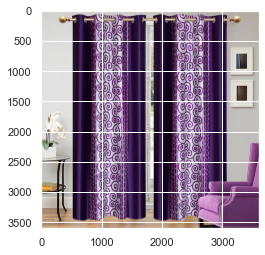

In [1267]:
filename = path+data_new['image_path'][0] #listdir(path+data_new['image_path'][0])
image = imread(filename)
plt.imshow(image)


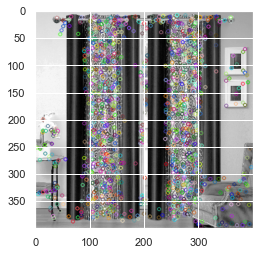

Descripteurs :  (1255, 128)

[[ 36.  74.  40. ...   0.   0.   0.]
 [ 32.   2.   0. ...   0.   0.   7.]
 [  4.   2.   1. ...   0.   0.   9.]
 ...
 [ 17.  28.  30. ...   0.   0.   0.]
 [  0.   0.   0. ...   1.  21. 139.]
 [  0.   0.   0. ...   0.   0.   0.]]


In [913]:
import cv2
from PIL import Image
sift = cv2.SIFT_create()
#image = cv2.imread(path+data_new['image_path'][1],0) # convert in gray
#image = cv2.equalizeHist(image)   # equalize image histogram

filename = path+data_new['image_path'][0] #listdir(path+data_new['image_path'][0])
image = imread(filename)
red = cv2.resize(image, dsize=(400, 400), interpolation=cv2.INTER_CUBIC)
gray = cv2.cvtColor(red, cv2.COLOR_BGR2GRAY)
image = cv2.equalizeHist(gray)#image)   # equalize image histogram

kp, des = sift.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,image)
plt.imshow(img)
plt.show()
print("Descripteurs : ", des.shape)
print()
print(des)

# Pré-traitement des images via SIFT

## Créations des descripteurs de chaque image

In [948]:
# Load images
start = time.time()

filesnames =[]
descriptors = []

for i in range(data_new.shape[0]):
    filesnames.append(path+data_new['image_path'][i])  #listdir(path+data_new['image_path'][0])
    image = imread(filename)
    #red = cv2.resize(image, dsize=(400, 400), interpolation=cv2.INTER_CUBIC)
    gray = cv2.cvtColor(red, cv2.COLOR_BGR2GRAY) # Turn Images to grayscale
    image = cv2.equalizeHist(gray)   # equalize image histogram
    sift = cv2.SIFT_create() 
    kp, des = sift.detectAndCompute(image, None) # Generate SIFT keypoints and descriptors
    descriptors.append(des)
    
des_by_img = np.asarray(descriptors)
all_des = np.concatenate(des_by_img, axis=0)

print("Nombre de descripteurs : ", all_des.shape)

print("Le temps écoulé est")
end = time.time()
print(end - start)

#img1 = imread(filesnames[113])
#plt.imshow(img1)

Nombre de descripteurs :  (1317750, 128)
Le temps écoulé est
168.59791254997253


## Création des clusters de descripteurs

Utilisation de MiniBatchKMeans pour obtenir des temps de traitement raisonnables

In [934]:
from sklearn import cluster, metrics

# Determination number of clusters
temps1=time.time()

k = int(round(np.sqrt(len(all_des)),0))
print("Nombre de clusters estimés : ", k)
print("Création de",k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=0)
kmeans.fit(all_des)

duration1=time.time()-temps1
print("temps de traitement kmeans : ", "%15.2f" % duration1, "secondes")

Nombre de clusters estimés :  1148
Création de 1148 clusters de descripteurs ...


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1836: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


temps de traitement kmeans :            22.07 secondes


## Création des features des images

Pour chaque image :
1. prédiction des numéros de cluster de chaque descripteur
2. création d'un histogramme = comptage pour chaque numéro de cluster du nombre de descripteurs de l'image

Features d'une image = Histogramme d'une image = Comptage pour une image du nombre de descripteurs par cluster

In [935]:
# Creation of histograms (features)
temps1=time.time()

def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist


# Creation of a matrix of histograms
hist_vectors=[]

for i, image_desc in enumerate(des_by_img) :
    if i%100 == 0 : print(i)  
    hist = build_histogram(kmeans, image_desc, i) #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

duration1=time.time()-temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")

0
100
200
300
400
500
600
700
800
900
1000
temps de création histogrammes :            67.86 secondes


## Réduction de dimension

###  Réduction de dimension T-SNE

Réduction de dimension en 2 composantes T-SNE pour affichage en 2D des images

In [1015]:
from sklearn import manifold, decomposition

tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
X_tsne = tsne.fit_transform(im_features)

df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne["class"] = data_new["label_name"]
print(df_tsne.shape)


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


(1050, 3)


## Analyse visuelle : affichage T-SNE selon catégories d'images
* 

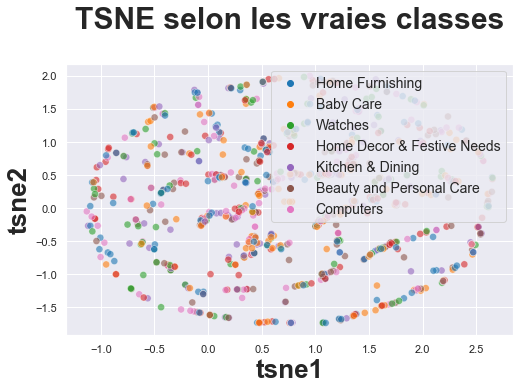

In [1016]:
plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6)

plt.title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

## Analyse mesures : similarité entre catégories et clusters

###  Création de clusters à partir du T-SNE

In [1017]:
from sklearn import cluster, metrics

cls = cluster.KMeans(n_clusters=7, random_state=6)
cls.fit(X_tsne)

df_tsne["cluster"] = cls.labels_
print(df_tsne.shape)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


(1050, 4)


###  Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters
* Le score ARI de 0.002 reste faible

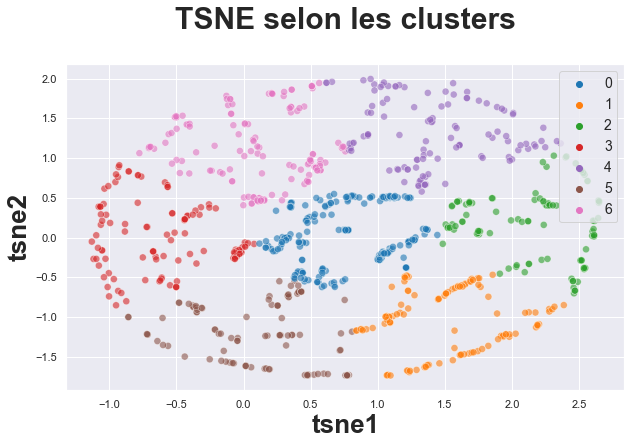

ARI :  0.0022158654351121347


In [1021]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = data_new["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

# CNN 

## Récupération de la base convultionnelle

In [1]:
%%capture

from keras import applications
from keras.applications.resnet import ResNet50

# getting the convulutional base of ResNet50 CNN
conv_base = applications.resnet.ResNet50(
            weights = 'imagenet',
            include_top = False,
            input_shape = (224, 224, 3)
)

## Ajout d'une couche 'GlobalMaxPooling' ou 'Flatten'

Pour une réduction dimensionnelle et une réduction des tenseurs

In [1327]:
from keras.models import Sequential
from keras.layers import GlobalMaxPooling2D
from keras.layers import Flatten

cnn_model = Sequential()  # Création d'un réseau de neurones vide
cnn_model.add(conv_base)
cnn_model.add(Flatten())
cnn_model.summary()


Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 flatten_7 (Flatten)         (None, 100352)            0         
                                                                 
Total params: 23,587,712
Trainable params: 23,534,592
Non-trainable params: 53,120
_________________________________________________________________


## Extraction des features

In [1264]:
data_new.head()

,image_path,label_name,label
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,4
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,0
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,0
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,4
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,4


In [1268]:
print(path)

C:\Users\laeti\Documents\Formation Data Science\Projet 6\Dataset+projet+prétraitement+textes+images\Flipkart\Images\


In [1328]:


del img_CNN
   
import cv2
import os
import numpy as np

#dir_name = r'C:\Users\laeti\Documents\Formation Data Science\Projet 6\Dataset+projet+prétraitement+textes+images\Flipkart\Images'

# for each product
for img_file_name in data_new['image_path']:
    
    # get the file path of the image
    #file_path = os.path.join(dir_name, img_file_name)
    file_path = path+img_file_name
    # open the image as a np.ndarray
    img = imread(file_path)
    
    
    # reshape img to get a tensor
    img = img.reshape(1, img.shape[0], img.shape[1], img.shape[2])
    
    tensor = tf.image.resize(img, [224, 224])

    
    # get the features extracted from the convolutional base
    features_img = cnn_model.predict(tensor)
    print(features_img.shape)
    # check if 'img_CNN' already exists or not
    if 'img_CNN' not in locals():
        # create the features_cnn variable
        img_CNN = features_img
        
    else:
        # concatenate the features_img to features_cnn
        img_CNN = np.concatenate((features_img, img_CNN), axis=0)

 

1/1 [==============================] - 2s 2s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 964ms/step
(1, 100352)
1/1 [==============================] - 1s 923ms/step
(1, 100352)
1/1 [==============================] - 1s 998ms/step
(1, 100352)
1/1 [==============================] - 1s 924ms/step
(1, 100352)
1/1 [==============================] - 1s 946ms/step
(1, 100352)
1/1 [==============================] - 1s 923ms/step
(1, 100352)
1/1 [==============================] - 1s 956ms/step
(1, 100352)
1/1 [==============================] - 1s 927ms/step
(1, 100352)
1/1 [==============================] - 1s 952ms/step
(1, 100352)
1/1 [==============================] - 1s 923ms/step
(1, 100352)
1/1 [==============================] - 1s 952ms/step
(1, 100352)
1/1 [==============================] - 1s 946ms/step
(1, 100352)
1/1 [==============================] - 1s 943ms/step
(1, 100352)
1/1 [==========================

1/1 [==============================] - 1s 941ms/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 956ms/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 964ms/step
(1, 100352)
1/1 [==============================] - 1s 956ms/step
(1, 100352)
1/1 [==============================] - 1s 951ms/step
(1, 100352)
1/1 [==============================] - 1s 971ms/step
(1, 100352)
1/1 [==============================] - 1s 952ms/step
(1, 100352)
1/1 [==============================] - 1s 955ms/step
(1, 100352)
1/1 [==============================] - 1s 924ms/step
(1, 100352)
1/1 [==============================] - 1s 953ms/step
(1, 100352)
1/1 [==============================] - 1s 940ms/step
(1, 100352)
1/1 [==============================] - 1s 940ms/step
(1, 100352)
1/1 [==============================] - 1s 944ms/step
(1, 100352)
1/1 [==========================

1/1 [==============================] - 1s 983ms/step
(1, 100352)
1/1 [==============================] - 1s 975ms/step
(1, 100352)
1/1 [==============================] - 1s 991ms/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 982ms/step
(1, 100352)
1/1 [==============================] - 1s 957ms/step
(1, 100352)
1/1 [==============================] - 1s 985ms/step
(1, 100352)
1/1 [==============================] - 1s 996ms/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 984ms/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 979ms/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 9

1/1 [==============================] - 1s 785ms/step
(1, 100352)
1/1 [==============================] - 1s 780ms/step
(1, 100352)
1/1 [==============================] - 1s 782ms/step
(1, 100352)
1/1 [==============================] - 1s 806ms/step
(1, 100352)
1/1 [==============================] - 1s 820ms/step
(1, 100352)
1/1 [==============================] - 1s 796ms/step
(1, 100352)
1/1 [==============================] - 1s 830ms/step
(1, 100352)
1/1 [==============================] - 1s 901ms/step
(1, 100352)
1/1 [==============================] - 1s 910ms/step
(1, 100352)
1/1 [==============================] - 1s 856ms/step
(1, 100352)
1/1 [==============================] - 1s 883ms/step
(1, 100352)
1/1 [==============================] - 1s 760ms/step
(1, 100352)
1/1 [==============================] - 1s 761ms/step
(1, 100352)
1/1 [==============================] - 1s 771ms/step
(1, 100352)
1/1 [==============================] - 1s 780ms/step
(1, 100352)
1/1 [====================

C:\Users\laeti\Anaconda3\lib\site-packages\PIL\Image.py:3035: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [===

1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [==============================] - 1s 1s/step
(1, 100352)
1/1 [===

## Réduction de dimension T-SNE

In [1329]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
X_tsne = tsne.fit_transform(img_CNN)

df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne["class"] = data_new["label_name"]
print(df_tsne.shape)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


(1050, 3)


## Analyse visuelle : affichage T-SNE selon catégories d'images

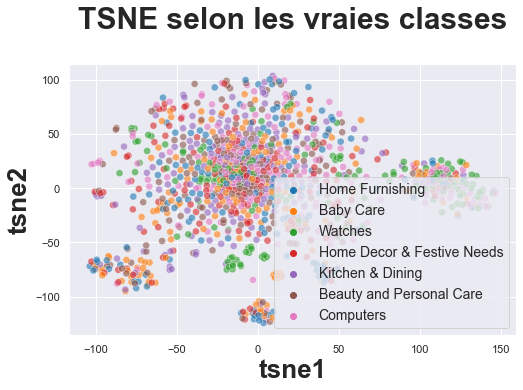

In [1330]:
plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6)

plt.title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

## Analyse mesures : similarité entre catégories et clusters

###  Création de clusters à partir du T-SNE

In [1331]:
cls = cluster.KMeans(n_clusters=7, random_state=6)
cls.fit(X_tsne)

df_tsne["cluster"] = cls.labels_
print(df_tsne.shape)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


(1050, 4)


###  Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters
* Le score ARI de 0.018 reste faible

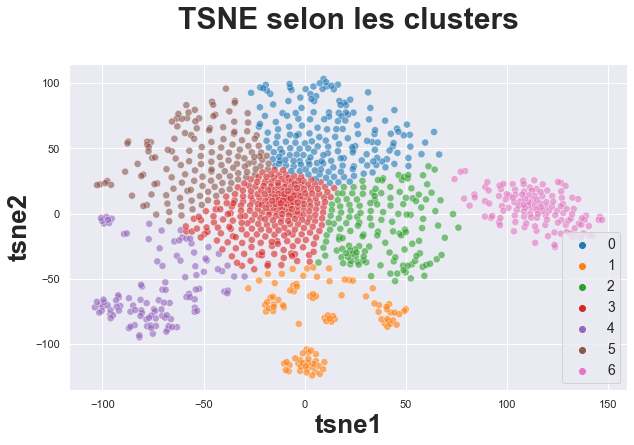

ARI :  0.01986534574734891


In [1332]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = data_new["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

# Les images et le texte

## Création de nouvelles features

In [1336]:
img_CNN.shape

(1050, 100352)

In [1345]:
meilleur_features_text.shape

(1050, 1386)

In [1341]:
new_features_text = meilleur_features_text.toarray()

In [1337]:
## Concaténer les features

In [1342]:
new_features = np.concatenate((new_features_text, img_CNN), axis=1)

In [1344]:
new_features.shape

(1050, 101738)

## Réduction de dimension T-NSE

In [1346]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
X_tsne = tsne.fit_transform(new_features)

df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne["class"] = data_new["label_name"]
print(df_tsne.shape)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


(1050, 3)


## Analyse visuelle : affichage T-SNE selon catégories des images et du texte

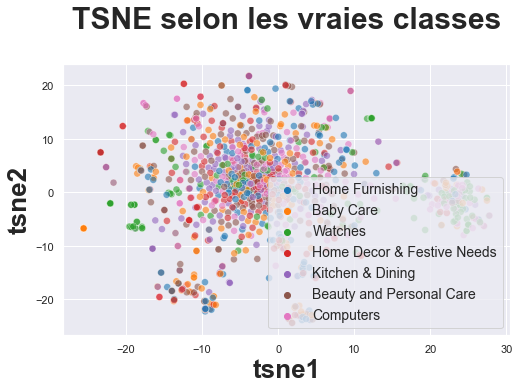

In [1347]:
plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6)

plt.title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

## Analyse mesures : similarité entre catégories et clusters

###  Création de clusters à partir du T-SNE

In [1348]:
cls = cluster.KMeans(n_clusters=7, random_state=6)
cls.fit(X_tsne)

df_tsne["cluster"] = cls.labels_
print(df_tsne.shape)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


(1050, 4)


### Affichage des images et du textes selon clusters et calcul ARI de similarité catégories images-textes/ clusters

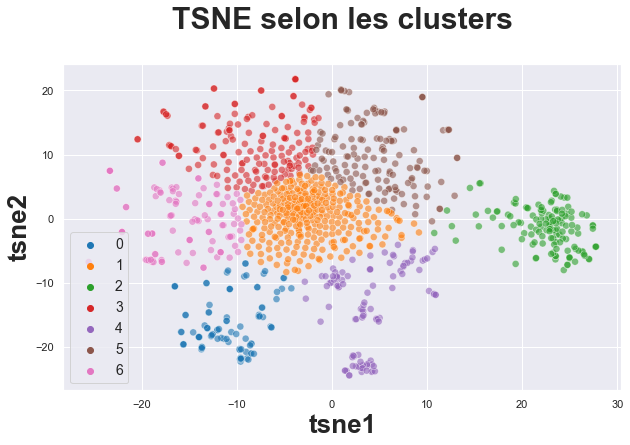

ARI :  0.024529336051369515


In [1349]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = data_new["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))